## Number of possible chords 

Let's see the number of possible chords

In [9]:
from jl_dictionaries import Dictionaries

In [10]:
Dictionaries.get_all_possible_chords()

['C3',
 'C5',
 'C',
 'Cm',
 'Cdim',
 'Caug',
 'Csus2',
 'Csus4',
 'C6',
 'C7',
 'C7-5',
 'Cmaj7b5',
 'C7+5',
 'C6sus2',
 'C7sus2',
 'C7sus4',
 'Cm6',
 'Cm7',
 'CAmMaj7',
 'Cm7b5',
 'Cdim6',
 'CM7',
 'CM7+5',
 'Cadd9',
 'Cmadd9',
 'Cadd2',
 'Cadd4',
 'Cadd11',
 'Csus4(add13)',
 'C6/9',
 'C6add11',
 'Cm6add11',
 'Cadd4add9',
 'C9',
 'Cm9',
 'CM9',
 'C9sus4',
 'C7_6',
 'C7-9',
 'C7+9',
 'C9-5',
 'C9+5',
 'C7#9b5',
 'C7#9#5',
 'C7b9b5',
 'C7b9#5',
 'C11',
 'C7+11',
 'Cm7add11',
 'Cmaj11',
 'Cm11',
 'C7b9#9',
 'C7b9#11',
 'C7#9#11',
 'C7-13',
 'Cm7add4',
 'C9+11',
 'Cm9+11',
 'C13',
 'Cmaj13',
 'Cmadd13',
 'C13sus4',
 'C13-9',
 'C13+9',
 'C13+11',
 'Cm13+11',
 'Cmadd11',
 'Db3',
 'Db5',
 'Db',
 'Dbm',
 'Dbdim',
 'Dbaug',
 'Dbsus2',
 'Dbsus4',
 'Db6',
 'Db7',
 'Db7-5',
 'Dbmaj7b5',
 'Db7+5',
 'Db6sus2',
 'Db7sus2',
 'Db7sus4',
 'Dbm6',
 'Dbm7',
 'DbAmMaj7',
 'Dbm7b5',
 'Dbdim6',
 'DbM7',
 'DbM7+5',
 'Dbadd9',
 'Dbmadd9',
 'Dbadd2',
 'Dbadd4',
 'Dbadd11',
 'Dbsus4(add13)',
 'Db6/9',
 'Db6add1

In [11]:
vocab_size = len(Dictionaries.get_all_possible_chords())
vocab_size

804

Keras provides the one_hot() function that creates a hash of each word as an efficient integer encoding. We will estimate the vocabulary size of 100, which is larger than needed to reduce the probability of collisions from the hash function.

In [12]:
class Encoder:
    def __init__(self,all_chords):
        self.chord_to_number_dict = {}
        self.number_to_chord_dict = {}
        
        for number,chord in enumerate(all_chords):
            
            self.chord_to_number_dict[chord] = number
            self.number_to_chord_dict[number] = chord
            
        print(len(self.chord_to_number_dict))
        print(len(self.number_to_chord_dict))

    def get_chord_from_number(self, number):
        return self.number_to_chord_dict[number]
    
    def get_number_from_chord(self, chord):
        return self.chord_to_number_dict[chord]

In [13]:
encoder = Encoder(Dictionaries.get_all_possible_chords())

804
804


In [14]:
encoder.number_to_chord_dict

{0: 'C3',
 1: 'C5',
 2: 'C',
 3: 'Cm',
 4: 'Cdim',
 5: 'Caug',
 6: 'Csus2',
 7: 'Csus4',
 8: 'C6',
 9: 'C7',
 10: 'C7-5',
 11: 'Cmaj7b5',
 12: 'C7+5',
 13: 'C6sus2',
 14: 'C7sus2',
 15: 'C7sus4',
 16: 'Cm6',
 17: 'Cm7',
 18: 'CAmMaj7',
 19: 'Cm7b5',
 20: 'Cdim6',
 21: 'CM7',
 22: 'CM7+5',
 23: 'Cadd9',
 24: 'Cmadd9',
 25: 'Cadd2',
 26: 'Cadd4',
 27: 'Cadd11',
 28: 'Csus4(add13)',
 29: 'C6/9',
 30: 'C6add11',
 31: 'Cm6add11',
 32: 'Cadd4add9',
 33: 'C9',
 34: 'Cm9',
 35: 'CM9',
 36: 'C9sus4',
 37: 'C7_6',
 38: 'C7-9',
 39: 'C7+9',
 40: 'C9-5',
 41: 'C9+5',
 42: 'C7#9b5',
 43: 'C7#9#5',
 44: 'C7b9b5',
 45: 'C7b9#5',
 46: 'C11',
 47: 'C7+11',
 48: 'Cm7add11',
 49: 'Cmaj11',
 50: 'Cm11',
 51: 'C7b9#9',
 52: 'C7b9#11',
 53: 'C7#9#11',
 54: 'C7-13',
 55: 'Cm7add4',
 56: 'C9+11',
 57: 'Cm9+11',
 58: 'C13',
 59: 'Cmaj13',
 60: 'Cmadd13',
 61: 'C13sus4',
 62: 'C13-9',
 63: 'C13+9',
 64: 'C13+11',
 65: 'Cm13+11',
 66: 'Cmadd11',
 67: 'Db3',
 68: 'Db5',
 69: 'Db',
 70: 'Dbm',
 71: 'Dbdim',
 72: '

## Prepare data 

In [15]:
from jl_song_data import SongData
from jl_constants import NUMBER_OF_NOTES

In [16]:
data = SongData('../data/chords_clean_1_2_3_4_5_6.csv')
df = data.df

In [17]:
df['chords'] = df['chords'].apply(eval)

In [18]:
from jl_chord_parser import ChordParser
parse = ChordParser().parse

In [19]:
df['chord_numbers'] = df['chords']\
        .apply(lambda chords: [parse(chord) for chord in chords])\
        .apply(lambda chords: [encoder.get_number_from_chord(chord.standard_name) for chord in chords if chord is not None ] )

In [21]:
df.sample(10)

,url,name,decade,genre,chords,uuid,chord_numbers
5116,https://tabs.ultimate-guitar.com/tab/grateful-...,Morning Dew,1960s,Country,"[D, C, F, D, D, C, G, D, D, C, G, D, F, C, Em,...",275cc2ae-fb3d-435d-83fc-8ad4cad97bb5,"[136, 2, 337, 136, 136, 2, 471, 136, 136, 2, 4..."
6632,https://tabs.ultimate-guitar.com/tab/johnny-ca...,One,2000s,Country,"[Am, D, F, G, Am, D, F, G, Am, D, F, G, C, Am,...",adac06be-c548-4ac7-92c1-76c5089dbcab,"[606, 136, 337, 471, 606, 136, 337, 471, 606, ..."
3793,https://tabs.ultimate-guitar.com/tab/elvis-pre...,Do You Know Who I Am,1960s,Rhythm And Blues,"[C#, Db, C, Dm/C, Cmaj7, Dm/C, Cmaj7, Dm/G, C,...",13c7419d-10f3-4908-862b-853ad843f676,"[69, 69, 2, 137, 21, 137, 21, 137, 2, 2, 137, ..."
12996,https://tabs.ultimate-guitar.com/tab/tom_petty...,I Wont Back Down,1980s,Rock,"[Em, D, G, Em, D, G, Em, D, G, Em, D, G, Em, D...",e884c742-51dc-4681-941e-c4c60735b018,"[271, 136, 471, 271, 136, 471, 271, 136, 471, ..."
10412,https://tabs.ultimate-guitar.com/tab/rick-spri...,Jessies Girl,1980s,Rock,"[D, A, Bm, G, A, D, D, A, Bm, G, A, D, D, A, B...",6892fb9e-8f79-41c3-88d4-be36c7ef0d03,"[136, 605, 740, 471, 605, 136, 136, 605, 740, ..."
8623,https://tabs.ultimate-guitar.com/tab/michael-j...,Heal The World,1990s,Pop%%Contemporary R&b%%Rock,"[A, Bm7, C#m, Bm7, A, Bm7, C#m, Bm7, A, Bm7, C...",dbf799b4-fcef-491c-aeec-4fb030511968,"[605, 754, 70, 754, 605, 754, 70, 754, 605, 75..."
13702,https://tabs.ultimate-guitar.com/tab/weird_al_...,Close But No Cigar,2000s,Comedy,"[D, D, Dsus4, D, D, G, D, G, A, G, D, G, Am, G...",c1a84398-4a28-41db-a8df-2dd3aaf0e3c9,"[136, 136, 141, 136, 136, 471, 136, 471, 605, ..."
10217,https://tabs.ultimate-guitar.com/tab/ray-charl...,Carry Me Back To Old Virginny,1960s,Jazz,"[G7, C, E, F, F#, G/C, A, D, G, C, E, F, F#, G...",0ecc546d-2aea-4e4d-93c9-a43b272ddf83,"[478, 2, 270, 337, 404, 471, 605, 136, 471, 2,..."
2741,https://tabs.ultimate-guitar.com/tab/cyndi-lau...,True Colors,1980s,Pop%%Pop%%Pop%%Rock,"[Am, G, C, F, Am, G, C, F, Am, G, C, F9, Dm, D...",e0046427-86fe-400e-8367-f06d30330a2d,"[606, 471, 2, 337, 606, 471, 2, 337, 606, 471,..."
10907,https://tabs.ultimate-guitar.com/tab/seeed/lov...,Lovelee,2010s,Reggae,"[G#m, C#m7, D#m7, B, G#m, G, E, C#m, G#m, C#m7...",f5e4cbc7-18cf-481f-bc21-ab2bdc429b4c,"[539, 84, 218, 739, 539, 471, 270, 70, 539, 84..."


In [22]:
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Dropout
from keras.layers import Embedding
from keras.layers.recurrent import LSTM
from keras import optimizers
from keras.utils import to_categorical

In [23]:
df = df[df['chord_numbers'].apply(lambda chords: len(chords) > 5)]

In [24]:
df.iloc[0]

url              https://tabs.ultimate-guitar.com/tab/10000_man...
name                                                     Dont Talk
decade                                                       1980s
genre                                                         Folk
chords           [D, Dmaj7, D, Dmaj7, D, Dmaj7, D, Dmaj7, D, Dm...
uuid                          c639eb23-fefd-4263-af20-3f78f110edcd
chord_numbers    [136, 155, 136, 155, 136, 155, 136, 155, 136, ...
Name: 0, dtype: object

In [25]:
import numpy as np

In [26]:
maxlen = 5
step = 1
sentences = []
next_chords = []

for index, row in df.iterrows():
    sequence = row['chord_numbers']
    for i in range(0, len(sequence) - maxlen, step):
        sentences.append(sequence[i: i + maxlen])
        next_chords.append(sequence[i + maxlen])

In [27]:
len(sentences)

1136924

In [28]:
len(next_chords)

1136924

In [29]:
sentences[0]

[136, 155, 136, 155, 136]

In [30]:
next_chords[0]

155

In [31]:
next_chords = to_categorical(next_chords, num_classes=vocab_size)

In [32]:
len(next_chords[0])

804

In [33]:
X = np.array(sentences)

In [34]:
Y = np.array(next_chords)

##  Utils

In [63]:
def sample(preds, temperature=1.0):
    # helper function to sample an index from a probability array
    preds = np.asarray(preds).astype('float64')
    preds = np.log(preds) / temperature
    exp_preds = np.exp(preds)
    preds = exp_preds / np.sum(exp_preds)
    probas = np.random.multinomial(1, preds, 1)
    return np.argmax(probas)

In [37]:
def cos_similarity(a,b):
    dot = np.dot(a, b)
    norma = np.linalg.norm(a)
    normb = np.linalg.norm(b)
    cos = dot / (norma * normb)
    
    return cos

In [38]:
from random import randint

def get_most_similar_chord(predicted):
    greatest_similarity = 0
    most_similar = None
    
    for chord in possible_chord_vectors.keys():
        similarity = cos_similarity(predicted, possible_chord_vectors[chord])
        
        if similarity > greatest_similarity:
            greatest_similarity = similarity
            most_similar = chord
    
    print(f'Most similar: {chord}. Similarity: {greatest_similarity}')
    
    return most_similar

def get_most_similar_chord_2(predicted):
    distance_function = lambda a,b: np.linalg.norm(a-b)
    lowest_distance = 10000000000
    most_similar = None
    
    for chord in possible_chord_vectors.keys():
        distance = distance_function(predicted, possible_chord_vectors[chord])
        
        if distance < lowest_distance:
            lowest_distance = distance
            most_similar = chord
    
    print(f'Most similar: {chord}. Distance: {lowest_distance}')
    
    return most_similar

def get_most_similar_ranking(prediction_chord, distance_function):
    df = pd.DataFrame()
    
    similar_chords = pd.DataFrame(possible_chord_vectors.keys(), columns=['chord'])
    similar_chords['similarity'] = similar_chords['chord'].apply(\
        lambda chord: distance_function(possible_chord_vectors[chord],prediction_chord[0]))
    
    return similar_chords.sort_values(by='similarity')

def get_most_similar_chord(prediction_chord):
    value = randint(0, 10)
    chord = get_most_similar_ranking(prediction_chord,lambda a,b: np.linalg.norm(a-b) ).iloc[0]['chord']
    print(chord)
    return chord
    

In [64]:
from music21.chord import Chord
from music21.stream import Stream

def show_sequence(chord_sequence):
    parser = ChordParser()
    stream = Stream()
    
    print(chord_sequence)
    chord_sequence = [chord_sequence[0], *chord_sequence] # to solve a music21 problem

    for chord_str in chord_sequence:
        extended_chord = parser.parse(chord_str)
        chord = Chord(notes=extended_chord.components, type='whole')
        stream.append(chord)

    stream.show()
    stream.show('midi')

## Fit 

In [65]:
from keras.callbacks.callbacks import ModelCheckpoint
from keras.callbacks import Callback

In [66]:
def create_model():
    # https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
    # https://medium.com/towards-artificial-intelligence/sentence-prediction-using-word-level-lstm-text-generator-language-modeling-using-rnn-a80c4cda5b40
    model = Sequential()
    model.add(Embedding(vocab_size, maxlen,input_length=maxlen))
    model.add(LSTM(50,return_sequences=True))
    model.add(LSTM(50))
    model.add(Dense(50,activation='relu'))
    model.add(Dense(vocab_size,activation='softmax'))
    opt_adam = optimizers.adam(lr=0.001)
    model.compile(loss='categorical_crossentropy',optimizer=opt_adam,metrics=['accuracy'])
    model.summary()
    
    return model

In [69]:
class PredictionCallback(Callback):    
    def on_epoch_end(self, epoch, logs={}):
        print(f'Epoch: {epoch+1}')
        
        for diversity in [0.8, 1.0, 1.2]:
            print(f'Diversity: {diversity}')
            chord_str = ['Am', 'E', 'Am', 'Dm', 'E']

            for i in range(0,20):
                last_five = chord_str[-5:]
                last_five_encoded = [encoder.get_number_from_chord(chord) for chord in last_five]
                prediction = self.model.predict(np.array(np.array([last_five_encoded])))[0]
                chord_index = sample(prediction, diversity)
                chord_str.append(encoder.get_chord_from_number(chord_index))

            show_sequence(chord_str)
            
        print(f'Direct prediction: {diversity}')
        chord_str = ['Am', 'E', 'Am', 'Dm', 'E']

        for i in range(0,20):
            last_five = chord_str[-5:]
            last_five_encoded = [encoder.get_number_from_chord(chord) for chord in last_five]
            chord_index = self.model.predict_classes(np.array(np.array([last_five_encoded])))[0]
            chord_str.append(encoder.get_chord_from_number(chord_index))

        show_sequence(chord_str)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_7 (Embedding)      (None, 5, 5)              4020      
_________________________________________________________________
lstm_13 (LSTM)               (None, 5, 50)             11200     
_________________________________________________________________
lstm_14 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_13 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_14 (Dense)             (None, 804)               41004     
Total params: 78,974
Trainable params: 78,974
Non-trainable params: 0
_________________________________________________________________


/opt/anaconda3/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/50
1136924/1136924 [==============================] - 94s 83us/step - loss: 2.5400 - accuracy: 0.2594

Epoch 00001: loss improved from inf to 2.53997, saving model to word_pred_Model4_2.h5
Epoch: 1
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Dm', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'E', 'E', 'Am', 'E', 'E', 'E7', 'D', 'E', 'E', 'E7']


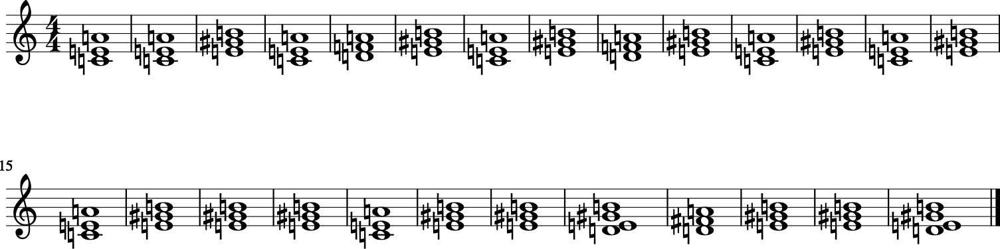

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'E', 'G', 'C', 'G', 'D', 'Bm', 'F', 'C', 'D', 'C', 'G', 'Am', 'D', 'C', 'G', 'C', 'D']


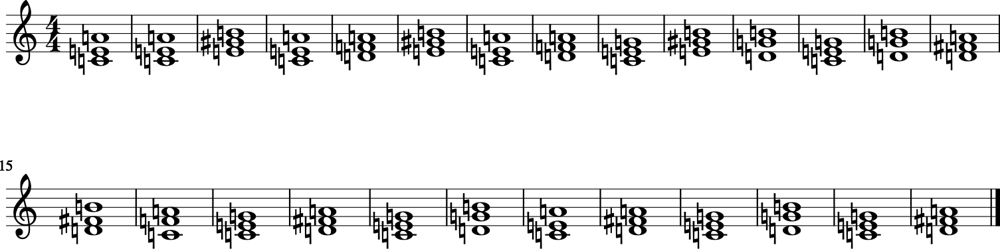

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'C', 'F', 'G', 'Am', 'F', 'C', 'Am', 'E', 'F', 'C', 'Am', 'Asus4', 'F', 'D', 'D', 'Am', 'E', 'Em']


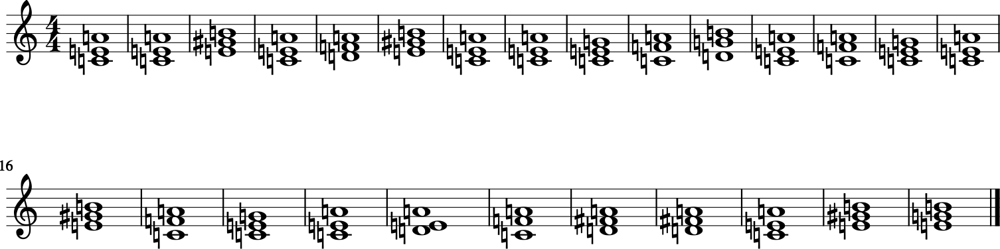

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E']


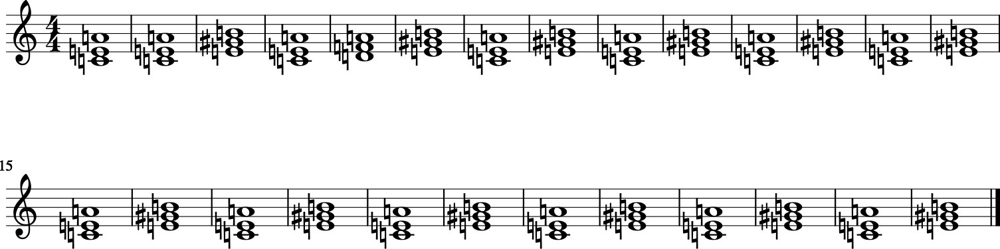

Epoch 2/50
1136924/1136924 [==============================] - 105s 92us/step - loss: 2.1943 - accuracy: 0.3938

Epoch 00002: loss improved from 2.53997 to 2.19435, saving model to word_pred_Model4_2.h5
Epoch: 2
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'Em', 'Dm', 'Dm', 'Dm', 'Em', 'Bb', 'Dm', 'Dm', 'Dm', 'Am', 'Dm', 'Dm', 'Dm']


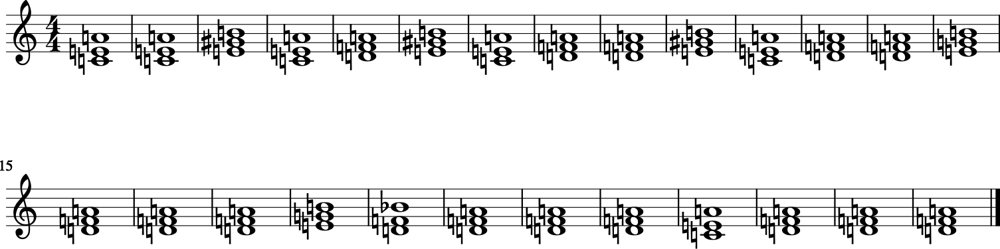

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'C', 'Dm', 'G7', 'C', 'F', 'C', 'Fsus2', 'Cadd9', 'G', 'C', 'F', 'F', 'Am', 'F', 'C', 'F', 'Am', 'F', 'B', 'C']


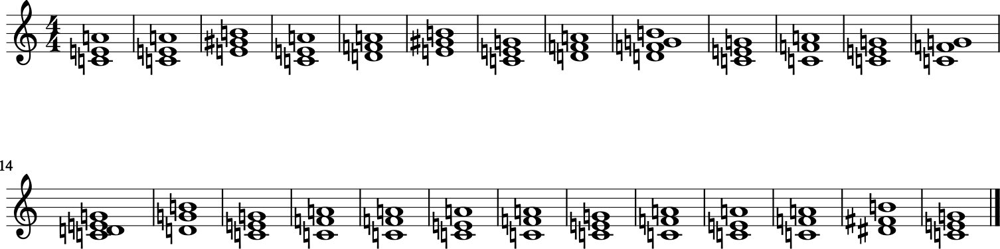

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Dm', 'Eb7', 'Dm', 'Am', 'Dm', 'Em', 'Bb', 'G', 'Dm', 'Dsus2', 'E', 'F', 'Bb', 'F', 'G', 'C', 'Am', 'C7sus4', 'F', 'G']


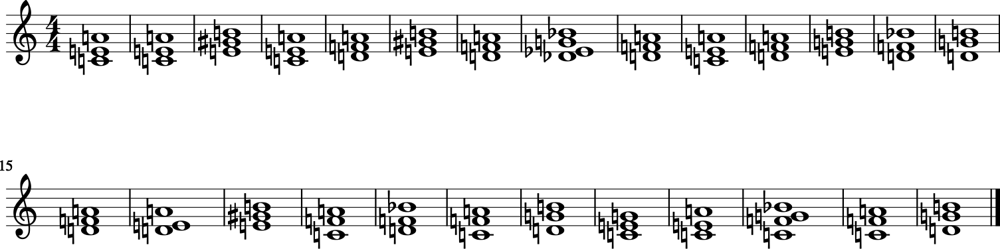

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


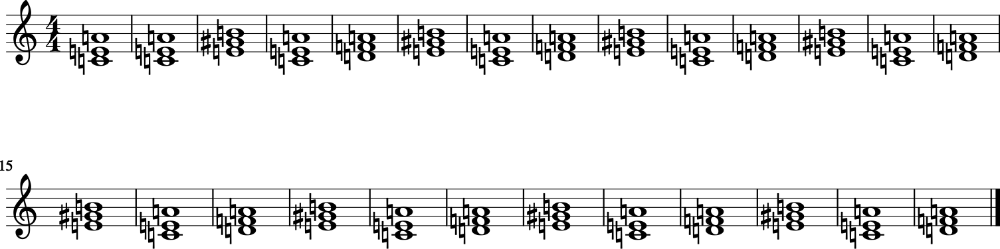

Epoch 3/50
1136924/1136924 [==============================] - 104s 92us/step - loss: 2.0651 - accuracy: 0.4393

Epoch 00003: loss improved from 2.19435 to 2.06512, saving model to word_pred_Model4_2.h5
Epoch: 3
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'Am', 'Dm', 'Em', 'Am', 'Dm', 'Em', 'Em', 'Am', 'Dm', 'Em', 'Dm', 'Em', 'Am', 'Dm']


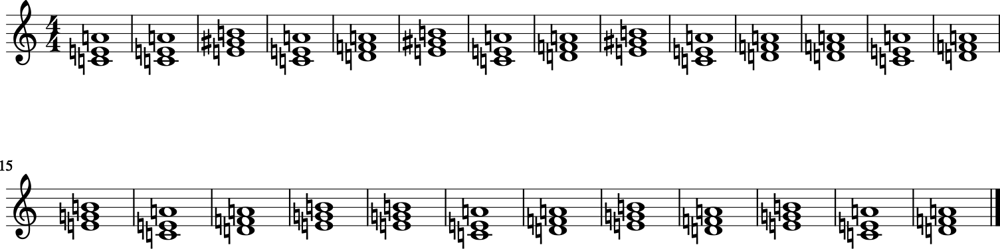

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'F', 'E', 'Am', 'E', 'F', 'C', 'E', 'C', 'F', 'Am', 'E', 'F', 'C', 'Am', 'Dm', 'F', 'G', 'C']


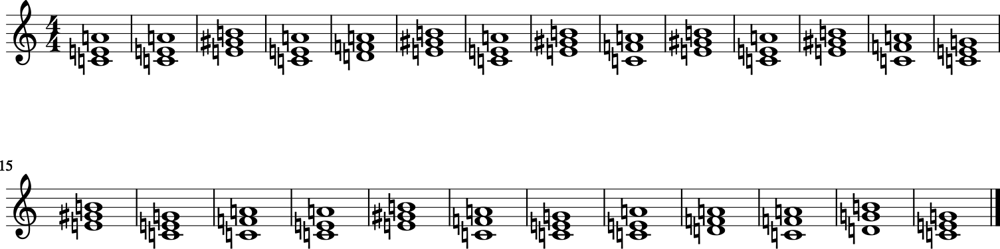

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'Am', 'F', 'Am', 'Dm', 'Am', 'Ebm', 'D', 'F#m', 'Dsus2', 'Esus4', 'D', 'F#m', 'Bm', 'G', 'Bm', 'G', 'G']


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


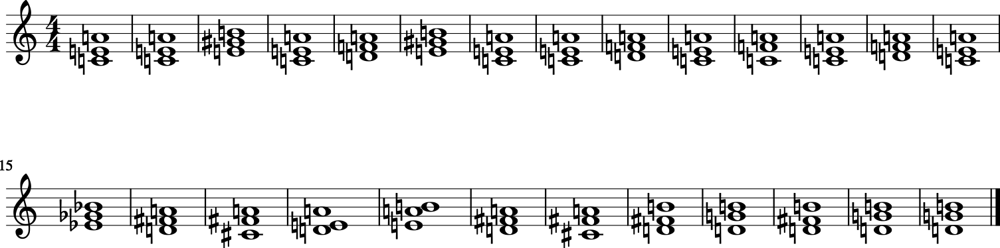

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


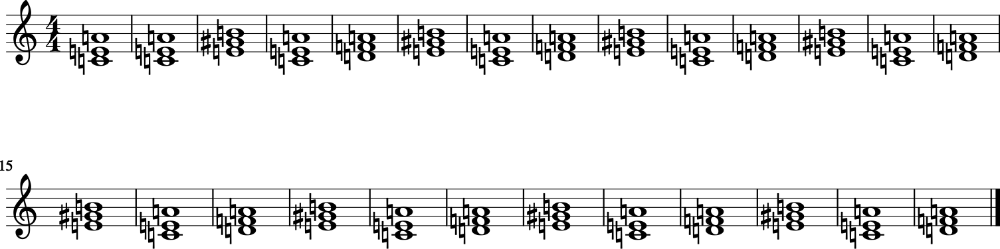

Epoch 4/50
1136924/1136924 [==============================] - 105s 92us/step - loss: 1.9985 - accuracy: 0.4587

Epoch 00004: loss improved from 2.06512 to 1.99849, saving model to word_pred_Model4_2.h5
Epoch: 4
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'Am', 'Dm', 'F', 'G', 'C', 'Dm', 'F', 'G', 'C', 'F', 'G', 'C', 'F', 'G', 'Am', 'F', 'G', 'C']


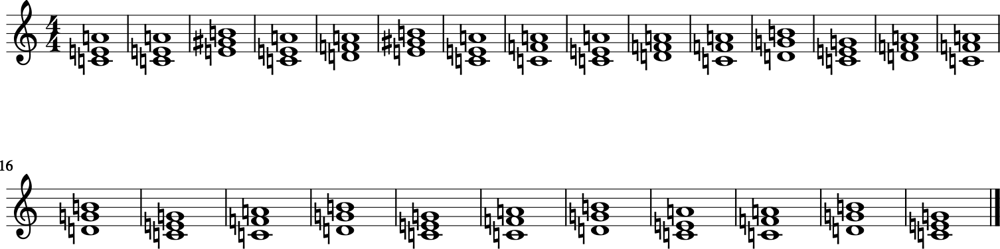

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'G', 'D', 'F', 'Am', 'G', 'A', 'F', 'E', 'Bm', 'C', 'D', 'Bm', 'G', 'C', 'D']


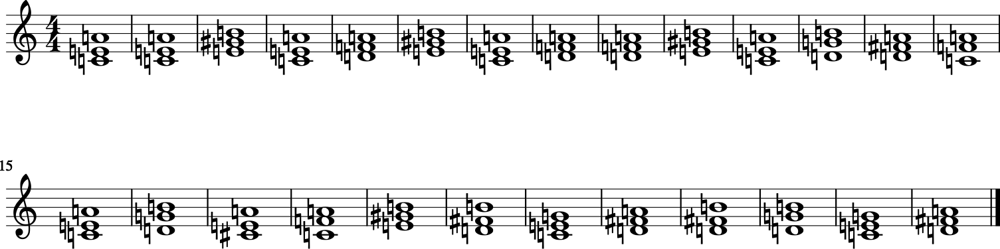

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'Em', 'E', 'E', 'D', 'Em7', 'E5', 'E7', 'Bm7', 'F#m7', 'Bbm7', 'F#m9', 'Em7', 'Db7-9', 'Em', 'Db7+5', 'DbM7', 'CM7', 'Fadd9']


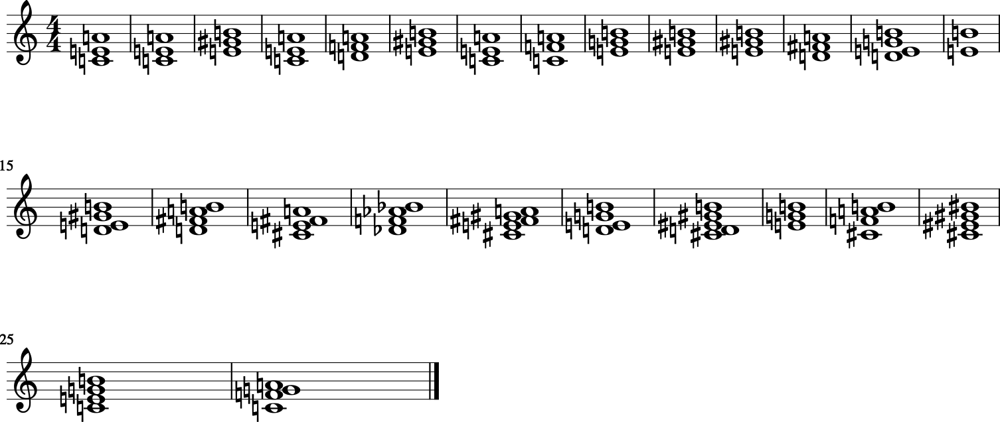

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E']


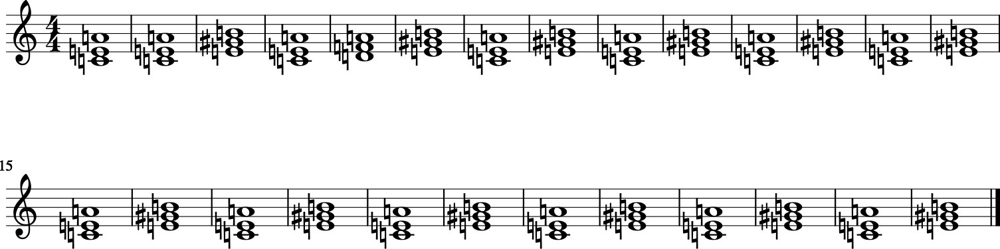

Epoch 5/50
1136924/1136924 [==============================] - 103s 91us/step - loss: 1.9585 - accuracy: 0.4696

Epoch 00005: loss improved from 1.99849 to 1.95846, saving model to word_pred_Model4_2.h5
Epoch: 5
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Am', 'Am', 'F', 'E', 'Am', 'C', 'C', 'E', 'Am', 'F', 'C', 'E', 'Am', 'F', 'C', 'E']


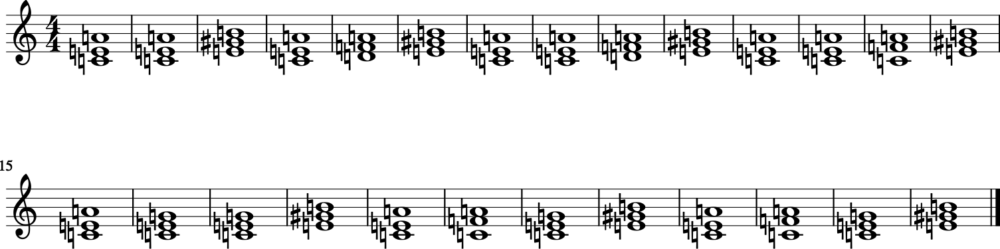

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'C', 'E7', 'Am', 'F', 'C', 'E7', 'Am', 'F', 'C', 'F', 'C', 'Am', 'F', 'C', 'G']


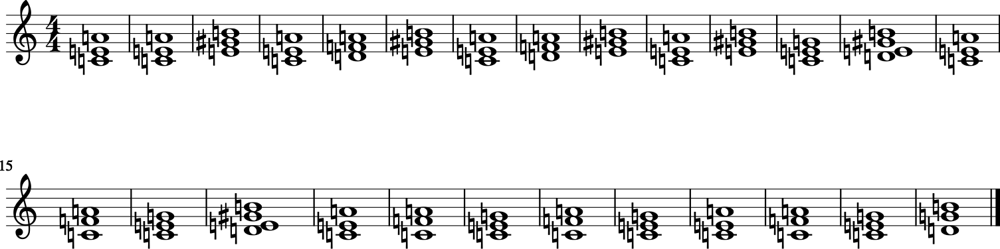

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'E7', 'Am', 'Am', 'B7', 'Am', 'E7', 'Am', 'E7', 'Am', 'Dm', 'Am', 'E7', 'Am', 'Dm', 'Am', 'E7', 'Am']


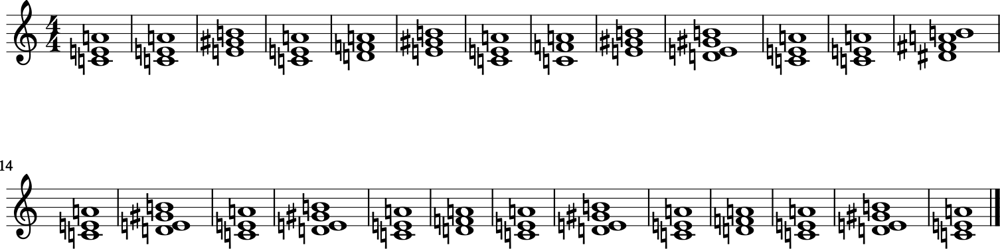

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


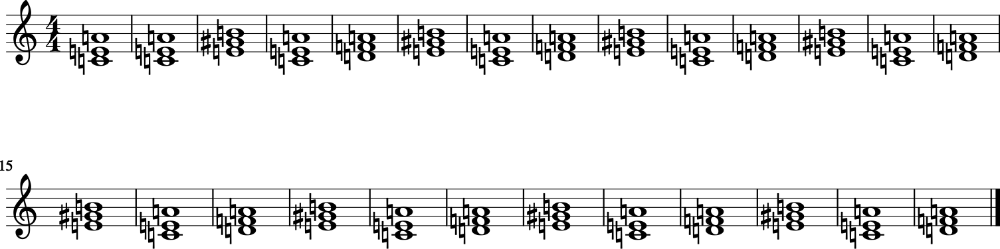

Epoch 6/50
1136924/1136924 [==============================] - 104s 91us/step - loss: 1.9308 - accuracy: 0.4773

Epoch 00006: loss improved from 1.95846 to 1.93082, saving model to word_pred_Model4_2.h5
Epoch: 6
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Dm', 'Am', 'Dm', 'E', 'Dm', 'Dm', 'C', 'Bb', 'Dm', 'Dm', 'C', 'Bb', 'Dm', 'C', 'Dm', 'Am', 'Gm', 'C', 'Dm', 'Dm']


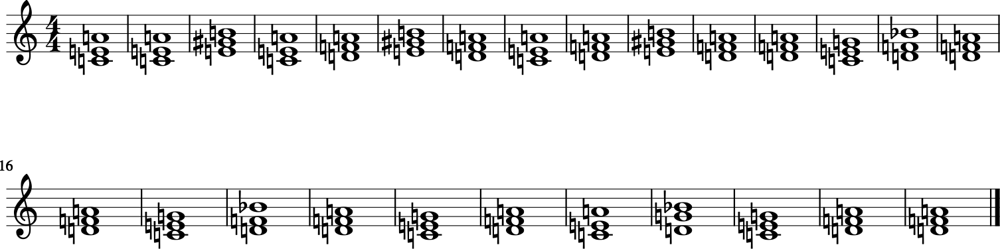

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'F', 'A', 'Am', 'G', 'Dm', 'Eb', 'F', 'Bb7', 'F', 'Dm', 'Eb', 'Bb', 'Dm', 'C', 'F']


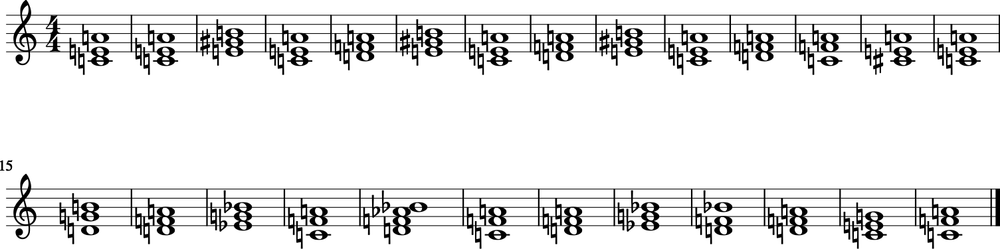

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dm', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'Dm', 'Gaug', 'Bb6', 'Bb', 'E']


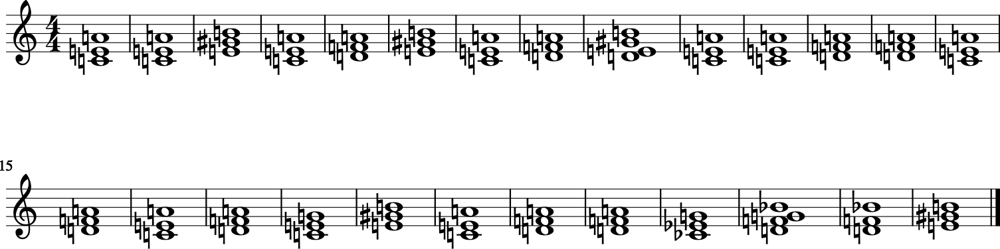

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


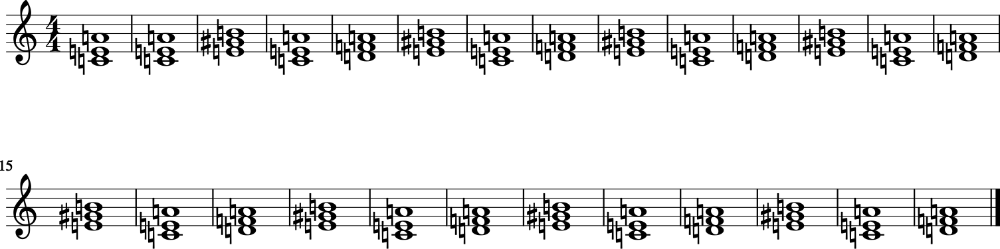

Epoch 7/50
1136924/1136924 [==============================] - 104s 91us/step - loss: 1.9102 - accuracy: 0.4830

Epoch 00007: loss improved from 1.93082 to 1.91021, saving model to word_pred_Model4_2.h5
Epoch: 7
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'G', 'C', 'Am', 'F', 'G', 'C', 'Am', 'F', 'G', 'C', 'F', 'G', 'Bm', 'F', 'C', 'G', 'Bm', 'F']


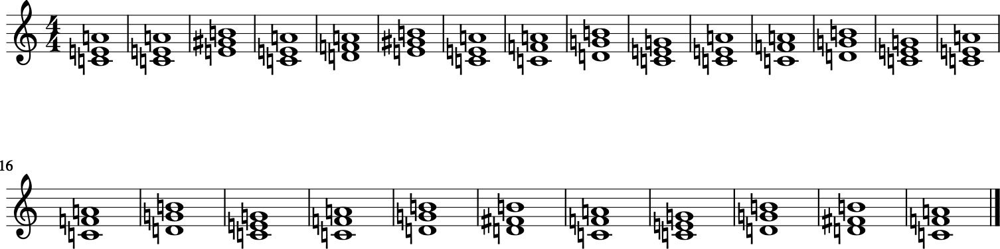

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'F', 'Dm', 'E', 'Dm', 'G', 'Am', 'G', 'C', 'Dm', 'C', 'G', 'Dm', 'G', 'C', 'G']


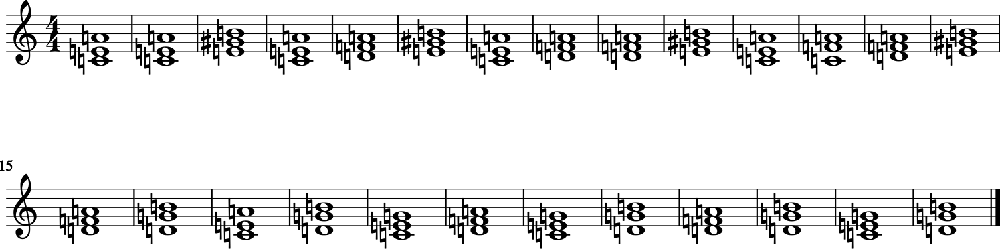

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Dm', 'Am', 'Dm', 'E', 'C', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'FM7', 'D', 'Am7', 'Am', 'FM7']


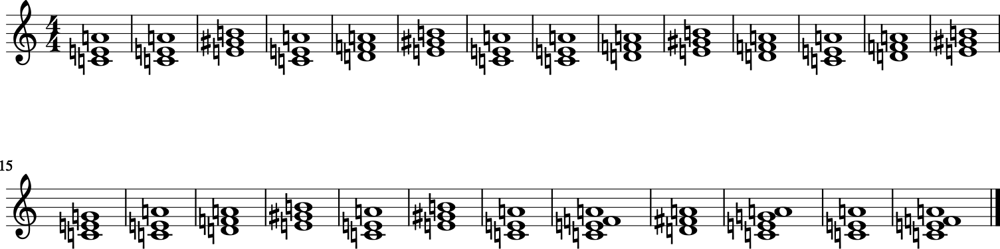

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F']


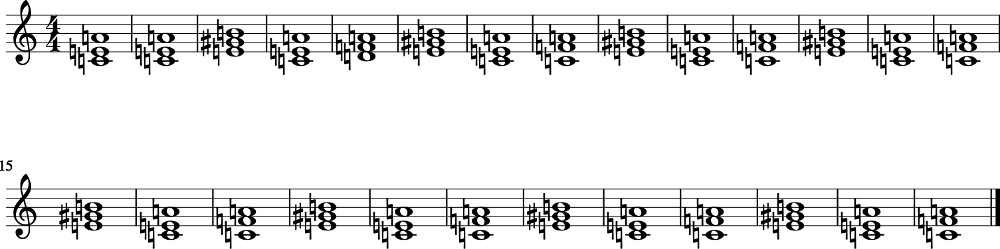

Epoch 8/50
1136924/1136924 [==============================] - 105s 92us/step - loss: 1.8942 - accuracy: 0.4877

Epoch 00008: loss improved from 1.91021 to 1.89418, saving model to word_pred_Model4_2.h5
Epoch: 8
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'F#m', 'D', 'F', 'A', 'A', 'D', 'G', 'G', 'A', 'D', 'A', 'G', 'A', 'D', 'A', 'G', 'A']


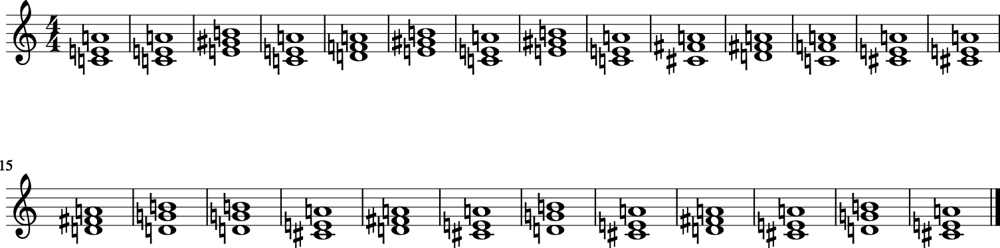

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E7', 'F', 'Am', 'F', 'Dm', 'Am', 'F', 'Dm', 'Am', 'G', 'F', 'Dm', 'Am', 'G', 'F', 'Dm', 'Am', 'G']


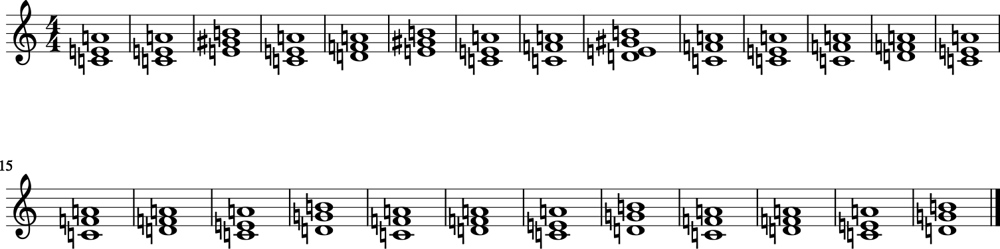

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Em', 'G', 'Am', 'G', 'Am', 'B7', 'Am', 'E', 'B', 'C', 'E', 'E', 'A', 'E', 'C', 'C', 'G', 'Bm']


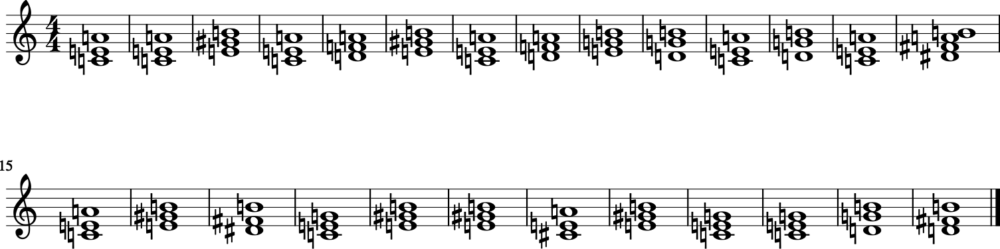

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


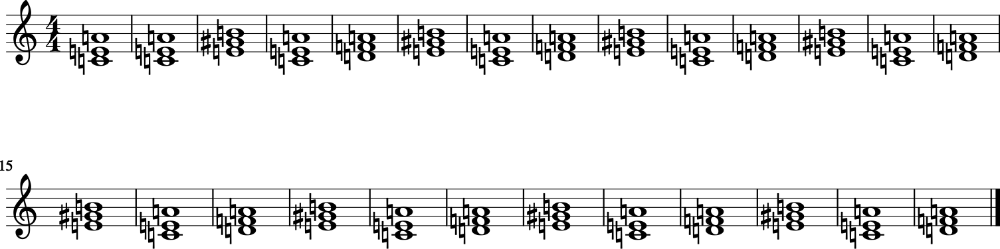

Epoch 9/50
1136924/1136924 [==============================] - 105s 93us/step - loss: 1.8806 - accuracy: 0.4914

Epoch 00009: loss improved from 1.89418 to 1.88061, saving model to word_pred_Model4_2.h5
Epoch: 9
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'Dm', 'E', 'Am', 'G', 'F', 'E', 'Am', 'G', 'F', 'E', 'Am', 'G', 'F', 'E', 'Am', 'G', 'F', 'E']


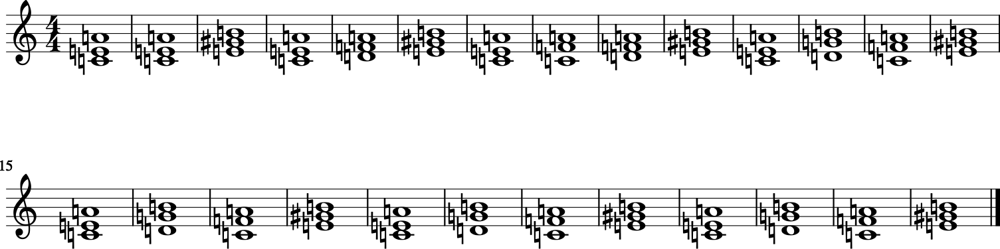

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'A', 'C', 'G', 'D', 'E', 'A', 'A7', 'D', 'A', 'Bm', 'Bm', 'F#m', 'G', 'Bm', 'A', 'G', 'Bm', 'A']


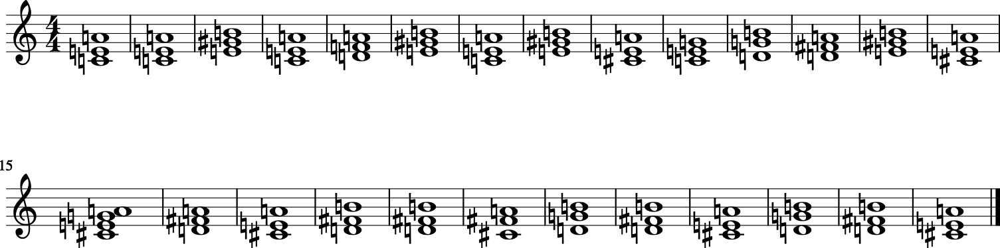

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'D', 'A7', 'Dm', 'Am', 'D', 'D', 'Dm', 'Am', 'Am', 'G', 'E', 'Am', 'Am', 'G', 'G7', 'Eadd11']


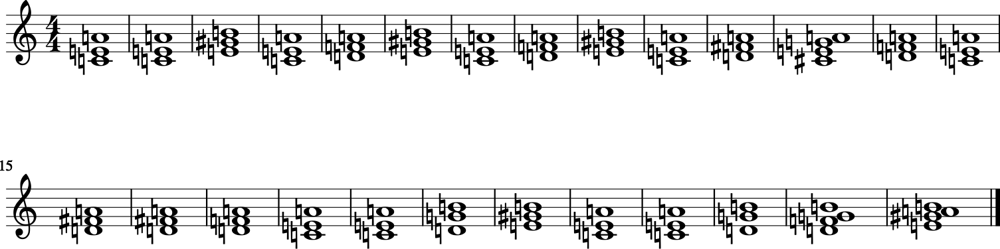

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


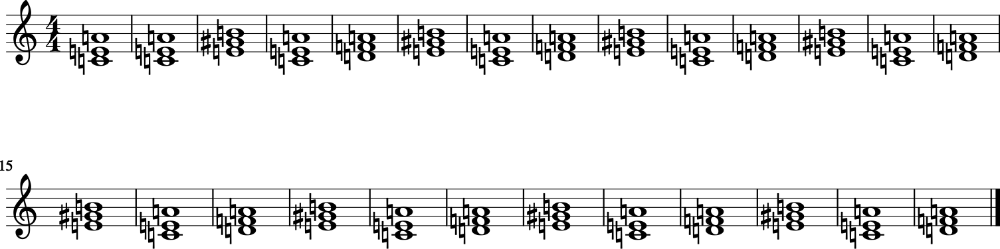

Epoch 10/50
1136924/1136924 [==============================] - 105s 93us/step - loss: 1.8694 - accuracy: 0.4948

Epoch 00010: loss improved from 1.88061 to 1.86942, saving model to word_pred_Model4_2.h5
Epoch: 10
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am7', 'Dm', 'Dm7', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Am', 'Am']


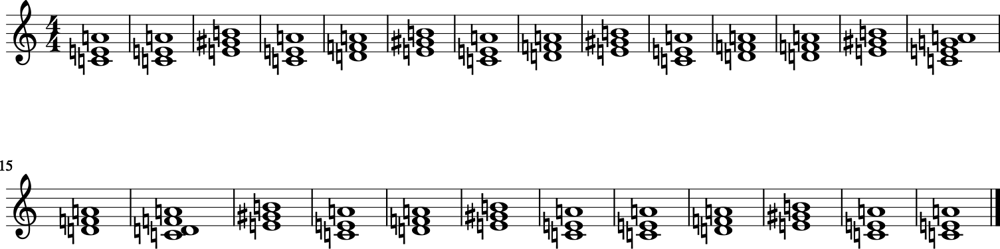

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'Am', 'E', 'Am', 'E', 'Am', 'C', 'Am', 'Dm', 'G', 'Am', 'G', 'Am', 'Dm', 'F', 'F']


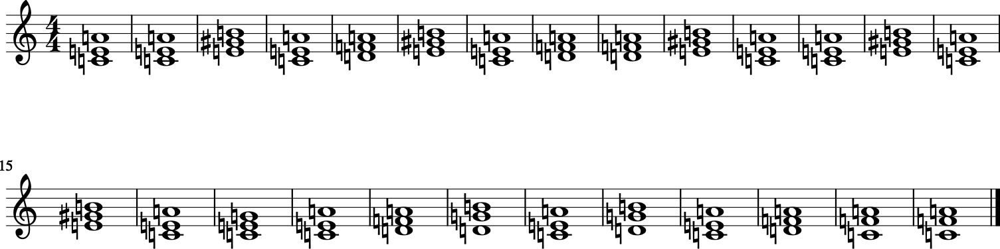

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'F', 'G', 'Am', 'Am', 'Am', 'G', 'Am', 'Am', 'G', 'Am', 'Am', 'C', 'G', 'Am', 'G', 'Am']


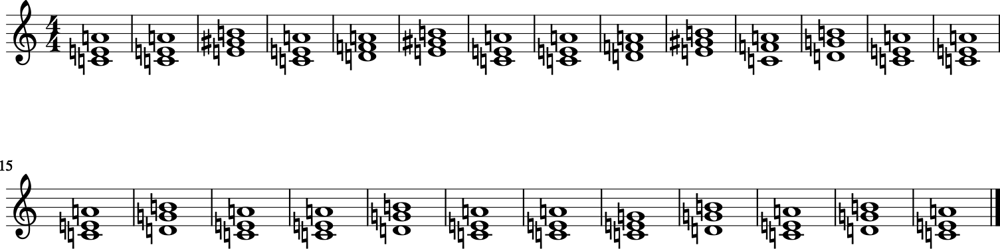

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


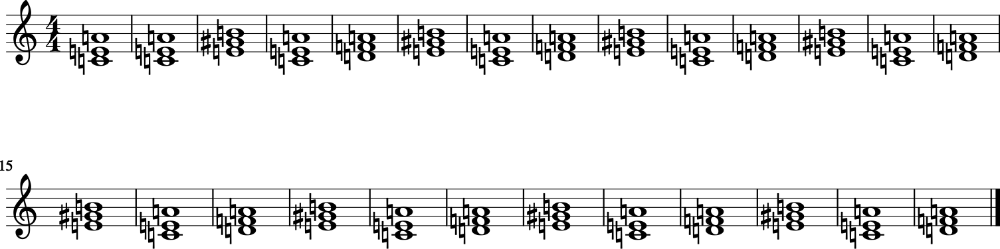

Epoch 11/50
1136924/1136924 [==============================] - 106s 93us/step - loss: 1.8601 - accuracy: 0.4975

Epoch 00011: loss improved from 1.86942 to 1.86014, saving model to word_pred_Model4_2.h5
Epoch: 11
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am']


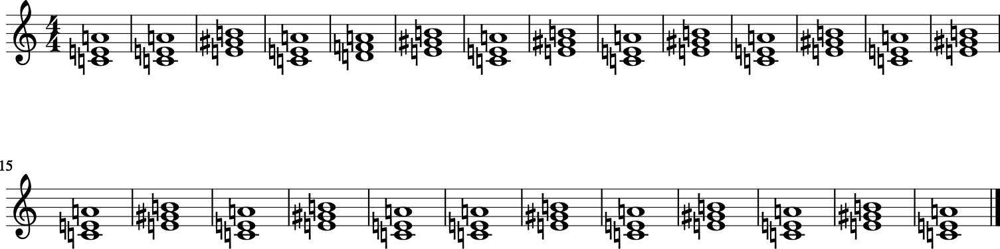

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'F', 'D', 'B', 'E', 'A', 'Am', 'B', 'A', 'D', 'A', 'D', 'A', 'G', 'D', 'D', 'A', 'G']


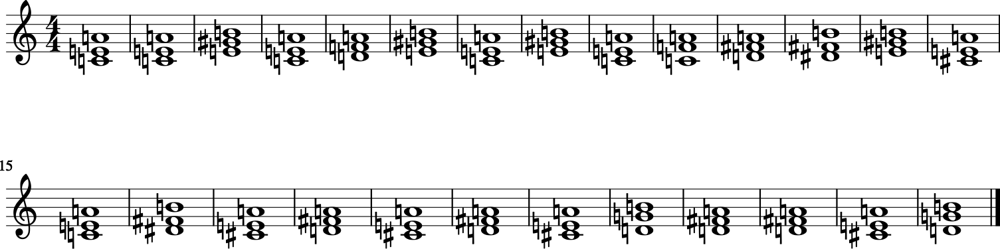

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'C', 'E', 'Am', 'Am', 'F', 'F', 'Em', 'Am', 'F', 'Dm', 'G', 'C', 'Em', 'Am', 'Bb', 'F', 'Fm']


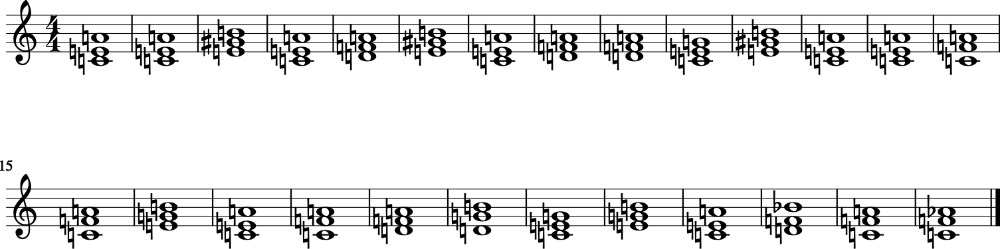

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


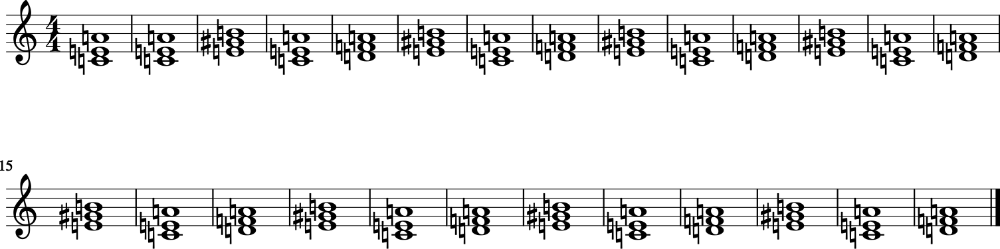

Epoch 12/50
1136924/1136924 [==============================] - 104s 91us/step - loss: 1.8520 - accuracy: 0.5000

Epoch 00012: loss improved from 1.86014 to 1.85198, saving model to word_pred_Model4_2.h5
Epoch: 12
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'Dm', 'Dm', 'C', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'Am', 'F', 'E', 'Am', 'Am']


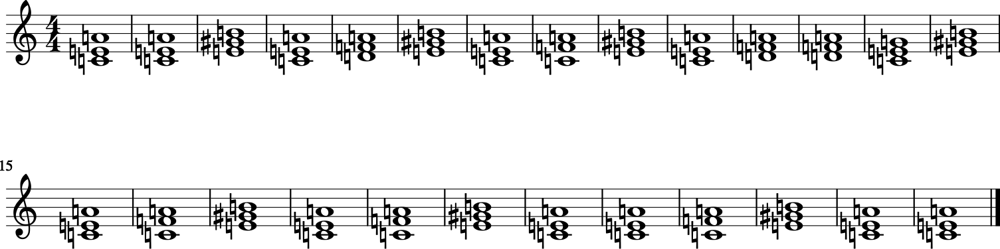

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Am', 'Dm', 'Am', 'E7', 'Am', 'Dm', 'C', 'E7', 'E7', 'Am', 'Dm', 'G', 'C']


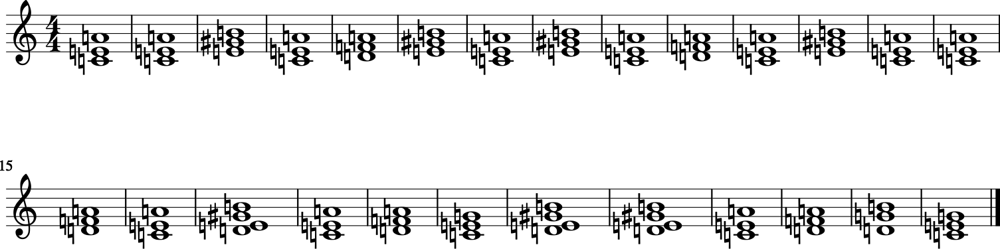

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Asus4', 'Am', 'Am', 'Em', 'Am', 'C', 'Am', 'Em', 'C', 'Am', 'Em', 'Am7', 'D', 'C', 'Em', 'F', 'C', 'Em', 'F']


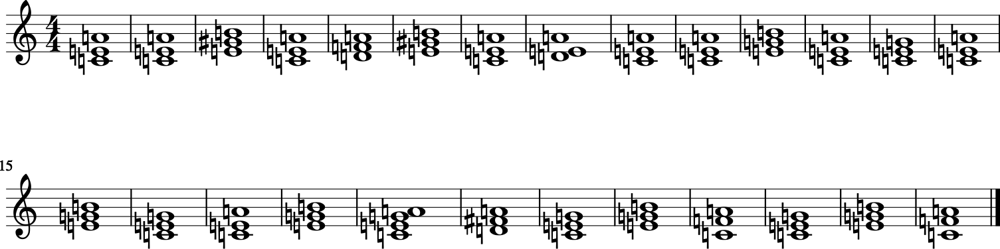

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


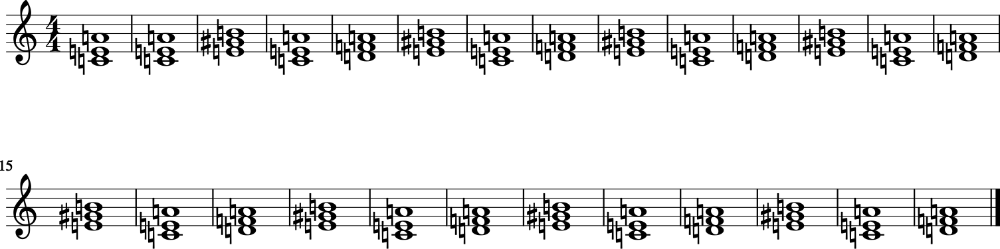

Epoch 13/50
1136924/1136924 [==============================] - 104s 92us/step - loss: 1.8447 - accuracy: 0.5020

Epoch 00013: loss improved from 1.85198 to 1.84472, saving model to word_pred_Model4_2.h5
Epoch: 13
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'C', 'E', 'F', 'G', 'C', 'E', 'F', 'G', 'C', 'E', 'F', 'G', 'F', 'C', 'C']


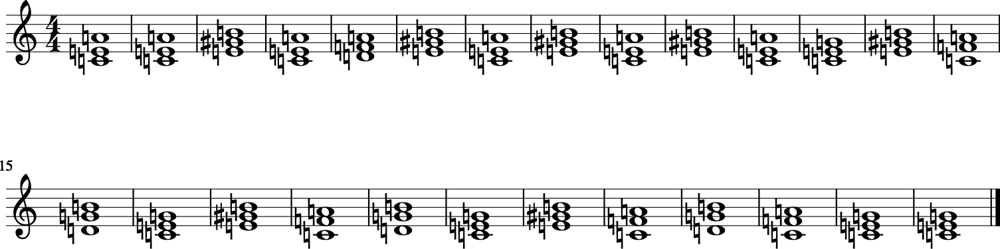

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dsus2', 'Am', 'F', 'F', 'G', 'D', 'Am', 'D', 'F', 'FM7', 'Am']


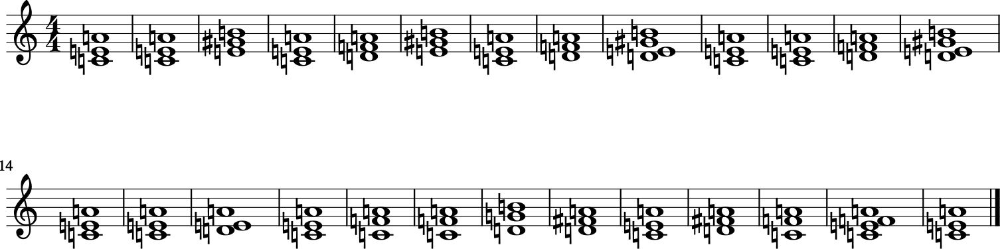

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'C', 'E', 'Am', 'Eaug', 'Am', 'F#m7b5', 'E', 'E9', 'A', 'Esus4', 'D', 'AM7', 'Bm7', 'A', 'AM7', 'A7', 'A', 'F#m7', 'Gadd9', 'A6']


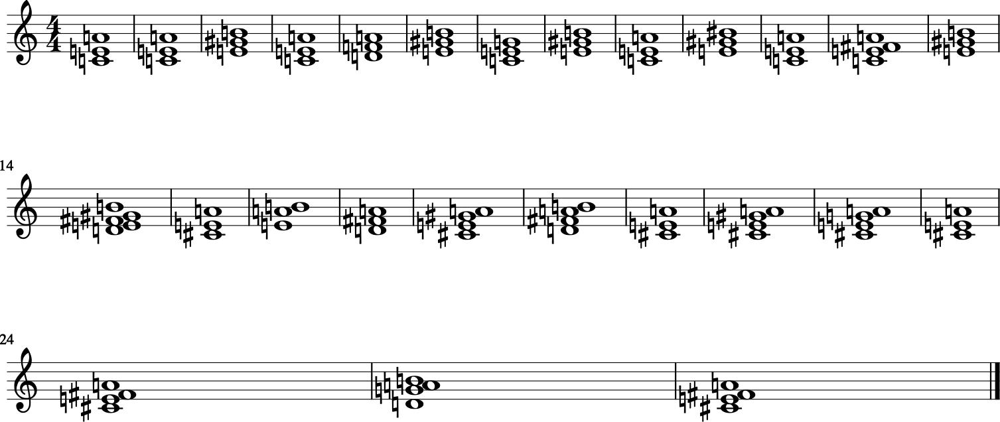

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


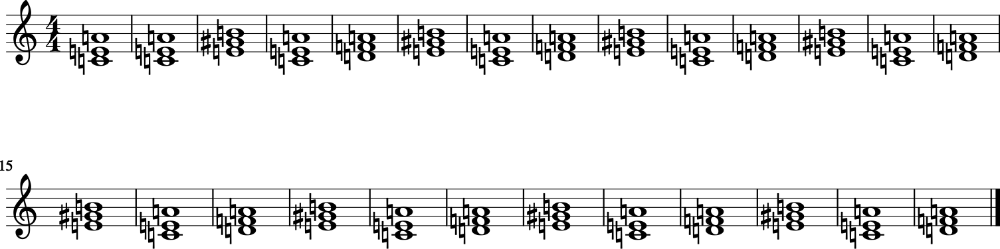

Epoch 14/50
1136924/1136924 [==============================] - 104s 91us/step - loss: 1.8386 - accuracy: 0.5037

Epoch 00014: loss improved from 1.84472 to 1.83857, saving model to word_pred_Model4_2.h5
Epoch: 14
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'Am', 'G', 'Am', 'Dm', 'Am', 'G', 'Dm', 'Am', 'G', 'Dm', 'Am', 'G', 'F', 'Em']


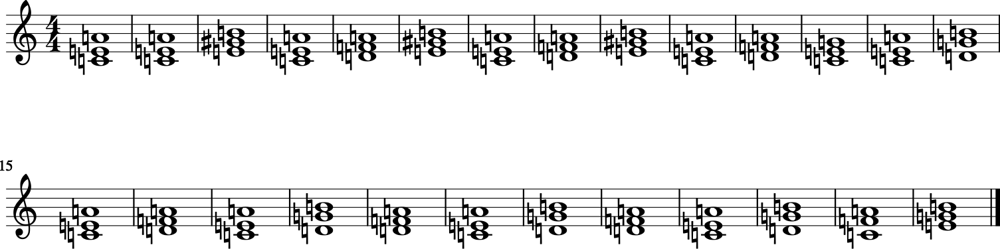

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'F', 'Dm', 'C', 'E7', 'Am', 'G', 'C', 'G', 'Dm7', 'F', 'FM7', 'G', 'Dm7', 'Dm7', 'FM7', 'G7', 'C', 'G']


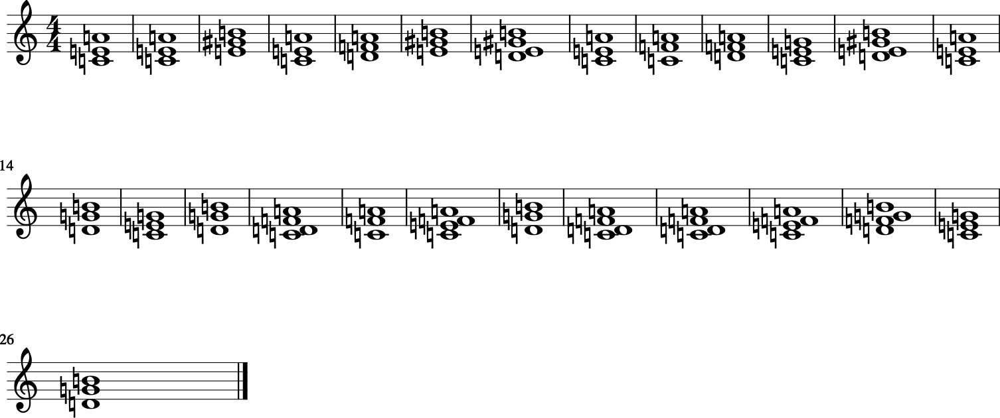

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'Cm', 'F', 'F', 'C', 'C', 'G', 'F', 'Am', 'Dm7', 'E7', 'C', 'A', 'Em', 'A7', 'Bm7', 'A7', 'D7']


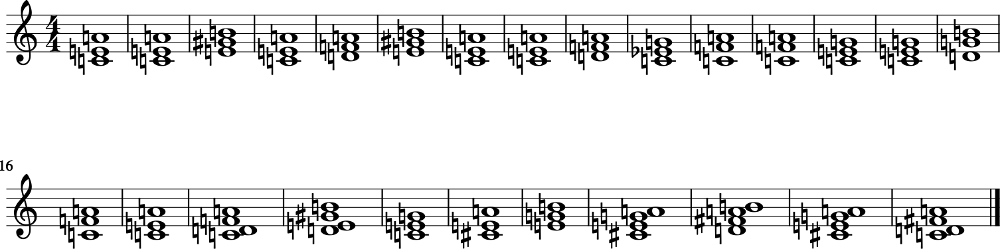

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


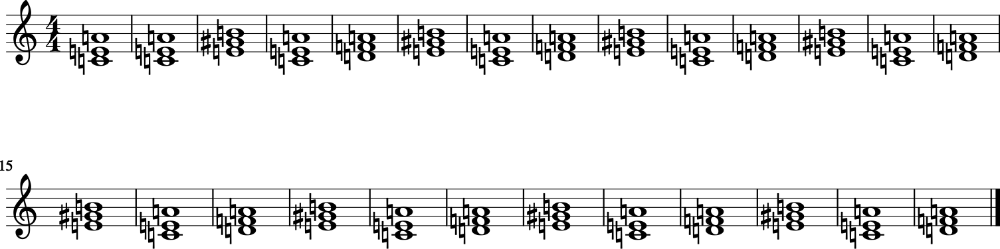

Epoch 15/50
1136924/1136924 [==============================] - 104s 91us/step - loss: 1.8328 - accuracy: 0.5052

Epoch 00015: loss improved from 1.83857 to 1.83283, saving model to word_pred_Model4_2.h5
Epoch: 15
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dm', 'E7', 'Am', 'Dm', 'E7', 'Am', 'F', 'Em', 'F', 'C']


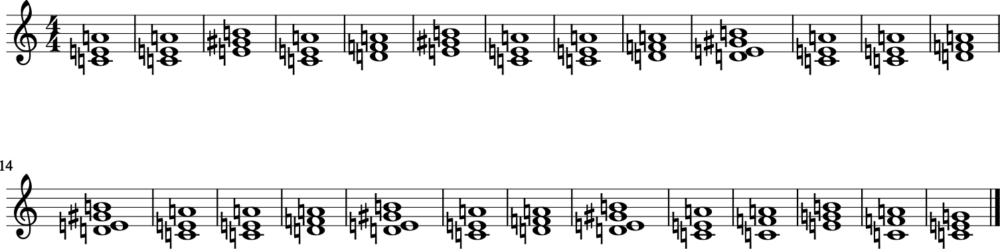

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Bm', 'Am', 'F', 'C', 'C', 'Dadd4add9', 'C', 'F', 'C', 'F', 'G', 'C', 'F', 'G', 'C', 'F', 'G', 'C', 'F']


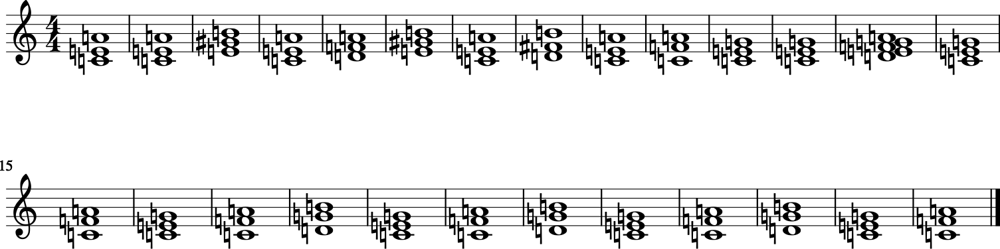

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'D', 'Eb', 'Dm', 'Bb', 'Gm', 'Cm', 'F', 'Dm', 'Gm', 'Gm7', 'Bb', 'F', 'C', 'F', 'F6', 'C']


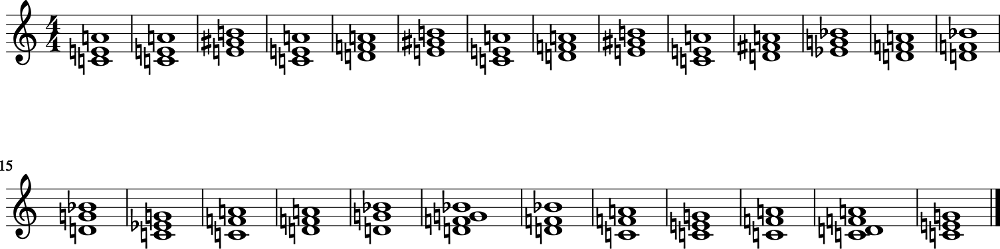

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


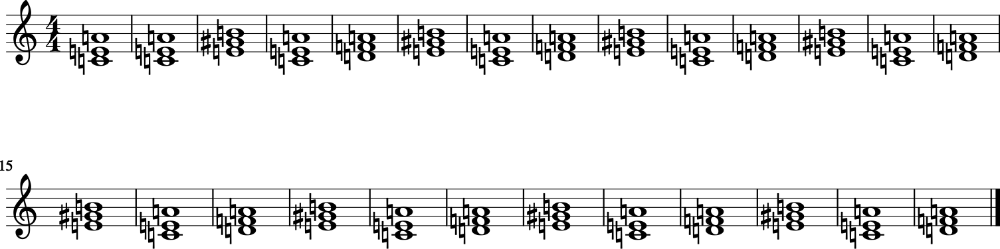

Epoch 16/50
1136924/1136924 [==============================] - 101s 89us/step - loss: 1.8278 - accuracy: 0.5068

Epoch 00016: loss improved from 1.83283 to 1.82783, saving model to word_pred_Model4_2.h5
Epoch: 16
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Dm', 'E', 'Am', 'Dm', 'C', 'G', 'Am', 'F', 'G', 'F', 'C']


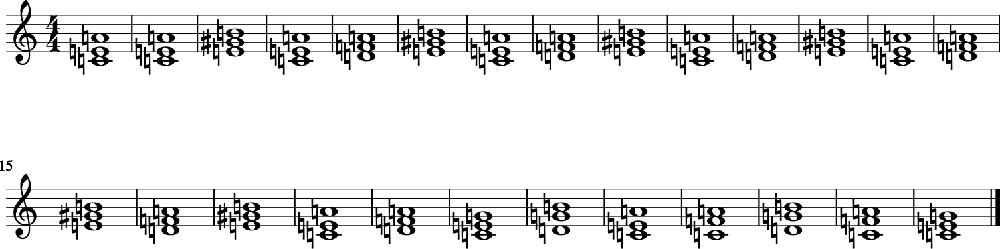

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Bb', 'Dm', 'Dm', 'E', 'Bb', 'Dm', 'E', 'Dm', 'A', 'F#', 'Am', 'E', 'Am', 'C', 'Am', 'Am']


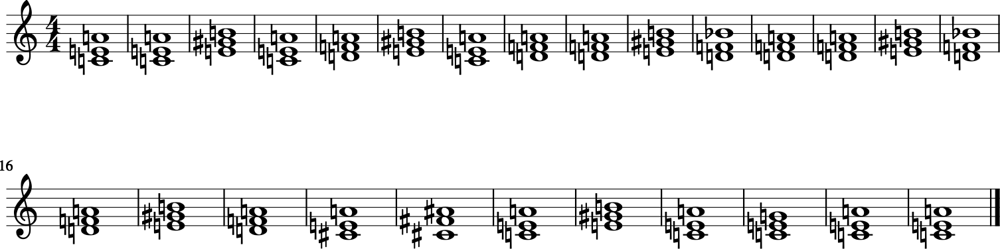

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'FM7', 'E', 'Am', 'F', 'D', 'B7', 'E', 'C', 'Em', 'B7', 'Am', 'C', 'Em', 'Am', 'G', 'Em', 'Em', 'Em', 'C']


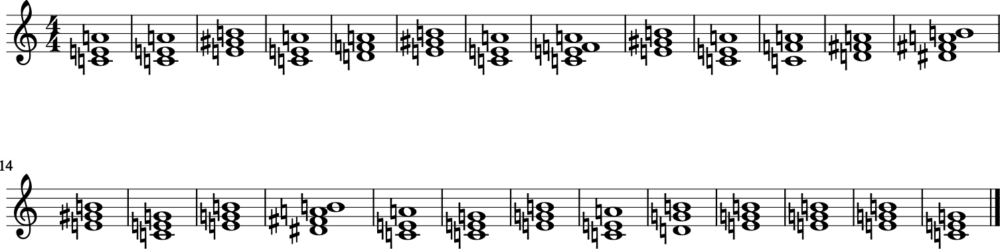

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


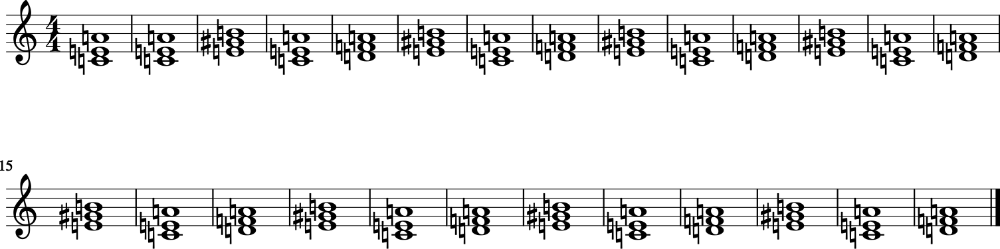

Epoch 17/50
1136924/1136924 [==============================] - 102s 89us/step - loss: 1.8236 - accuracy: 0.5081

Epoch 00017: loss improved from 1.82783 to 1.82361, saving model to word_pred_Model4_2.h5
Epoch: 17
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'C', 'Am', 'Em', 'B', 'Em', 'Am', 'B', 'Am', 'Em', 'Am', 'B', 'Am', 'Em', 'Am', 'B', 'Am']


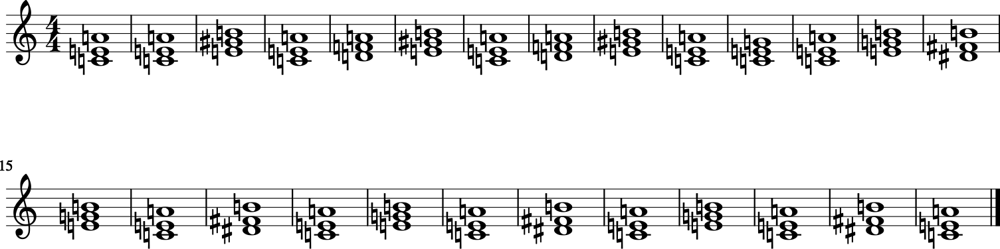

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'A', 'F', 'Dsus4', 'G', 'E', 'G', 'G', 'Am', 'G', 'E', 'E', 'D', 'E', 'G', 'D', 'E', 'D']


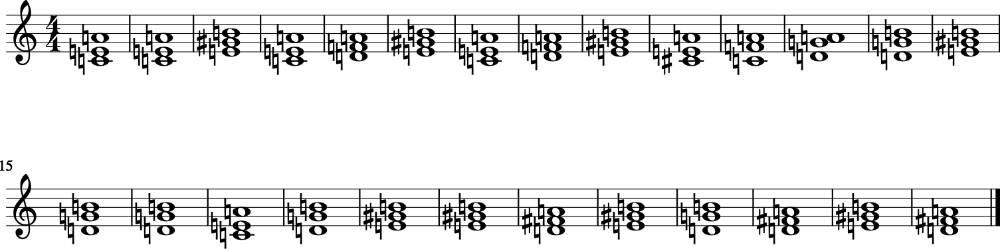

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Dm', 'F', 'C', 'Dm', 'Am', 'Gsus4', 'C', 'Dm7', 'G', 'F6sus2', 'Am', 'F', 'G', 'C', 'D7', 'G']


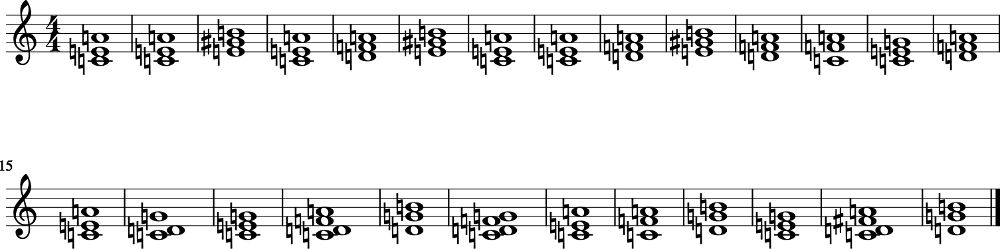

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


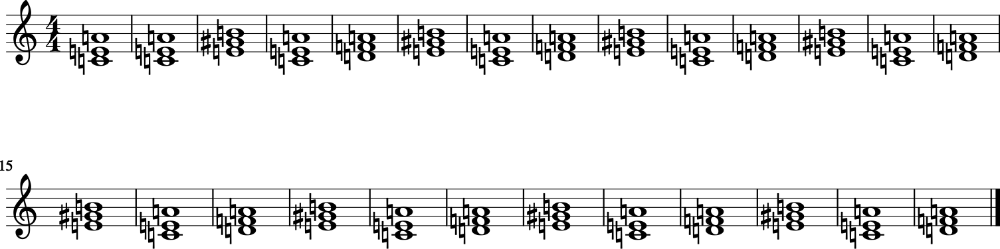

Epoch 18/50
1136924/1136924 [==============================] - 101s 89us/step - loss: 1.8194 - accuracy: 0.5091

Epoch 00018: loss improved from 1.82361 to 1.81943, saving model to word_pred_Model4_2.h5
Epoch: 18
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Am', 'Am', 'G', 'Am', 'Am', 'F', 'Am', 'F', 'C']


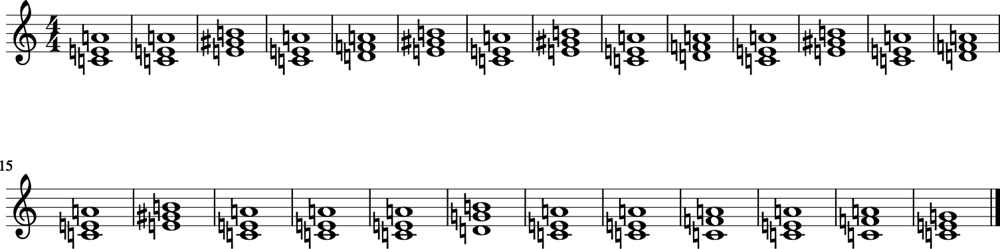

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Dm7', 'E', 'Am', 'E', 'Am', 'Dm7', 'C', 'G', 'FM7', 'F', 'G', 'Dm', 'F', 'G', 'C', 'G', 'C', 'G', 'C', 'G']


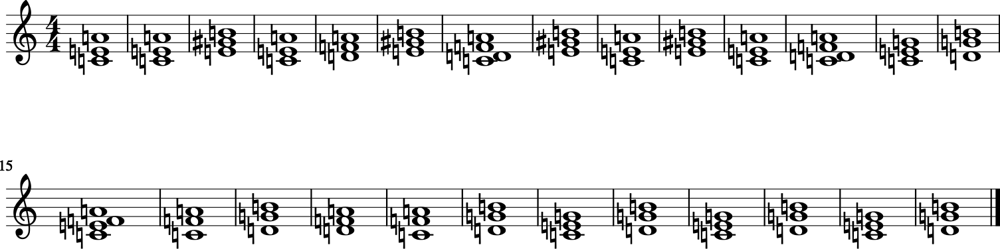

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'E7', 'Am', 'Dm', 'Em', 'Am', 'Dm', 'Em', 'Am', 'Dm', 'Em', 'Am', 'F', 'Fm', 'Am', 'Fm', 'Am']


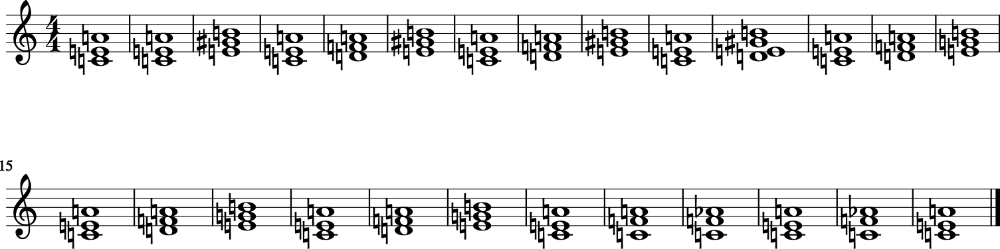

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


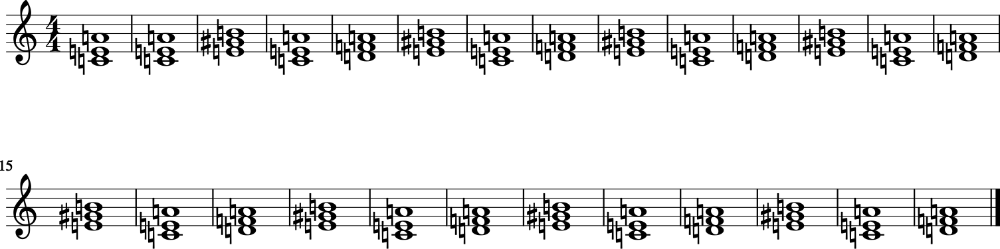

Epoch 19/50
1136924/1136924 [==============================] - 101s 89us/step - loss: 1.8155 - accuracy: 0.5106

Epoch 00019: loss improved from 1.81943 to 1.81546, saving model to word_pred_Model4_2.h5
Epoch: 19
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'C', 'E', 'Am', 'E', 'C', 'E', 'Am', 'F', 'Am', 'F', 'C', 'C', 'F', 'C', 'C', 'C', 'C', 'C', 'G7', 'C']


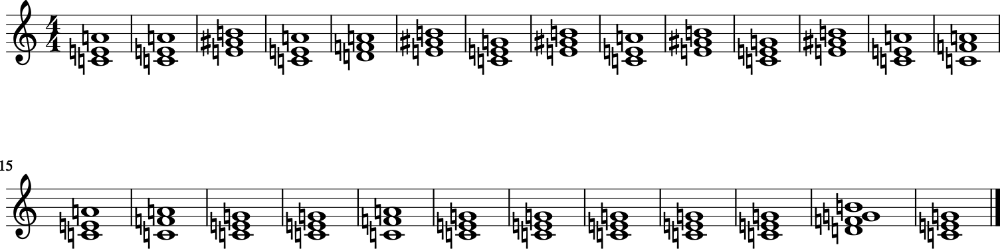

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Dm', 'E', 'E', 'E', 'Dm', 'Bm', 'D', 'G', 'Bb', 'E', 'F', 'G', 'Bb', 'F', 'C', 'C', 'A', 'Bb']


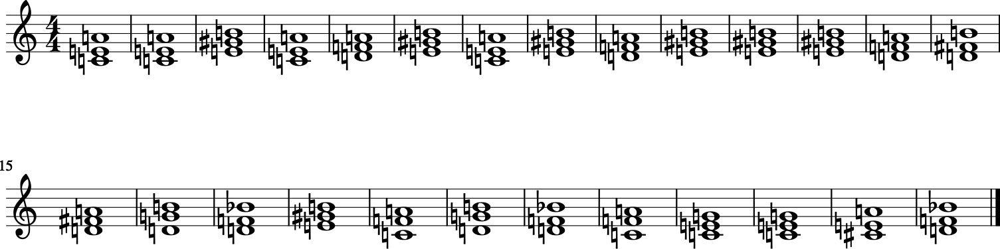

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Eadd11', 'E', 'Am', 'Em', 'Dsus2', 'CM7', 'E', 'C', 'Gadd9', 'Gsus4', 'B7', 'Gsus2', 'Dsus4', 'C5', 'C5', 'G5', 'C', 'G', 'C', 'G']


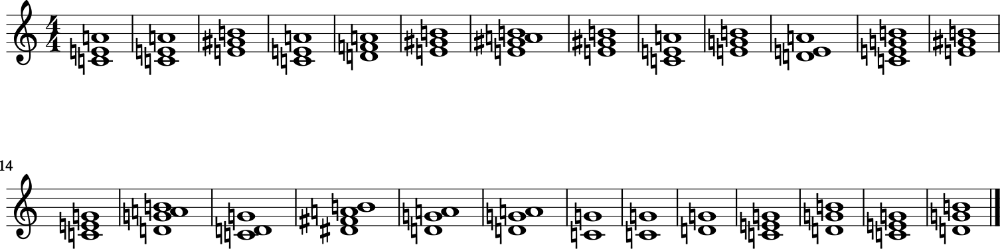

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


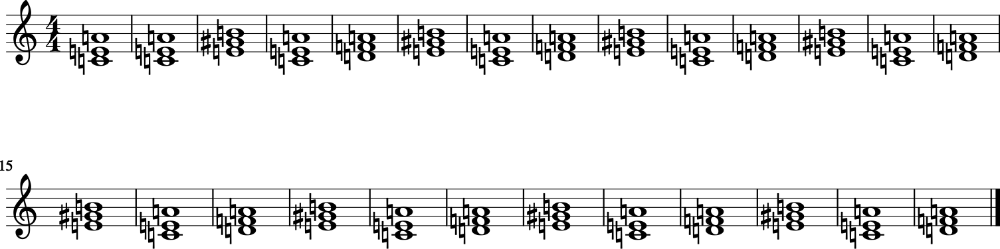

Epoch 20/50
1136924/1136924 [==============================] - 102s 90us/step - loss: 1.8122 - accuracy: 0.5117

Epoch 00020: loss improved from 1.81546 to 1.81215, saving model to word_pred_Model4_2.h5
Epoch: 20
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'B5', 'Dm', 'G7', 'B', 'Am', 'Dm', 'G7', 'C', 'F', 'G', 'C', 'G7', 'C', 'F', 'C', 'G7', 'C', 'F', 'C']


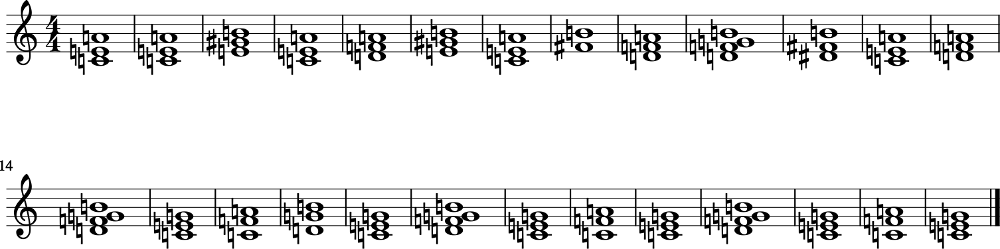

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'F', 'E', 'Am', 'G', 'Dm', 'E', 'Bm', 'Am', 'Em', 'Am', 'Bm', 'Am', 'Em', 'D', 'C', 'G', 'Em', 'D']


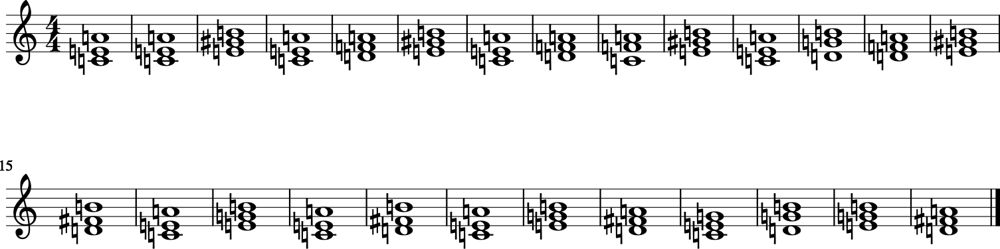

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Dbm', 'Am', 'A', 'A', 'F#m', 'Bm', 'E', 'A', 'D6', 'Esus4', 'Em', 'D', 'A', 'D7', 'Bb', 'E', 'G', 'E', 'Gm6', 'E6']


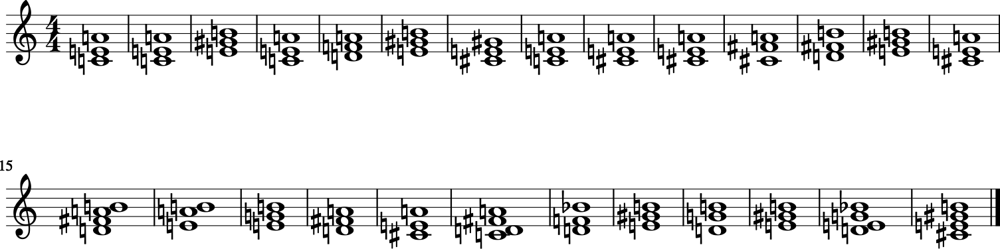

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


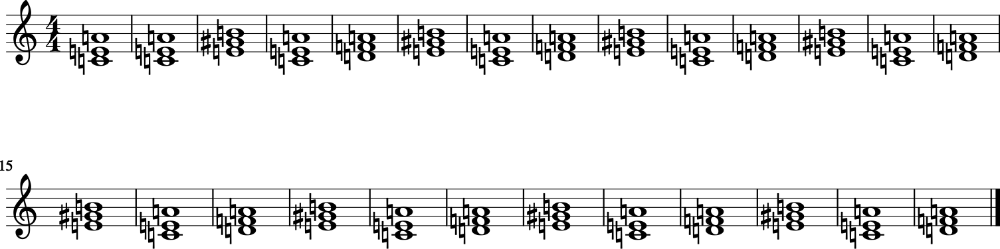

Epoch 21/50
1136924/1136924 [==============================] - 82s 72us/step - loss: 1.8091 - accuracy: 0.5124

Epoch 00021: loss improved from 1.81215 to 1.80906, saving model to word_pred_Model4_2.h5
Epoch: 21
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Am', 'E', 'Am', 'Am', 'Dm', 'Am', 'G', 'C', 'F', 'E', 'A', 'G', 'G', 'D', 'E']


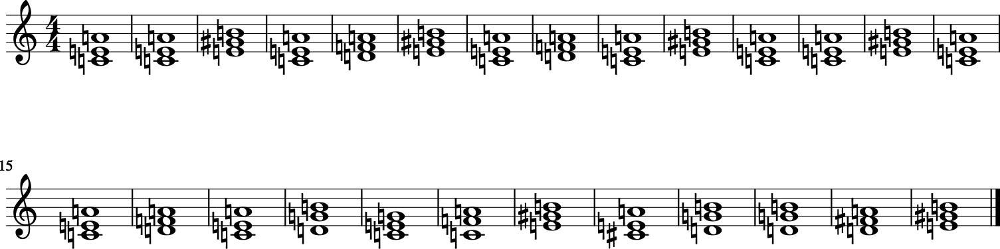

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Dm', 'Dm', 'E', 'F', 'Am', 'E', 'G', 'F', 'Am', 'Cadd2', 'C', 'F', 'Em', 'Am', 'G', 'Gsus4', 'G']


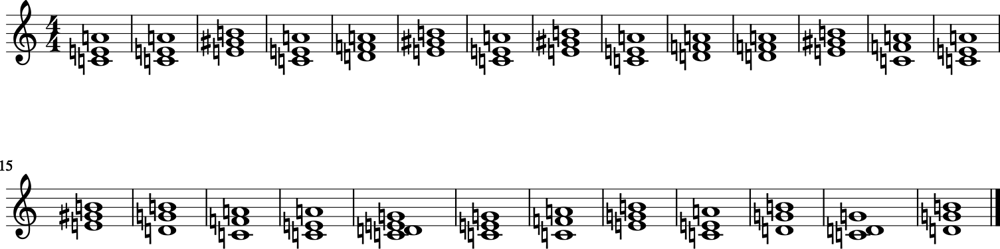

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'D', 'E', 'Am', 'D', 'G', 'D', 'G', 'Am', 'G', 'D', 'Am', 'G', 'D', 'F', 'Am', 'G', 'D', 'F', 'Am']


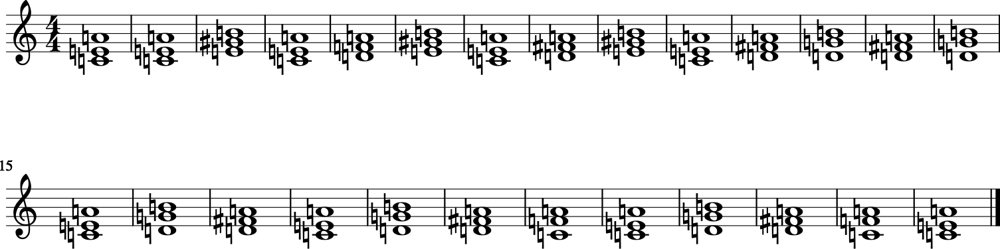

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


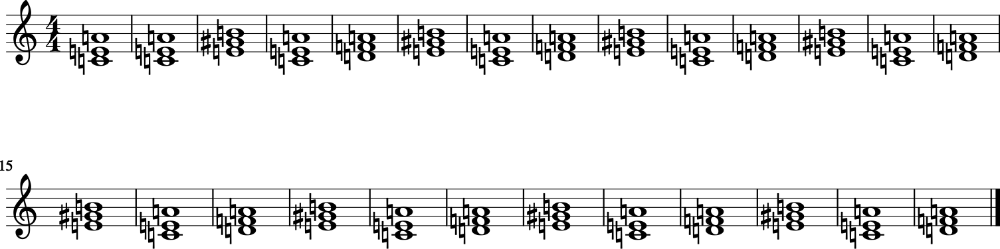

Epoch 22/50
1136924/1136924 [==============================] - 88s 77us/step - loss: 1.8057 - accuracy: 0.5130

Epoch 00022: loss improved from 1.80906 to 1.80573, saving model to word_pred_Model4_2.h5
Epoch: 22
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Am', 'Am', 'C', 'F', 'G', 'Am', 'C', 'F', 'G', 'Am', 'Em', 'F', 'G', 'Am', 'Em', 'F', 'G']


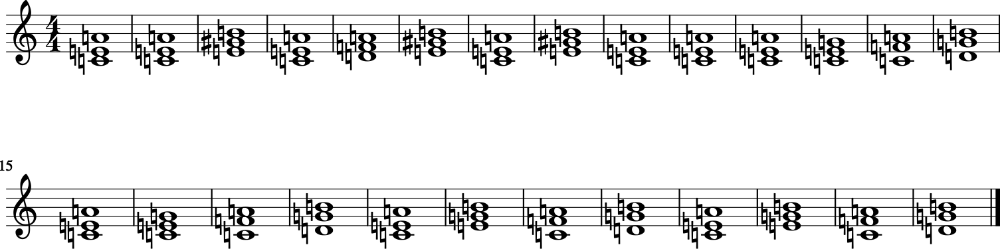

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dbm', 'E', 'F#m', 'A', 'E', 'E', 'F#m', 'A', 'E', 'B', 'Dbm', 'A', 'F#m', 'Dbm', 'B', 'F#m', 'A', 'A', 'Dbm']


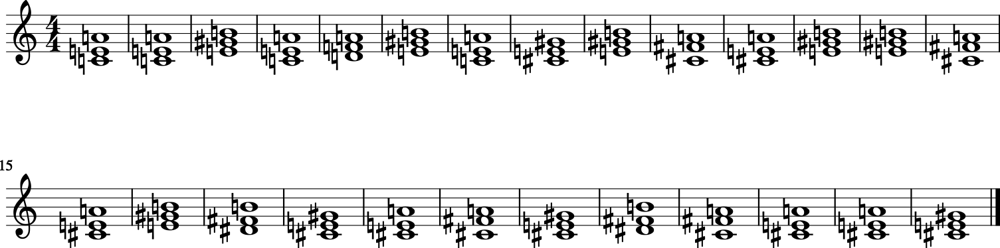

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'Dm7', 'Am', 'Am7', 'Am7', 'FM7', 'Dm', 'C', 'FM7', 'BbM7', 'FM7', 'G7', 'F', 'DAmMaj7', 'FM7']


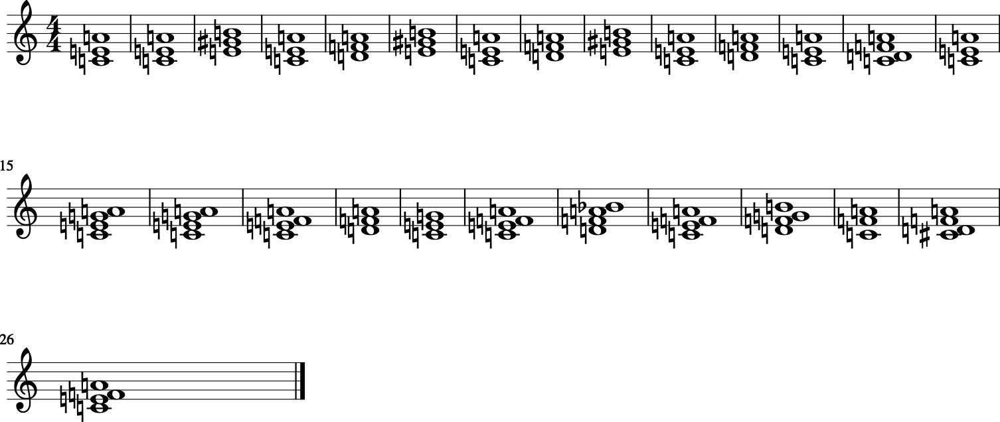

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


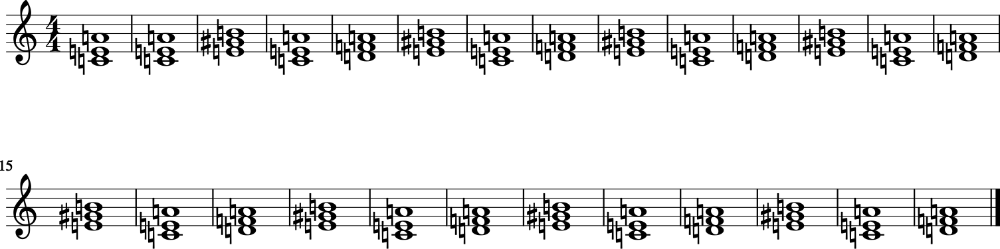

Epoch 23/50
1136924/1136924 [==============================] - 112s 99us/step - loss: 1.8032 - accuracy: 0.5138

Epoch 00023: loss improved from 1.80573 to 1.80317, saving model to word_pred_Model4_2.h5
Epoch: 23
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'G', 'C', 'Am', 'Dm', 'C', 'G', 'Am', 'Dm', 'C', 'G', 'C', 'FM7', 'G', 'C', 'FM7', 'G', 'C']


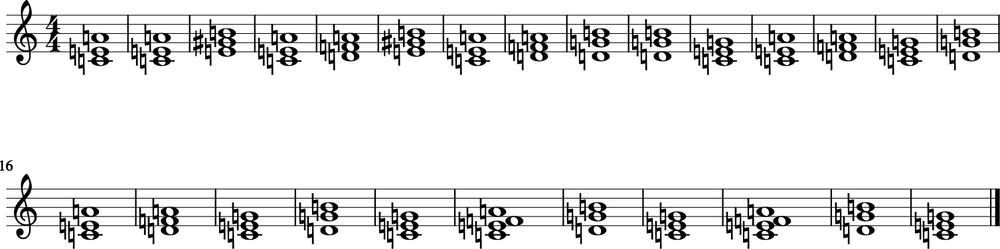

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'E', 'Am', 'Dm', 'E', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'C', 'C', 'C', 'Am', 'C', 'C', 'Am', 'C', 'Am', 'F']


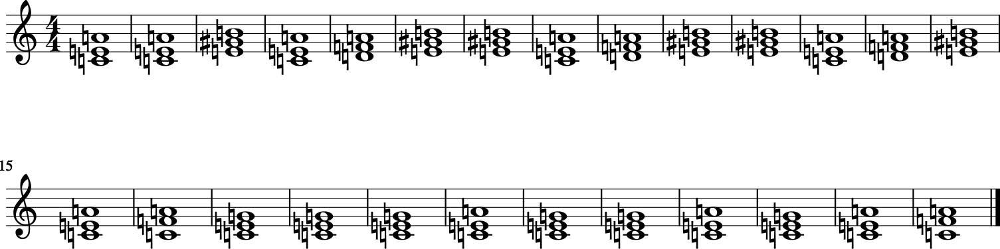

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'C', 'C', 'Am', 'G', 'F', 'G', 'Am', 'G', 'Am', 'C', 'Am', 'G', 'F', 'G7', 'Cm', 'C', 'C7']


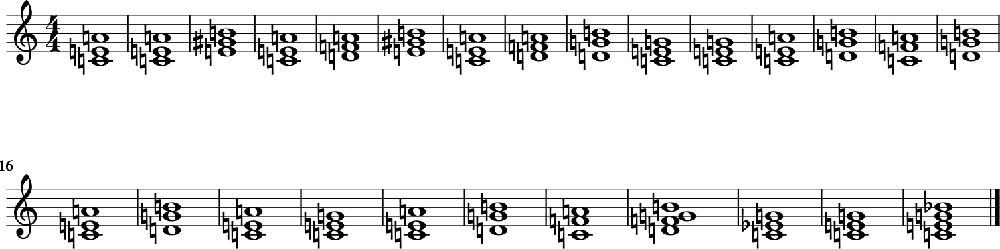

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


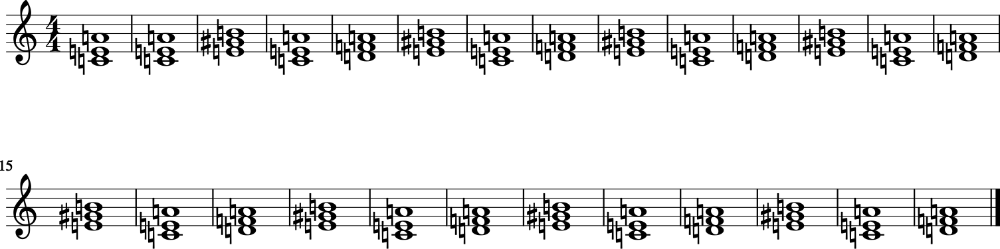

Epoch 24/50
1136924/1136924 [==============================] - 82s 72us/step - loss: 1.8008 - accuracy: 0.5145

Epoch 00024: loss improved from 1.80317 to 1.80084, saving model to word_pred_Model4_2.h5
Epoch: 24
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Bb', 'Am', 'Dm', 'Eb', 'F', 'D', 'Bb', 'C', 'Bb', 'D', 'F', 'C', 'Bb', 'C', 'F', 'Em']


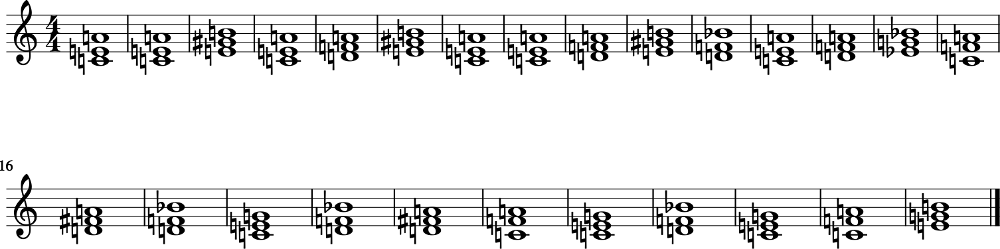

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'Am', 'E', 'Am', 'Am', 'Dm', 'Am', 'E', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'C', 'F', 'E']


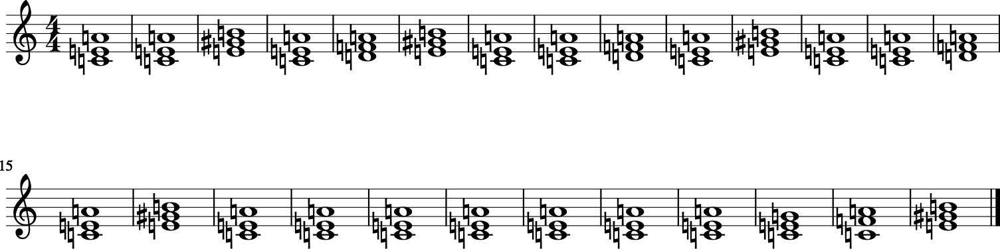

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'C7', 'F', 'F#m', 'Em7', 'Dm', 'G7sus4', 'B7', 'G9', 'G7', 'GM7', 'C7', 'Gm7', 'Fdim', 'F13', 'FM9', 'G9']


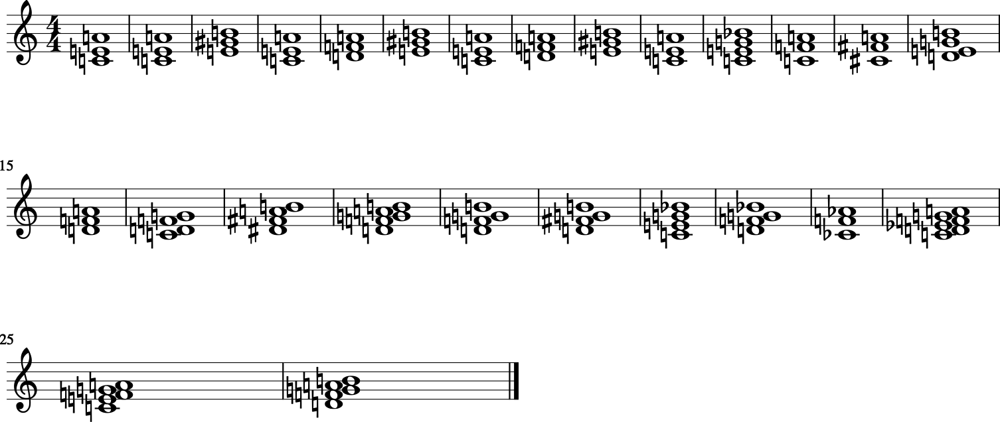

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


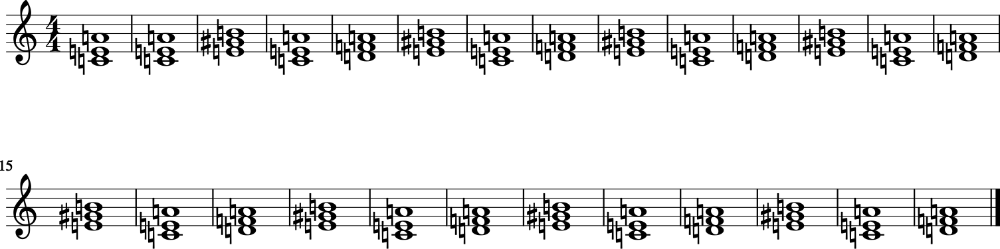

Epoch 25/50
1136924/1136924 [==============================] - 84s 74us/step - loss: 1.7982 - accuracy: 0.5154

Epoch 00025: loss improved from 1.80084 to 1.79821, saving model to word_pred_Model4_2.h5
Epoch: 25
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Dm', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'Dm', 'Bb', 'F']


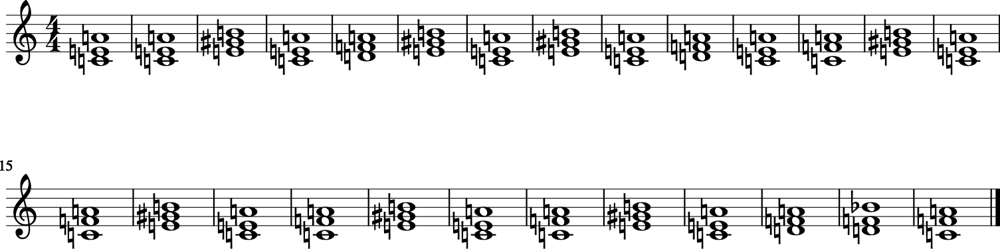

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'E', 'Am', 'B7', 'E', 'E', 'Am', 'E', 'Dm', 'A', 'Am', 'E', 'Am', 'C', 'E', 'Am', 'C', 'E', 'G', 'C']


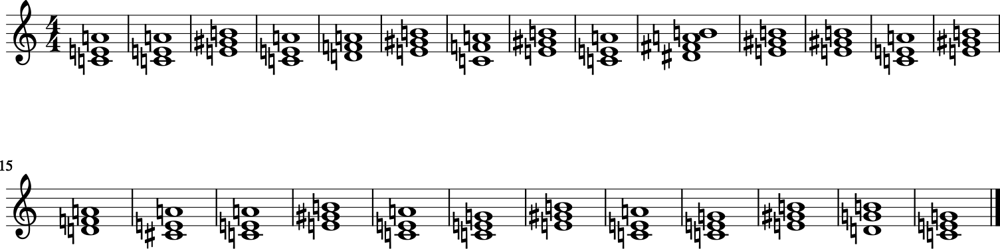

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am7', 'Dm', 'EM7', 'E', 'E7', 'F', 'D', 'Bb', 'A7', 'Db7', 'G7-13', 'Bm', 'Bm7', 'D7', 'C7', 'Ab', 'Ebdim', 'Am6', 'E7', 'E']


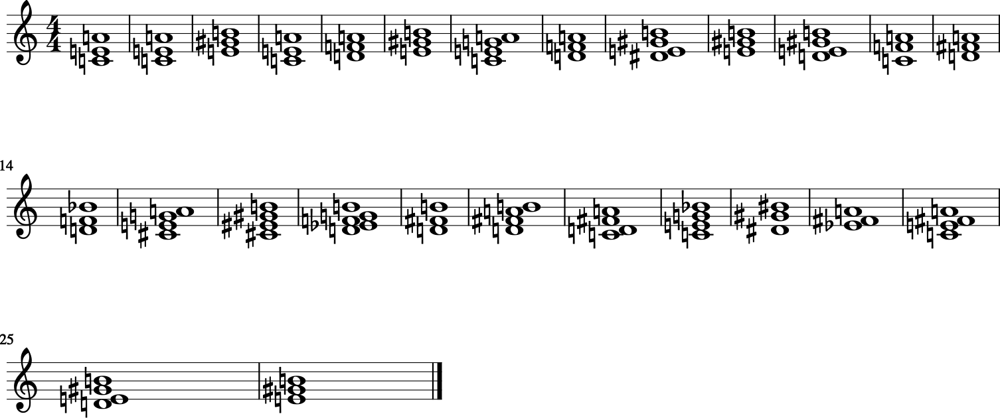

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


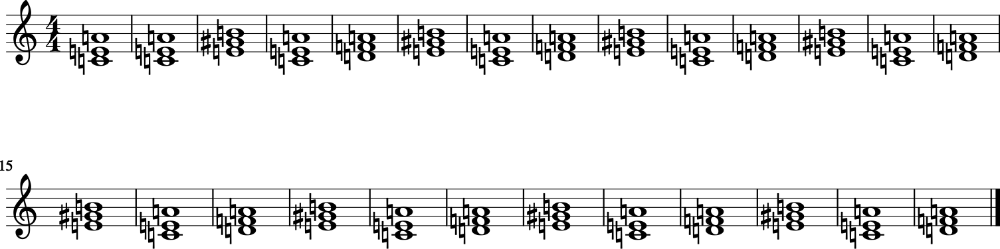

Epoch 26/50
1136924/1136924 [==============================] - 84s 74us/step - loss: 1.7961 - accuracy: 0.5162

Epoch 00026: loss improved from 1.79821 to 1.79606, saving model to word_pred_Model4_2.h5
Epoch: 26
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E7', 'Am', 'Dm', 'Am', 'Bm7', 'Am', 'Dm', 'Am', 'E7', 'Am', 'C', 'Dm', 'G', 'C', 'C', 'Dm', 'G', 'C']


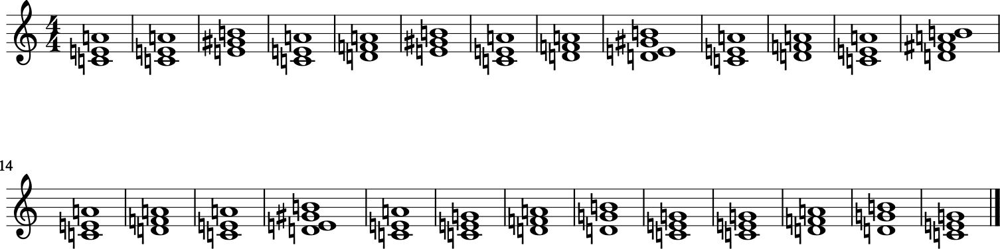

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'Dm7', 'C', 'C', 'Dm7', 'Em7', 'E7sus4', 'Em7', 'E11', 'Em7', 'Bm7', 'Bm7', 'E', 'Am9', 'A', 'AM7', 'Dbm7', 'Bm7', 'DM7', 'E7']


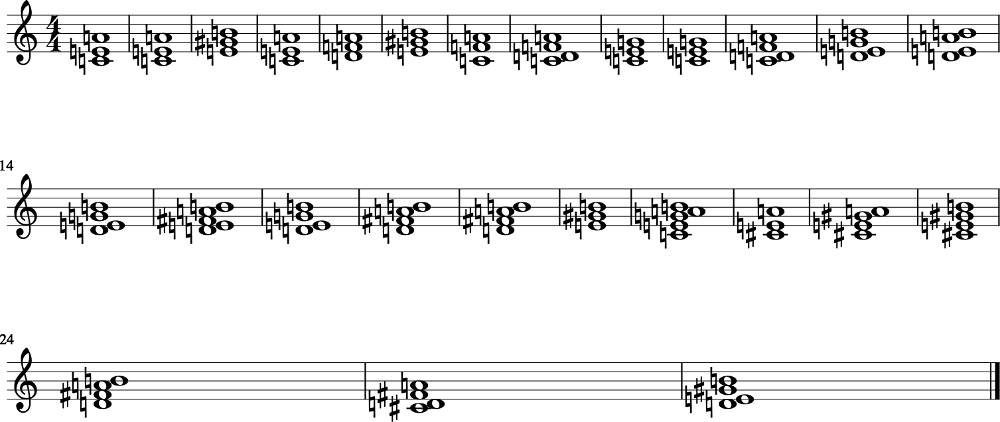

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm7', 'G', 'FM7', 'F', 'Dm7', 'G', 'Am7', 'F#m', 'C', 'C', 'Bm7', 'C', 'Dbdim', 'Em', 'Bsus4', 'Fm7', 'F#', 'Ab7', 'F#M7']


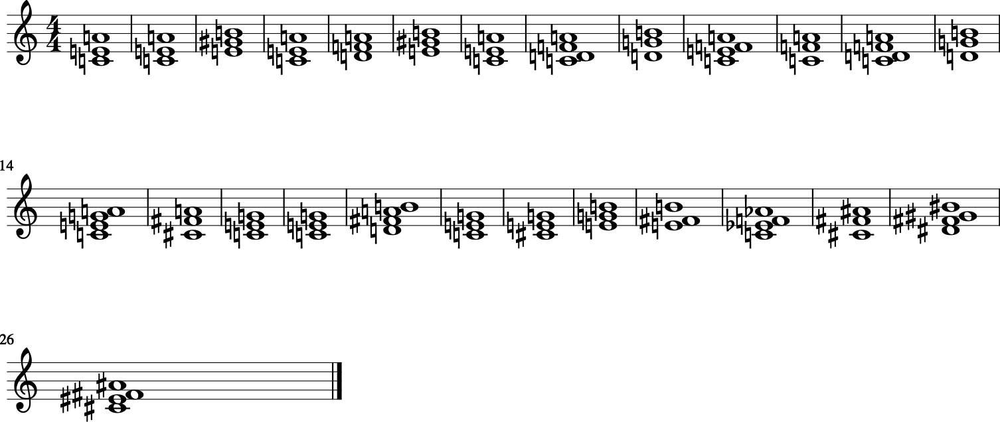

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


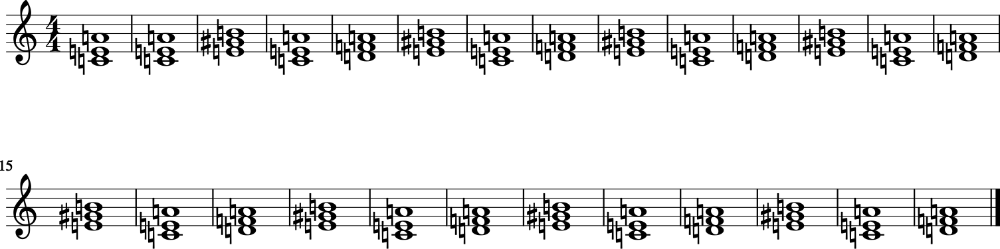

Epoch 27/50
1136924/1136924 [==============================] - 84s 74us/step - loss: 1.7941 - accuracy: 0.5164

Epoch 00027: loss improved from 1.79606 to 1.79406, saving model to word_pred_Model4_2.h5
Epoch: 27
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'F6', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Dm', 'C', 'G', 'Dm', 'G', 'C', 'G']


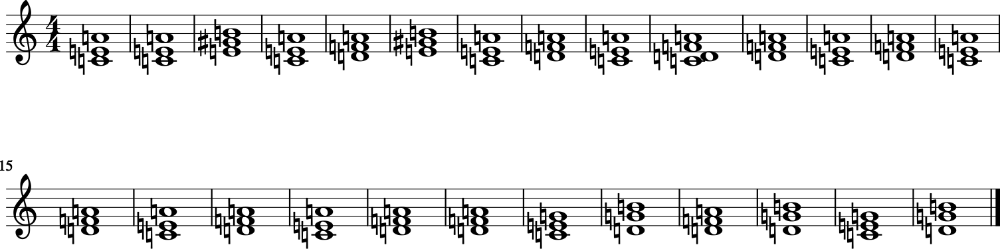

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'Dm', 'G', 'C', 'G', 'Dm', 'G', 'Am', 'G', 'Dm', 'G', 'Am', 'G', 'Dm', 'Am', 'Am', 'F', 'Dm']


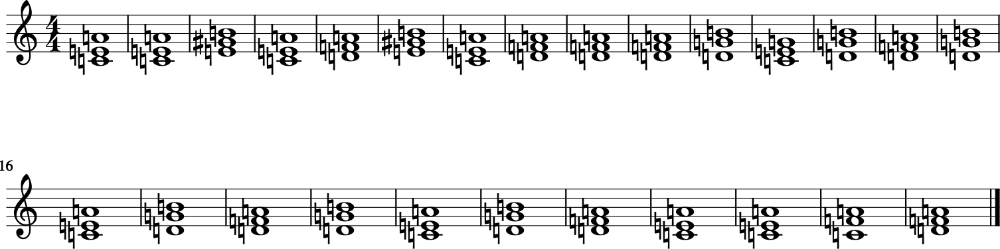

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'Dm7', 'Ddim', 'D', 'D7', 'G7', 'CM7', 'D7', 'GM7', 'A7', 'G9', 'Gdim', 'B7', 'Bm7', 'G', 'Dm7', 'Bm7', 'G9', 'C6']


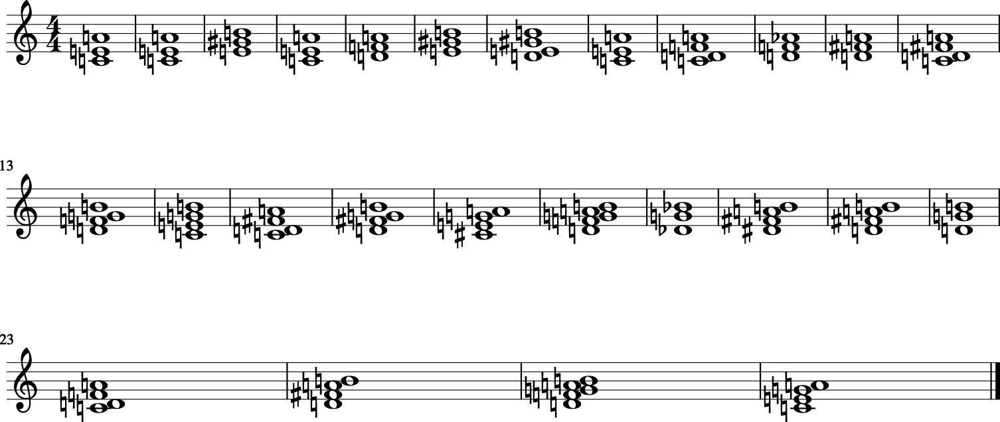

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


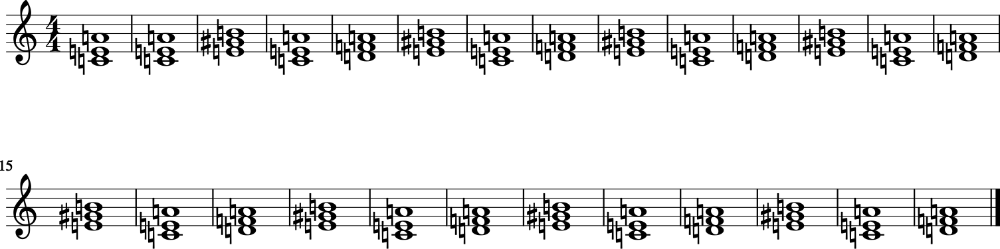

Epoch 28/50
1136924/1136924 [==============================] - 87s 76us/step - loss: 1.7922 - accuracy: 0.5167

Epoch 00028: loss improved from 1.79406 to 1.79222, saving model to word_pred_Model4_2.h5
Epoch: 28
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'E', 'Am', 'Dm', 'Dm']


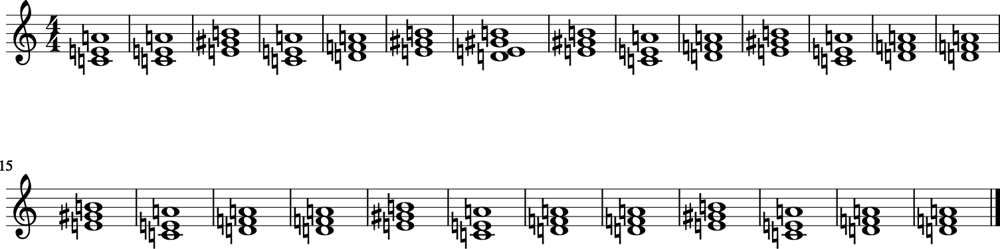

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'Dm', 'Am', 'E7', 'Am', 'Dm', 'Am', 'Dm', 'Em', 'F', 'G', 'C', 'G', 'Am', 'G', 'F', 'C', 'G', 'Am']


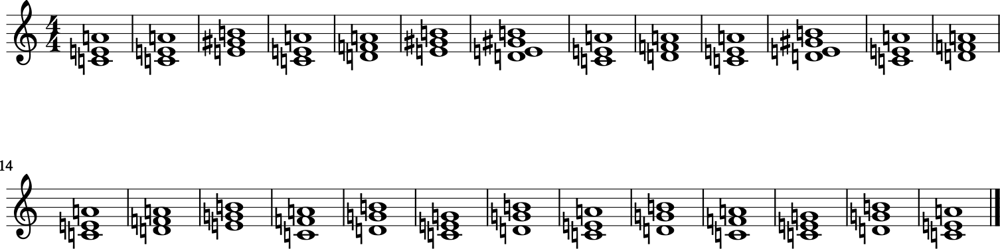

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'Dm', 'F', 'E', 'Am', 'E', 'C', 'C', 'F', 'Am', 'C']


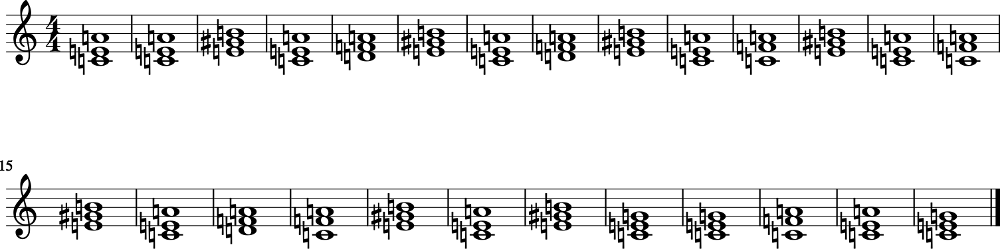

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


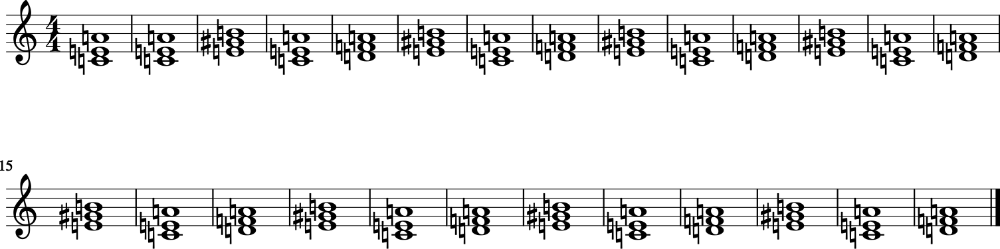

Epoch 29/50
1136924/1136924 [==============================] - 96s 84us/step - loss: 1.7901 - accuracy: 0.5175

Epoch 00029: loss improved from 1.79222 to 1.79014, saving model to word_pred_Model4_2.h5
Epoch: 29
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'F', 'E', 'Am', 'Dm', 'F', 'E', 'Am', 'F', 'Am', 'E', 'Am', 'F', 'Am', 'E', 'Am']


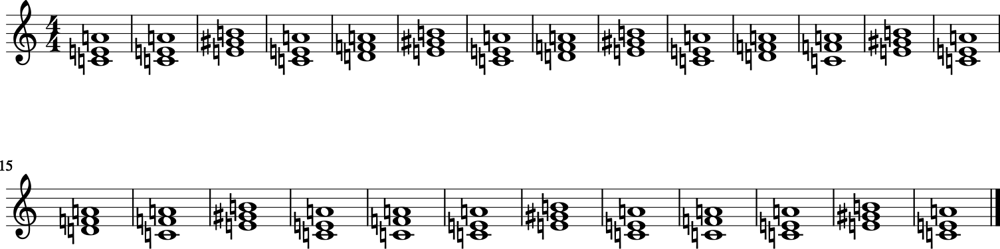

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'Dm', 'E', 'Dm', 'Am', 'Am6', 'Am', 'Am', 'Dm7', 'E7', 'Am', 'F', 'Fdim', 'C', 'E7', 'Am']


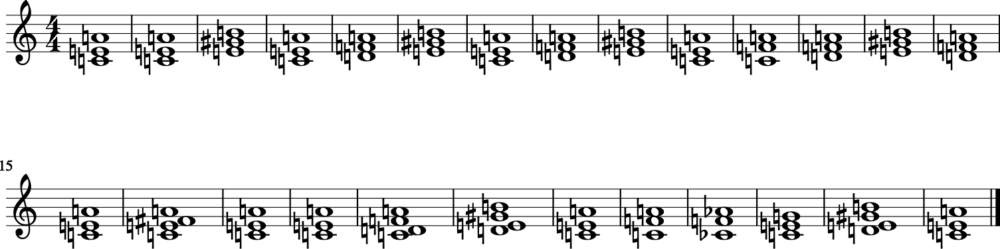

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'C', 'F', 'E', 'Am', 'G', 'F', 'E', 'Dm', 'G', 'F', 'G', 'F', 'G', 'Am', 'G', 'F', 'G', 'F', 'C']


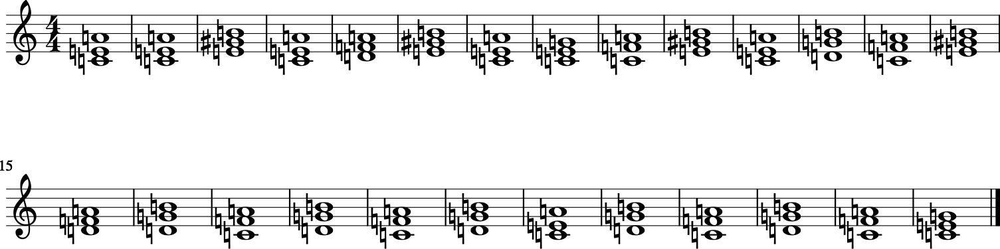

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


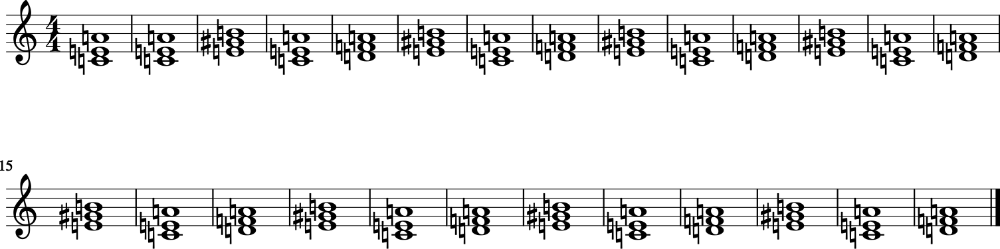

Epoch 30/50
1136924/1136924 [==============================] - 101s 89us/step - loss: 1.7888 - accuracy: 0.5183

Epoch 00030: loss improved from 1.79014 to 1.78882, saving model to word_pred_Model4_2.h5
Epoch: 30
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Am', 'Dm', 'Am', 'Am', 'E', 'Am', 'C']


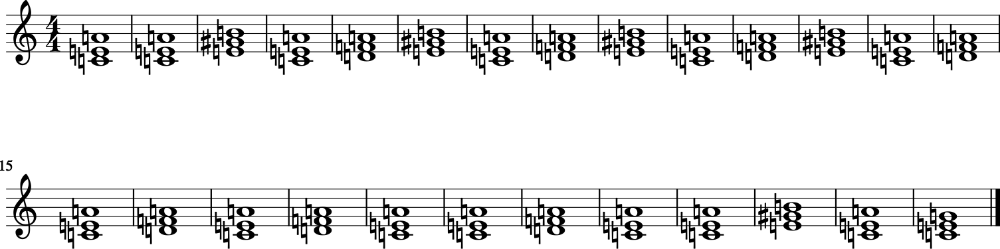

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Am', 'E', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am', 'Am']


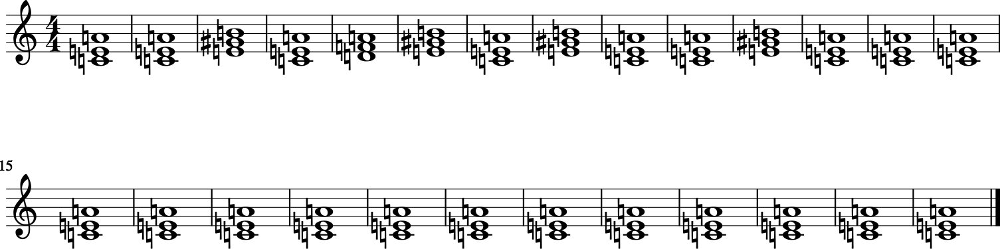

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'C', 'F', 'Dm', 'F', 'F', 'F', 'Bb', 'F', 'F', 'F', 'Am', 'Bb', 'Dm', 'F', 'F', 'Bb', 'D', 'F', 'Bb']


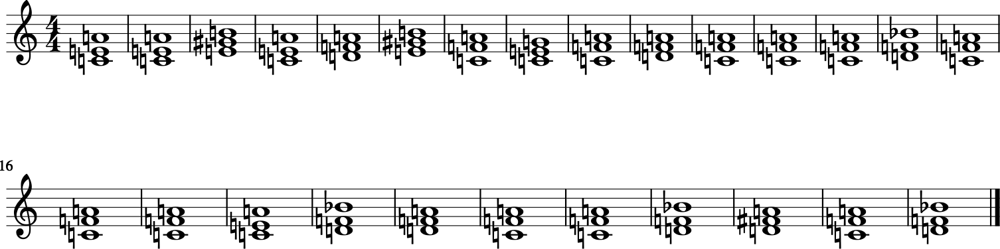

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


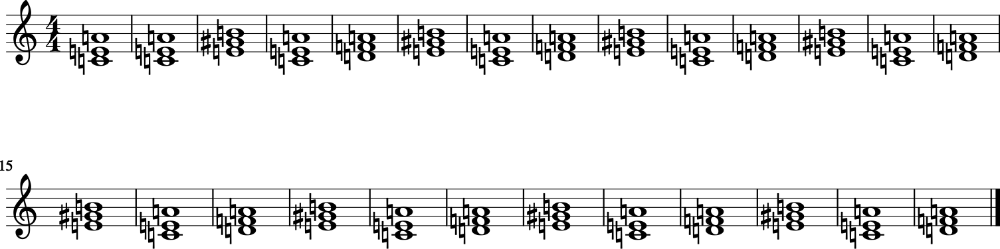

Epoch 31/50
1136924/1136924 [==============================] - 98s 87us/step - loss: 1.7870 - accuracy: 0.5184

Epoch 00031: loss improved from 1.78882 to 1.78703, saving model to word_pred_Model4_2.h5
Epoch: 31
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Dm', 'Am', 'E', 'E7', 'Am', 'C', 'E', 'E7', 'E', 'Am', 'Dm', 'E', 'G', 'G', 'Am']


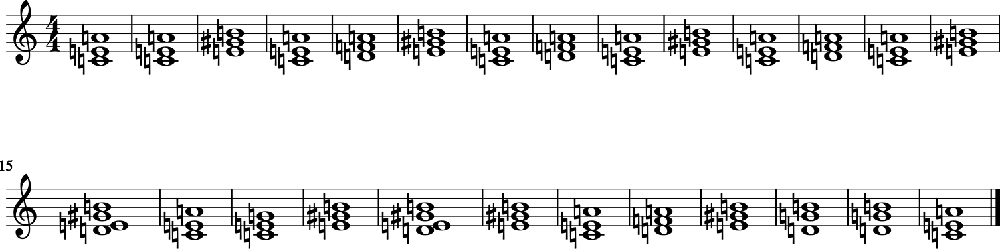

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'Dm6', 'F', 'E', 'Am', 'Am7', 'Bb', 'Am', 'C', 'Bb', 'C', 'Eb', 'Bb', 'Cm', 'Bb', 'Bb', 'Bb', 'Bb', 'Cm', 'Eb']


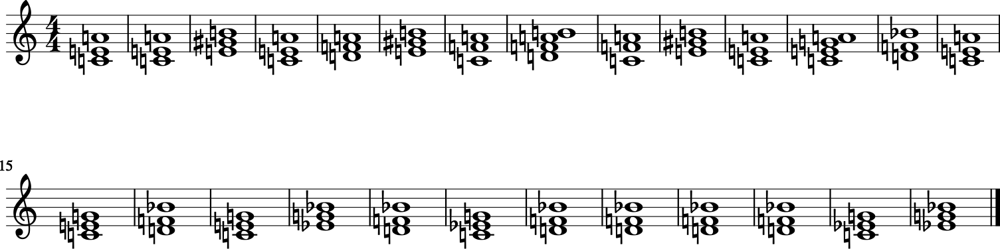

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E', 'Am', 'Dm', 'Bb', 'F', 'C', 'Bb', 'F', 'C', 'F', 'C', 'G', 'Am', 'F', 'C', 'G', 'Am', 'F', 'C', 'G']


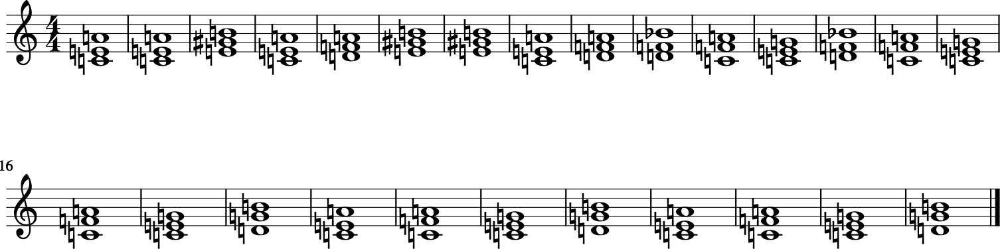

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


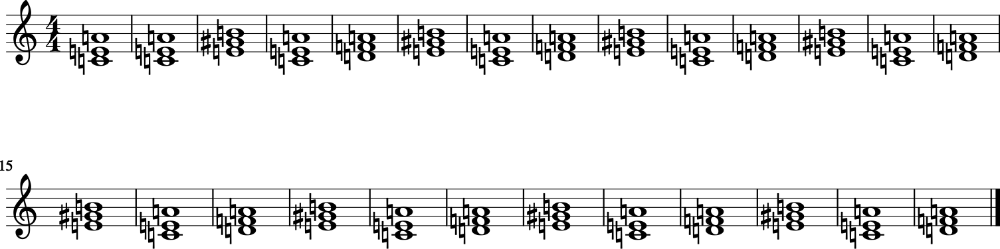

Epoch 32/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7858 - accuracy: 0.5188

Epoch 00032: loss improved from 1.78703 to 1.78577, saving model to word_pred_Model4_2.h5
Epoch: 32
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'F', 'E', 'Am', 'G', 'C', 'Bb', 'C', 'F', 'G', 'Bb', 'C', 'C', 'F', 'G', 'A', 'C', 'F', 'G']


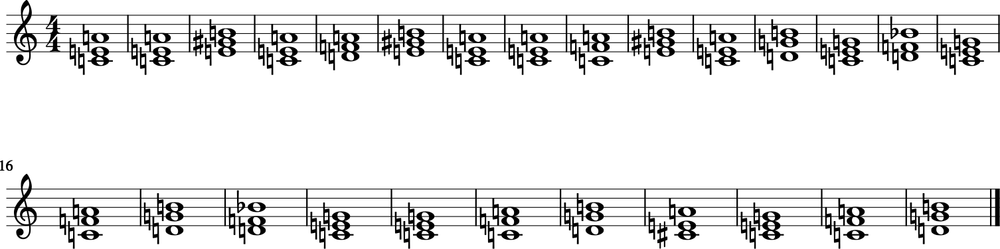

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'C', 'F', 'E', 'Am', 'C', 'F', 'E', 'Am', 'C', 'F', 'E', 'Am', 'C', 'F', 'E', 'Am', 'D', 'E', 'Am']


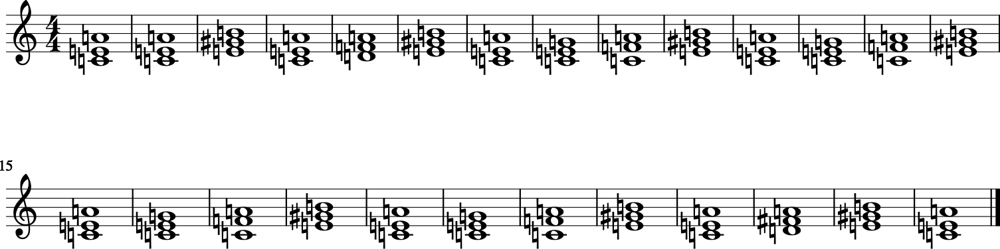

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'D', 'Dm', 'E', 'Am', 'Am', 'Em', 'F#m7b5', 'Am', 'Em', 'Am', 'G', 'C', 'A5', 'Bb', 'Ab6', 'F', 'C', 'Am9', 'F']


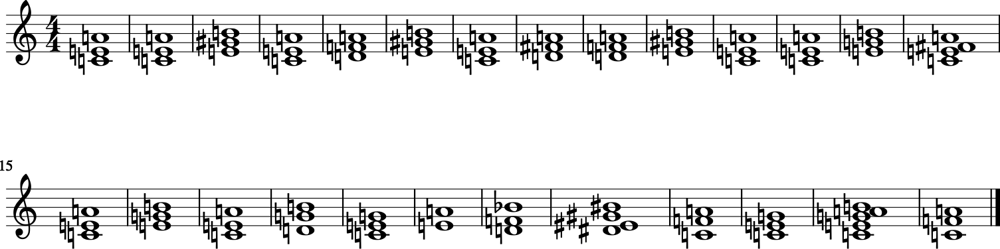

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


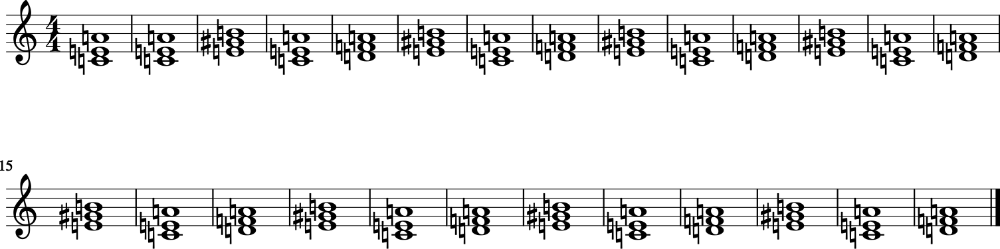

Epoch 33/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7843 - accuracy: 0.5194

Epoch 00033: loss improved from 1.78577 to 1.78432, saving model to word_pred_Model4_2.h5
Epoch: 33
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'Dm', 'G', 'Am', 'Em', 'Dm', 'G', 'C', 'Gm7', 'Em', 'F', 'G', 'C', 'Am7', 'C']


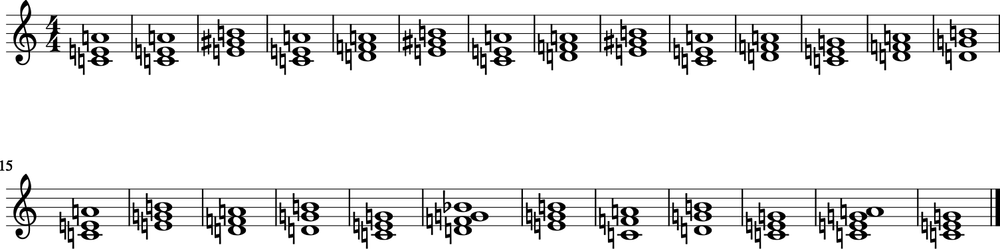

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'FM7', 'G7', 'E7', 'Am', 'Dm7', 'G7', 'C', 'E7', 'Am', 'G', 'E7', 'Am', 'D7', 'Dm7', 'E7', 'Am', 'D7', 'Dm7', 'E7']


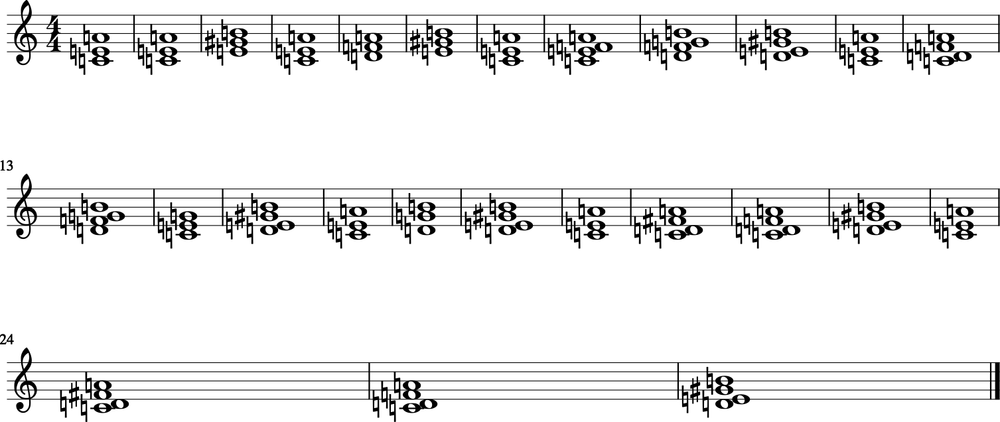

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Gm', 'C', 'Am', 'E', 'Dm', 'Dm', 'Bb', 'G', 'C', 'Bb', 'Caug', 'F', 'E', 'G9', 'G']


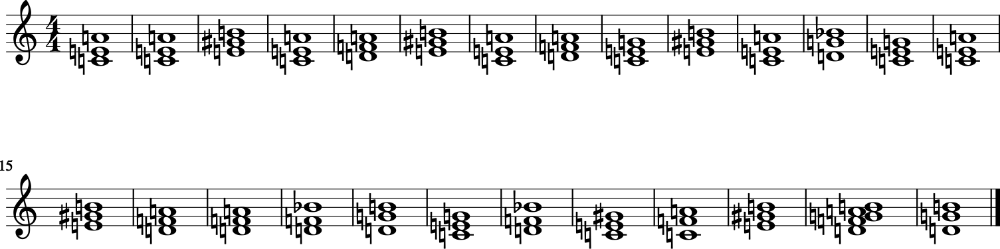

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


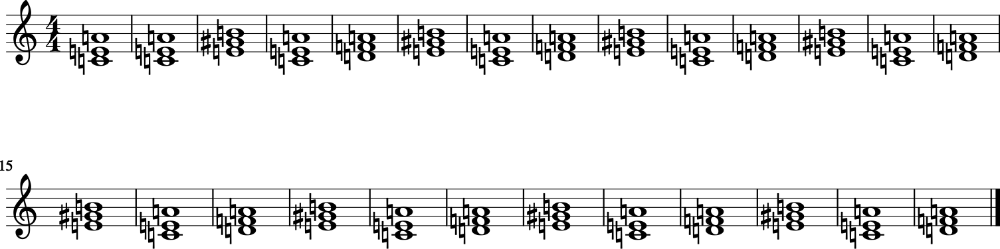

Epoch 34/50
1136924/1136924 [==============================] - 98s 87us/step - loss: 1.7828 - accuracy: 0.5198

Epoch 00034: loss improved from 1.78432 to 1.78283, saving model to word_pred_Model4_2.h5
Epoch: 34
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'FM7', 'E', 'Am', 'Am', 'FM7', 'E', 'Am', 'Dm', 'E', 'FM7', 'E', 'Am', 'Am']


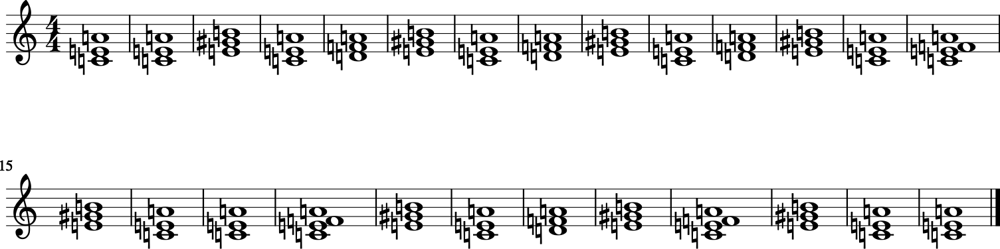

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'C', 'Dm', 'C', 'F', 'G', 'F', 'G', 'F', 'G', 'F', 'G', 'G7', 'C', 'G7', 'C', 'D7', 'D7', 'C']


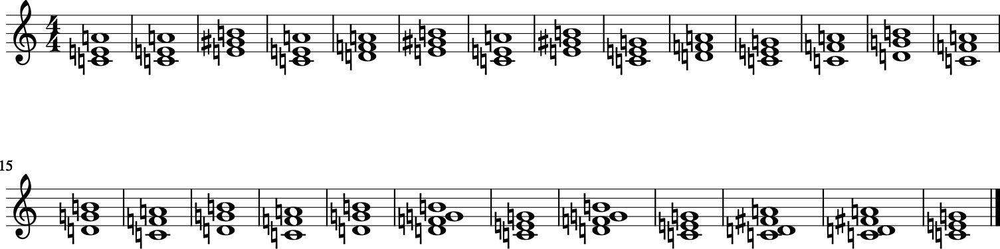

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Am', 'F', 'F', 'C', 'Am', 'F', 'C', 'Am', 'F', 'G', 'C']


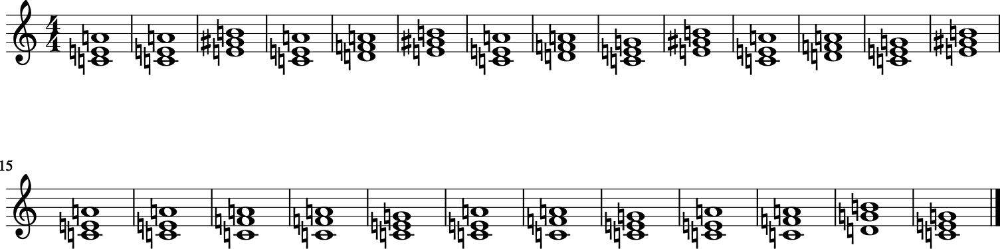

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


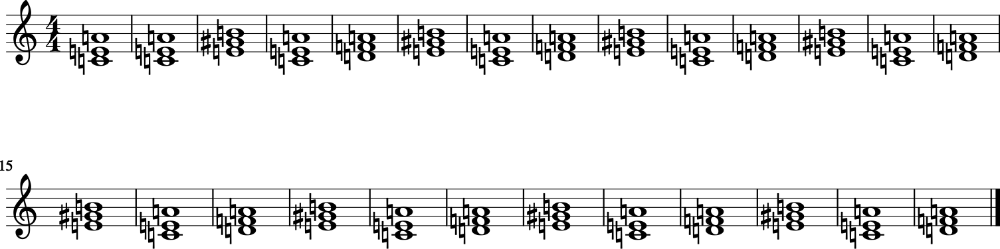

Epoch 35/50
1136924/1136924 [==============================] - 99s 87us/step - loss: 1.7815 - accuracy: 0.5196

Epoch 00035: loss improved from 1.78283 to 1.78154, saving model to word_pred_Model4_2.h5
Epoch: 35
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'Dm', 'Am', 'E7', 'E', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'F']


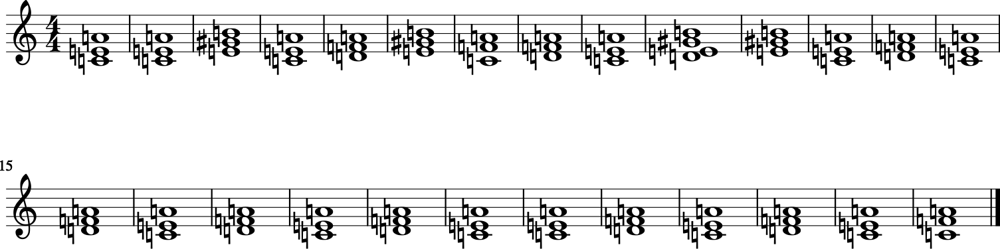

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'A', 'Am', 'Dm', 'C', 'Am', 'Dm', 'C', 'Am', 'FM7', 'C', 'G', 'Am', 'FM7', 'C', 'FM7', 'C', 'C', 'FM7', 'C', 'C']


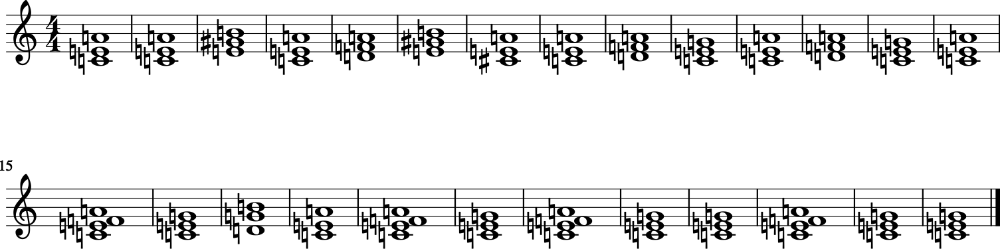

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'Dm', 'E', 'Dm', 'G', 'C', 'F', 'Dm', 'G', 'C', 'Am', 'G', 'Dm', 'F', 'F', 'C', 'Em', 'F', 'C7']


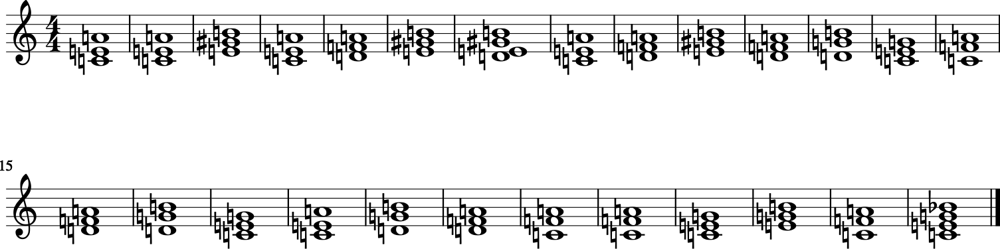

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


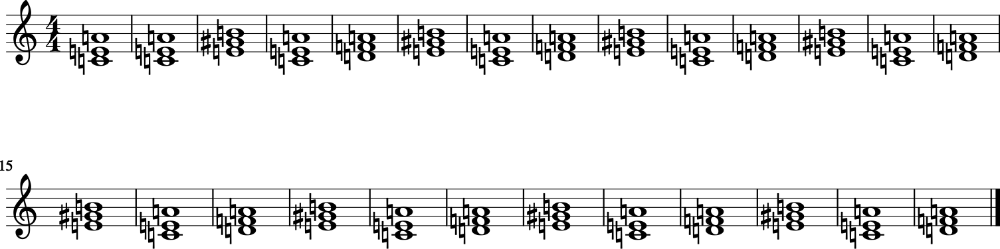

Epoch 36/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7804 - accuracy: 0.5202

Epoch 00036: loss improved from 1.78154 to 1.78040, saving model to word_pred_Model4_2.h5
Epoch: 36
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'C', 'F', 'E', 'Am', 'C', 'F', 'E', 'E', 'Am', 'Am', 'Am', 'E', 'Am']


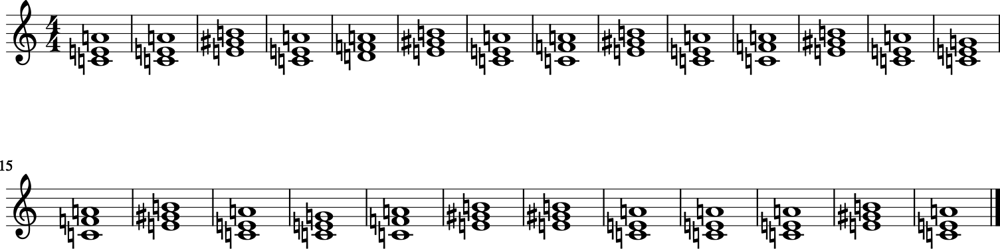

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'E', 'E', 'Am', 'Dm', 'A', 'F#', 'E', 'Am', 'F#', 'Abm', 'A', 'F#m', 'Abm', 'A', 'B', 'A', 'Abm']


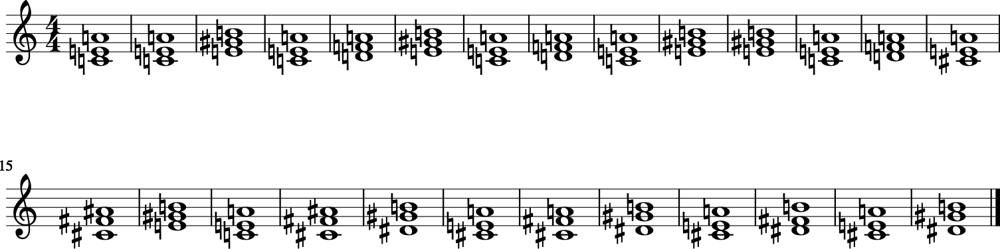

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Em', 'F', 'E', 'Am', 'F', 'E', 'Am', 'FM7', 'Am', 'F', 'Am', 'FM7', 'Am', 'F', 'C', 'Am', 'Dm7', 'C']


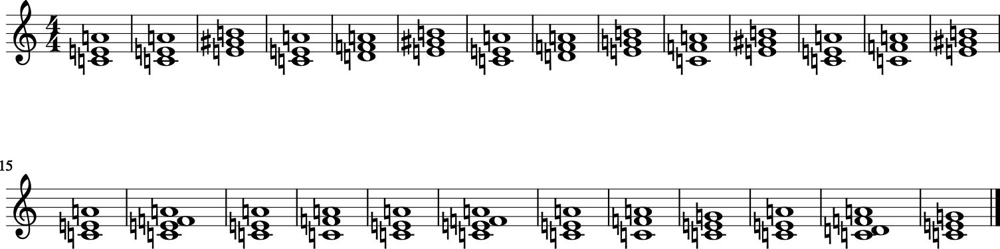

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


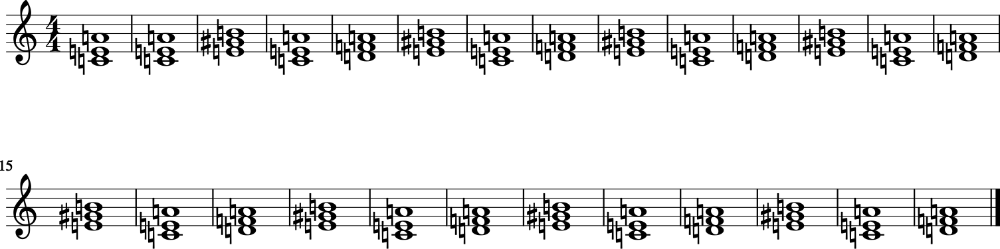

Epoch 37/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7792 - accuracy: 0.5207

Epoch 00037: loss improved from 1.78040 to 1.77917, saving model to word_pred_Model4_2.h5
Epoch: 37
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'E', 'Am', 'Dm', 'C', 'C', 'E', 'E', 'F', 'G', 'E7', 'G', 'F', 'B', 'G']


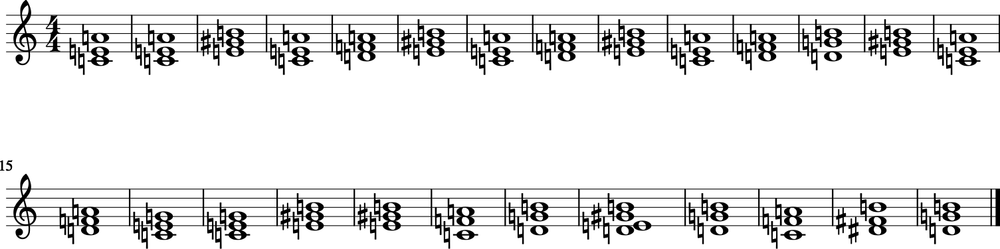

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'C', 'E', 'Am', 'E', 'Am7', 'D', 'G', 'Em', 'D', 'G', 'G', 'Em', 'D', 'G', 'Am', 'D7', 'G']


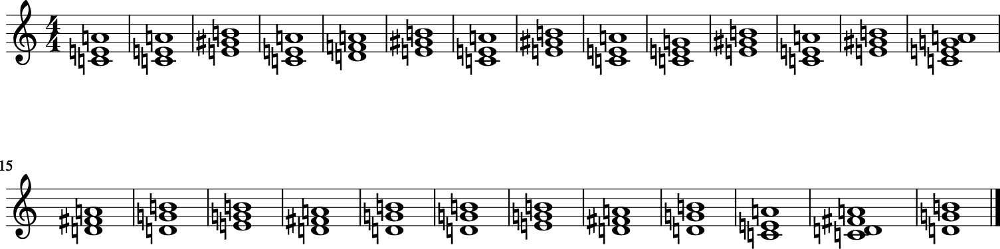

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'Am', 'F', 'C', 'E7', 'E', 'E7', 'Am', 'D7', 'G', 'Em', 'Am', 'D7', 'G', 'Bm', 'Em', 'G', 'D', 'Em']


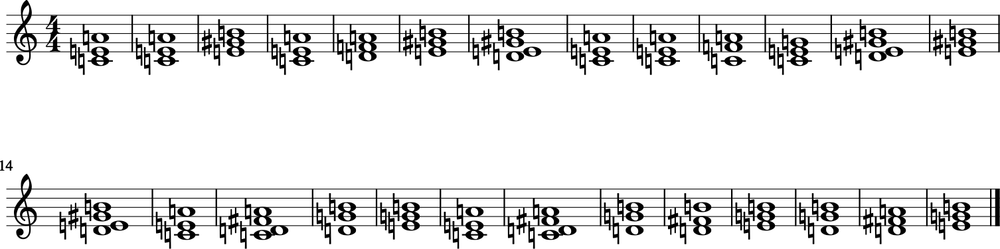

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


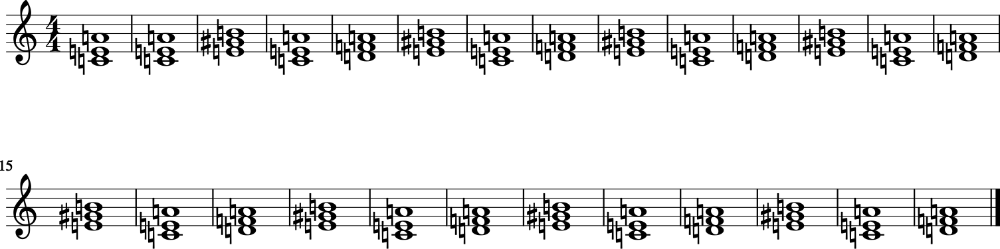

Epoch 38/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7781 - accuracy: 0.5207

Epoch 00038: loss improved from 1.77917 to 1.77813, saving model to word_pred_Model4_2.h5
Epoch: 38
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'Am', 'Dm', 'Am', 'F', 'Am', 'Dm', 'Am', 'Am', 'Dm', 'C', 'Dm', 'Dm', 'C', 'G', 'Dm', 'C', 'G', 'Dm']


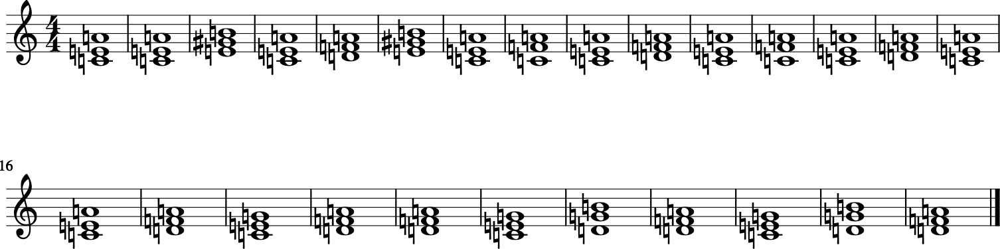

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'G', 'Am', 'F', 'G', 'F', 'C', 'Am']


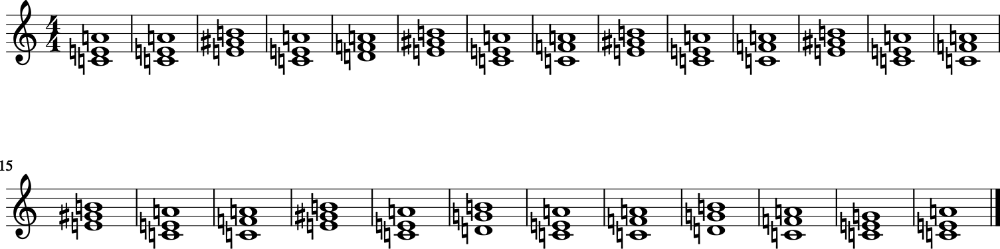

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Em', 'E7', 'Em', 'D', 'Am', 'B7', 'Em', 'C', 'G', 'Am', 'Bm', 'Em', 'A', 'Em', 'G', 'A', 'Em', 'G']


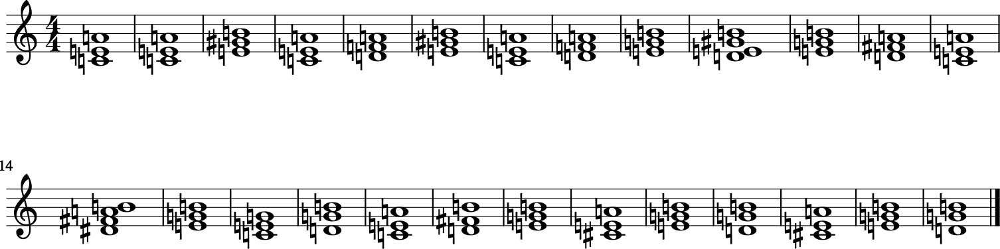

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


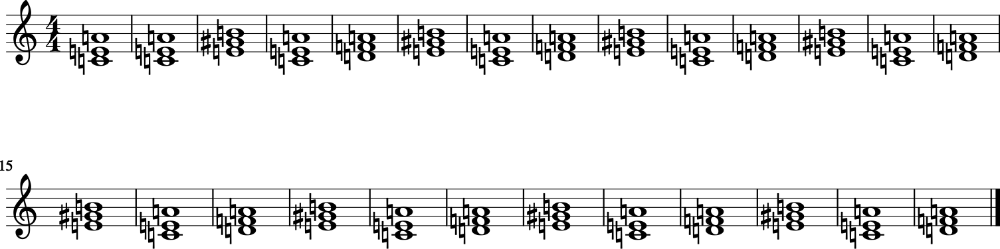

Epoch 39/50
1136924/1136924 [==============================] - 97s 85us/step - loss: 1.7770 - accuracy: 0.5213

Epoch 00039: loss improved from 1.77813 to 1.77695, saving model to word_pred_Model4_2.h5
Epoch: 39
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'Dm', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'E', 'Am', 'Am', 'Dm', 'Am', 'Dm', 'G']


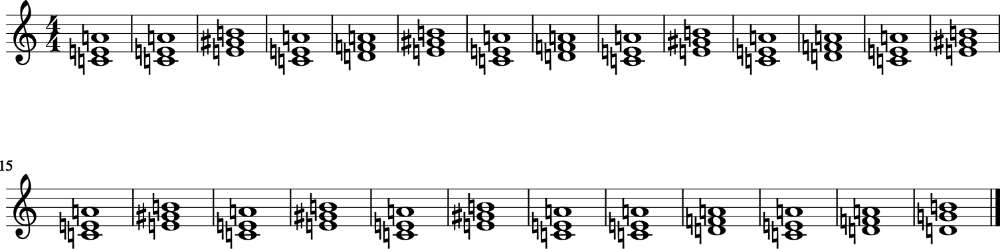

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'D', 'F', 'E', 'Am', 'E', 'C', 'E', 'F', 'A7', 'G', 'A7', 'Dm', 'D', 'Em', 'G', 'C', 'F', 'C']


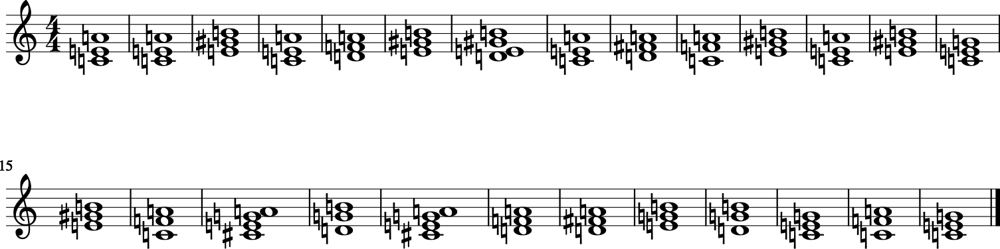

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'FM7', 'E', 'Am', 'F', 'FM7', 'Em', 'F', 'Dm', 'G', 'Gsus4', 'F', 'Fadd9', 'G', 'Am', 'F', 'C', 'C', 'G']


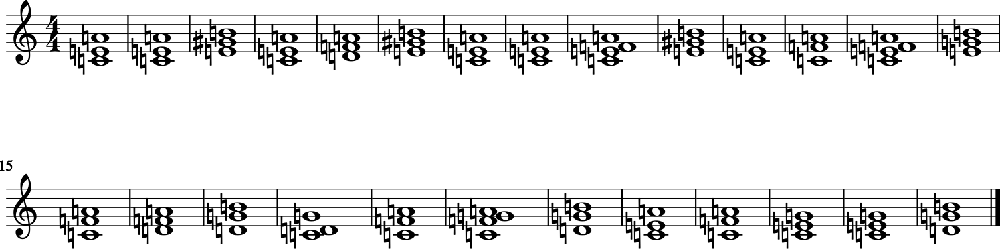

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


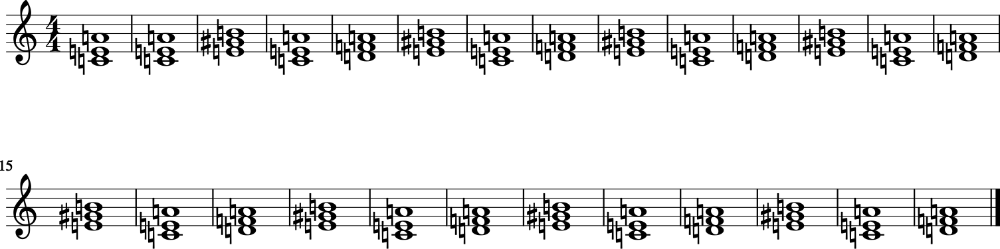

Epoch 40/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7760 - accuracy: 0.5216

Epoch 00040: loss improved from 1.77695 to 1.77603, saving model to word_pred_Model4_2.h5
Epoch: 40
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'C', 'G', 'C', 'F', 'G', 'C', 'C', 'F', 'G', 'C', 'C', 'G', 'C', 'C', 'G', 'Am', 'F']


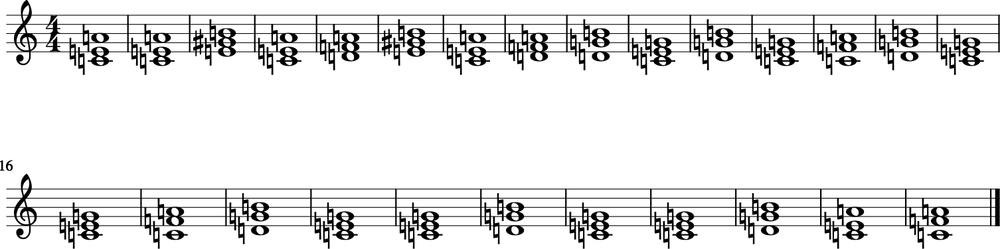

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'E', 'F7', 'A7', 'D9', 'E', 'Em9', 'A7', 'A', 'A', 'E', 'A', 'E', 'A', 'B', 'E', 'A', 'B', 'E', 'A', 'B']


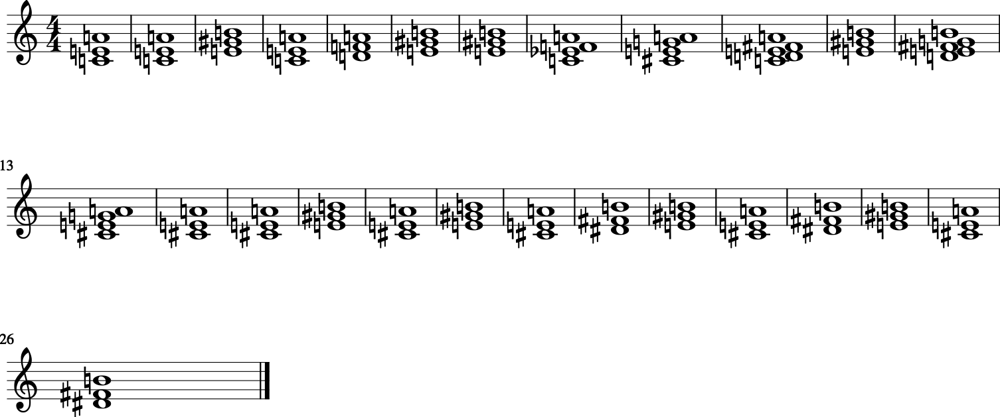

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'E', 'D7', 'Dm', 'Ab', 'C', 'FM7', 'Dm7', 'C', 'Dm7', 'G', 'Fadd9', 'C', 'Fsus2', 'C', 'F', 'F', 'Gsus4', 'Am']


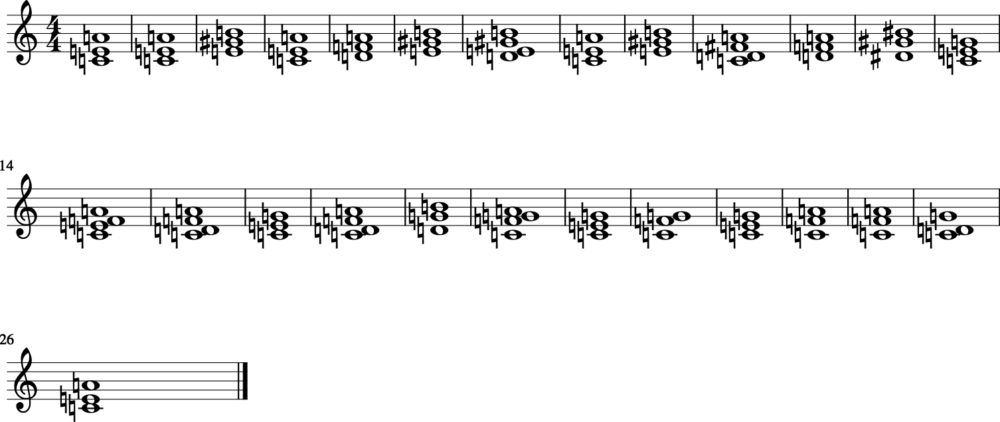

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


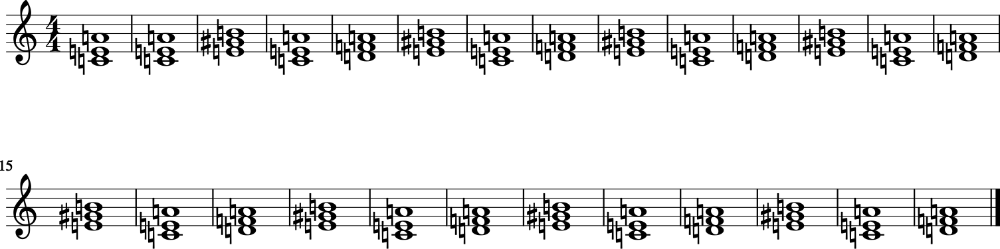

Epoch 41/50
1136924/1136924 [==============================] - 97s 85us/step - loss: 1.7754 - accuracy: 0.5219

Epoch 00041: loss improved from 1.77603 to 1.77539, saving model to word_pred_Model4_2.h5
Epoch: 41
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'C', 'F', 'G', 'C', 'F', 'G', 'C', 'F', 'G', 'C', 'F', 'G', 'C']


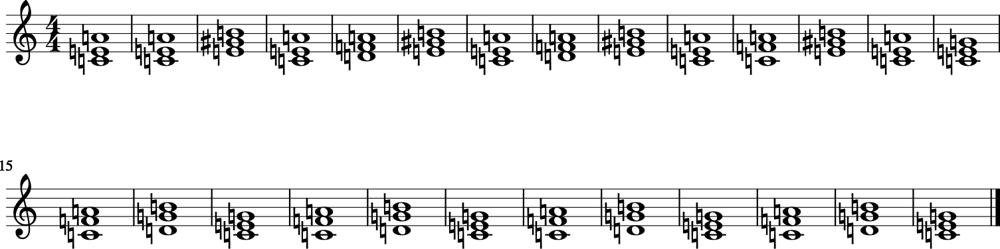

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'C', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Am', 'E', 'Am', 'Dm', 'Am', 'F', 'E', 'Am', 'F', 'Am', 'G', 'Am']


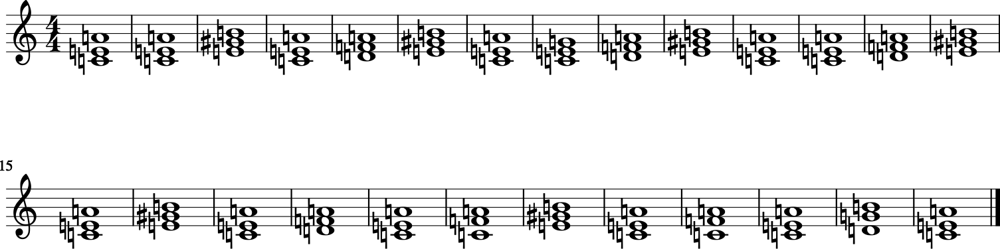

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Dm', 'A', 'E7', 'A7', 'Dm', 'Bb6', 'AM7', 'Bm', 'E', 'G7', 'G7', 'Dbm7', 'F#', 'Ddim', 'Eb', 'BM7', 'E', 'Eb', 'Eb', 'Eb']


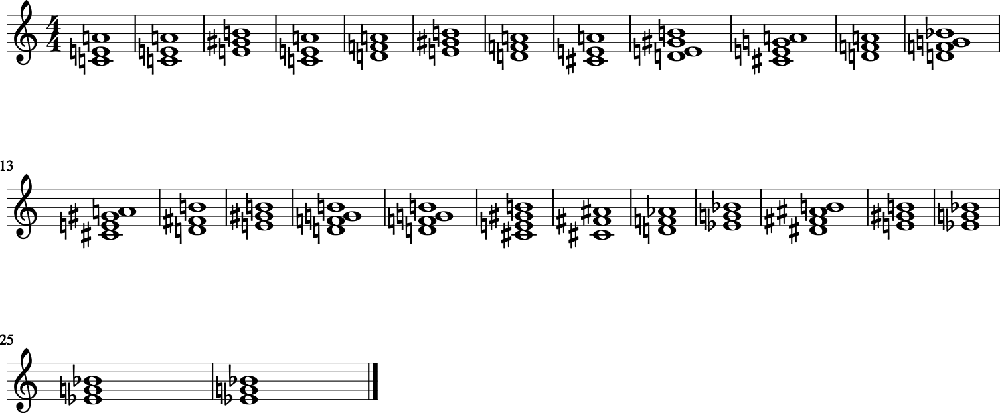

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


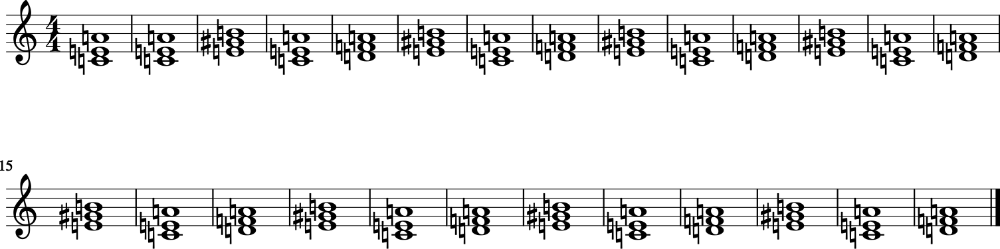

Epoch 42/50
1136924/1136924 [==============================] - 97s 85us/step - loss: 1.7743 - accuracy: 0.5219

Epoch 00042: loss improved from 1.77539 to 1.77427, saving model to word_pred_Model4_2.h5
Epoch: 42
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'C', 'E', 'Am', 'Dm', 'C', 'E']


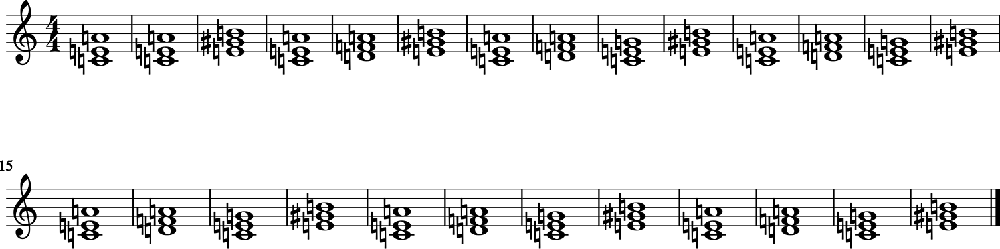

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E7', 'Am', 'Dm', 'Dm', 'F', 'Em', 'D', 'F9', 'D', 'F', 'Ab', 'E', 'Bm', 'A', 'B', 'E', 'Bm', 'A']


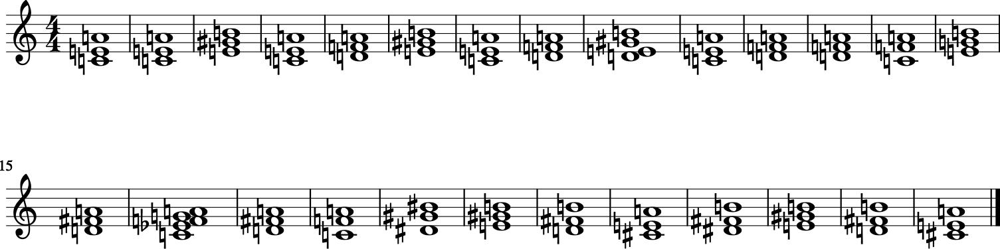

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'C7', 'Am', 'E', 'G', 'C', 'F', 'Em', 'F', 'C', 'F', 'Em', 'F', 'Dm', 'G', 'C', 'Am', 'F', 'Dm', 'G']


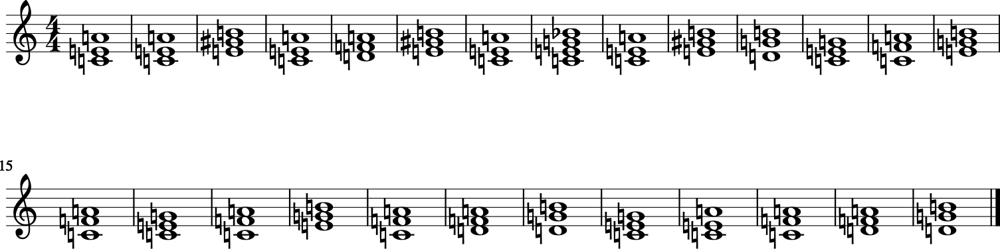

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


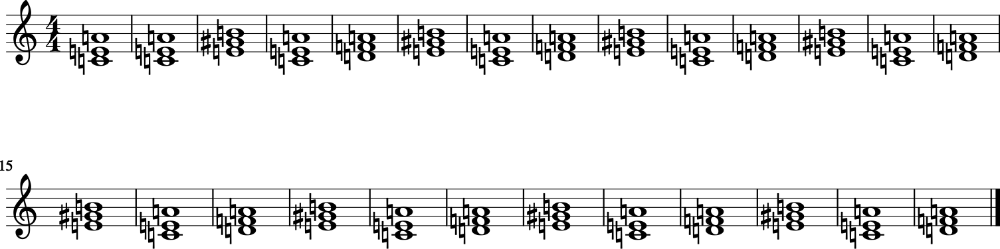

Epoch 43/50
1136924/1136924 [==============================] - 89s 78us/step - loss: 1.7732 - accuracy: 0.5221

Epoch 00043: loss improved from 1.77427 to 1.77321, saving model to word_pred_Model4_2.h5
Epoch: 43
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'C', 'F', 'F', 'C', 'C', 'F', 'F', 'C', 'C', 'G', 'F', 'C', 'G', 'C']


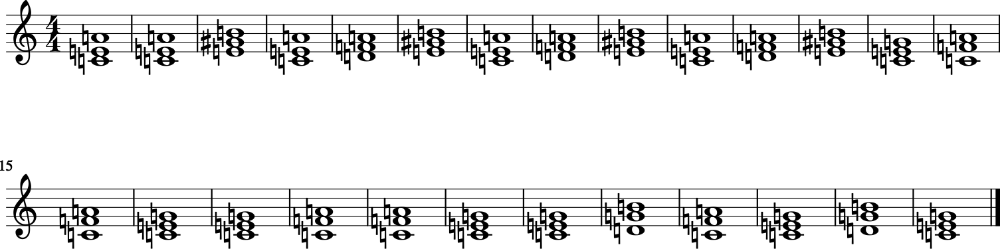

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'E', 'Am', 'D', 'Dm', 'Dm', 'E', 'Bb', 'G', 'Dm', 'C7', 'G', 'Dm', 'G']


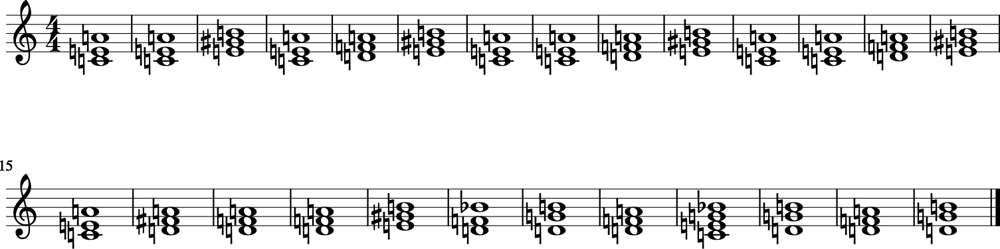

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'G', 'Am', 'Dm', 'G', 'C', 'G', 'C', 'C', 'Am', 'C', 'D', 'C', 'C']


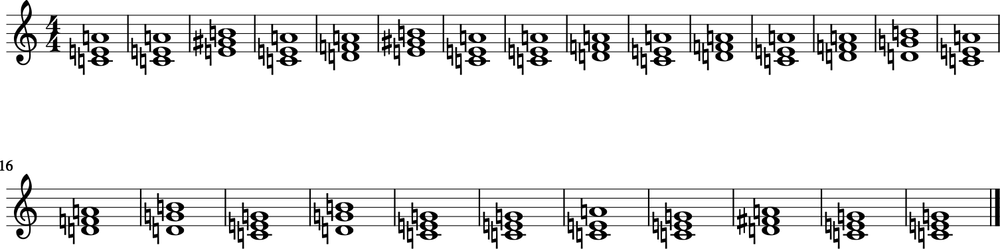

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


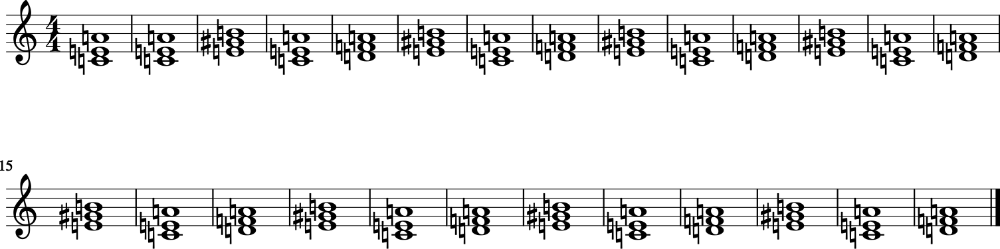

Epoch 44/50
1136924/1136924 [==============================] - 97s 85us/step - loss: 1.7722 - accuracy: 0.5220

Epoch 00044: loss improved from 1.77321 to 1.77224, saving model to word_pred_Model4_2.h5
Epoch: 44
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Dm', 'A', 'Dm', 'E', 'E', 'E', 'F#m', 'A', 'D', 'E', 'E', 'A', 'D', 'E', 'D', 'A', 'D', 'E', 'D', 'A']


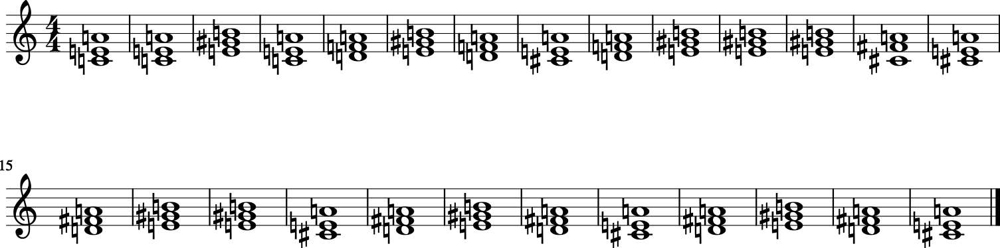

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'G', 'F', 'E', 'Am', 'G', 'F', 'Am', 'G', 'Am', 'Am', 'G', 'C', 'Am', 'G', 'C', 'Am', 'G', 'C', 'Am']


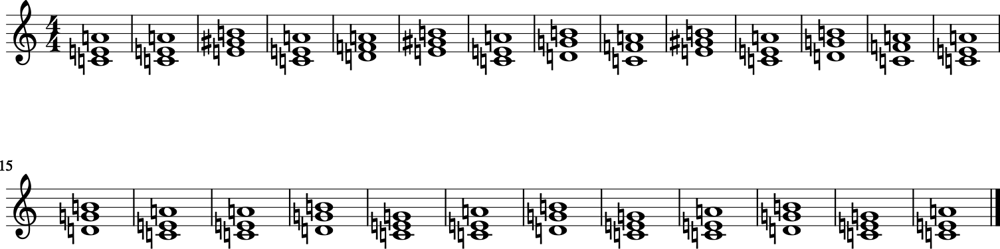

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'FM7', 'G', 'F', 'C', 'FM7', 'Dm', 'C', 'Dm', 'Dm', 'Dm', 'C', 'Dm', 'F', 'Dm', 'F', 'G', 'Bb', 'F', 'G']


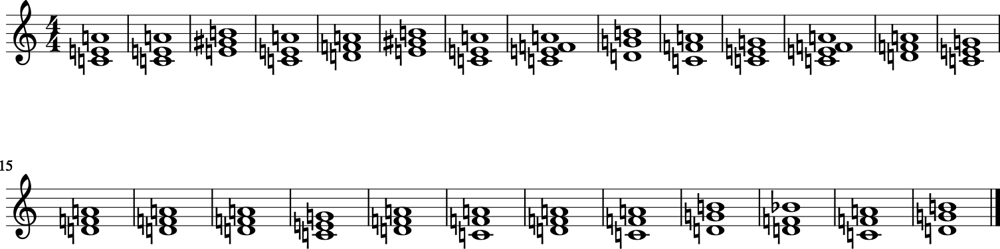

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


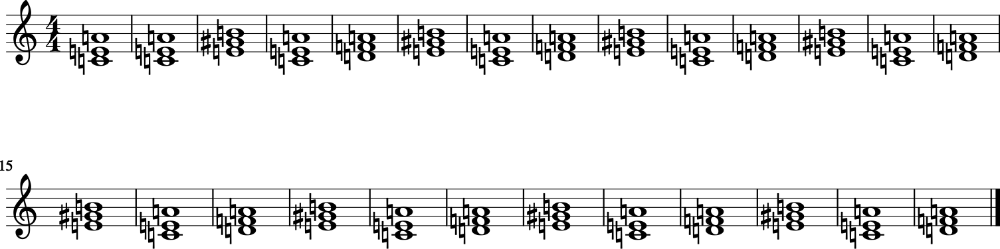

Epoch 45/50
1136924/1136924 [==============================] - 97s 86us/step - loss: 1.7716 - accuracy: 0.5225

Epoch 00045: loss improved from 1.77224 to 1.77159, saving model to word_pred_Model4_2.h5
Epoch: 45
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am', 'Dm', 'Am']


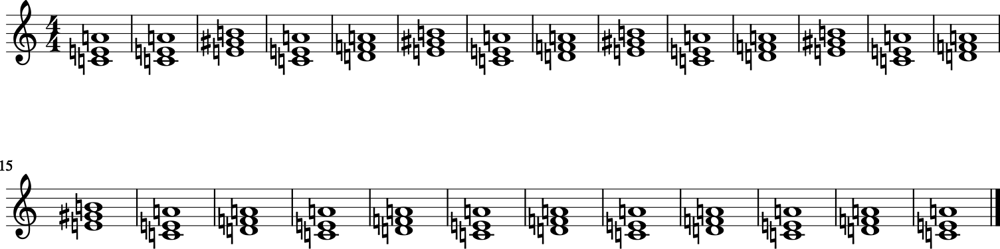

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'E', 'Dm', 'G', 'Dm', 'Am', 'F', 'Em', 'Am', 'F', 'Em', 'Am', 'C', 'A', 'C', 'Em', 'G', 'E', 'C', 'Em']


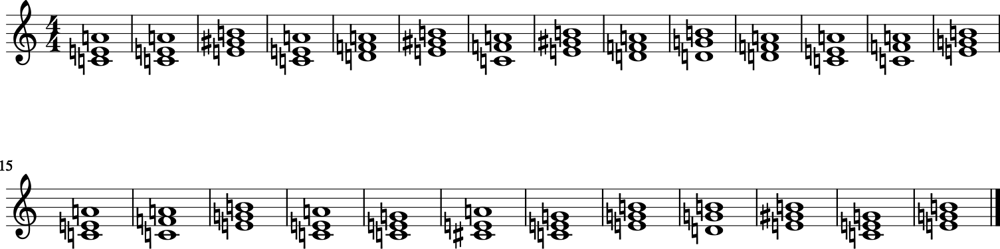

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Dbm', 'Am', 'G6', 'Dbm', 'Dbm', 'Asus4', 'Bsus4', 'A', 'B5', 'Dbm', 'A', 'F#m7', 'E', 'Dbm7', 'A', 'B', 'E', 'Dbm', 'A', 'E']


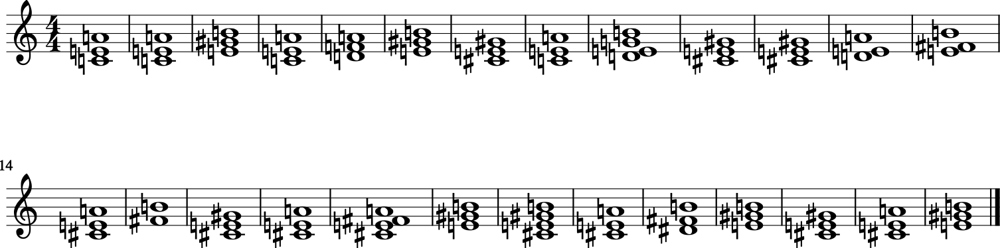

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


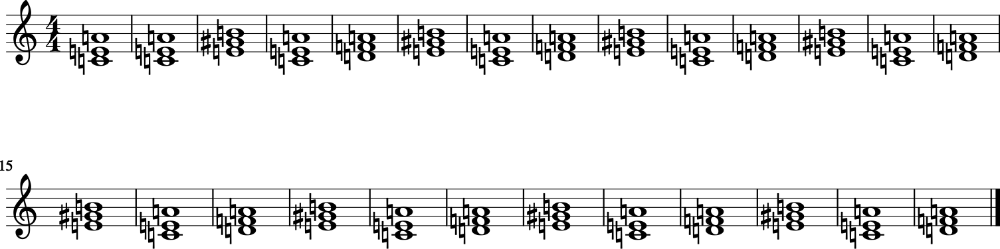

Epoch 46/50
1136924/1136924 [==============================] - 98s 86us/step - loss: 1.7711 - accuracy: 0.5228

Epoch 00046: loss improved from 1.77159 to 1.77112, saving model to word_pred_Model4_2.h5
Epoch: 46
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'C', 'Dm', 'Am', 'Am', 'G', 'Dm', 'Am', 'Am', 'G', 'Dm', 'Am', 'Am', 'G', 'Dm', 'Am', 'Am', 'G', 'Dm', 'Am']


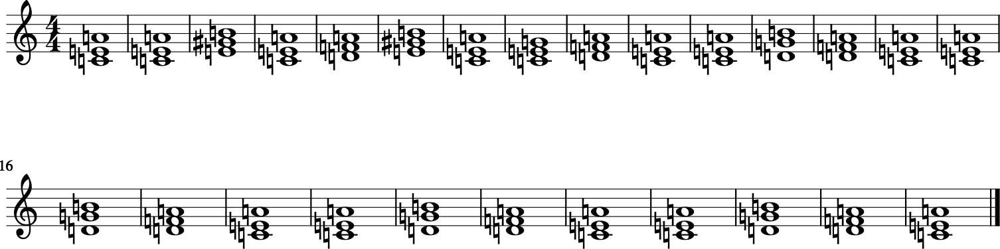

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'G', 'G', 'Am', 'F', 'G', 'Am', 'F', 'G', 'Am', 'G', 'Am', 'F', 'C', 'Bb', 'F']


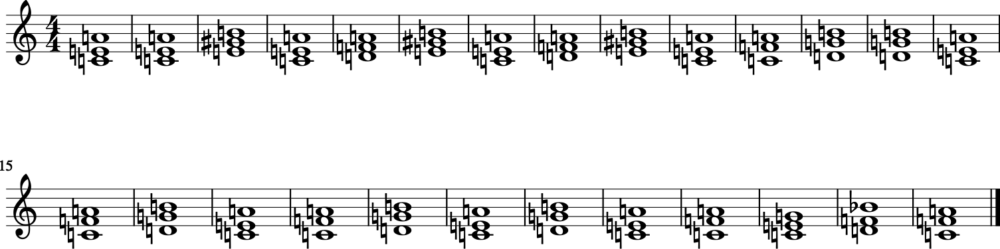

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E7', 'Am', 'Dm', 'E', 'E7', 'Am', 'Dsus2', 'Bb6', 'D', 'Fadd9', 'Bbm7', 'D5', 'E5', 'G', 'E', 'C5', 'F#5', 'E', 'E', 'Db']


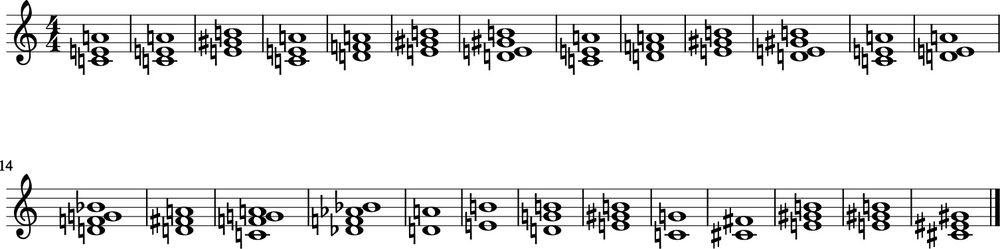

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


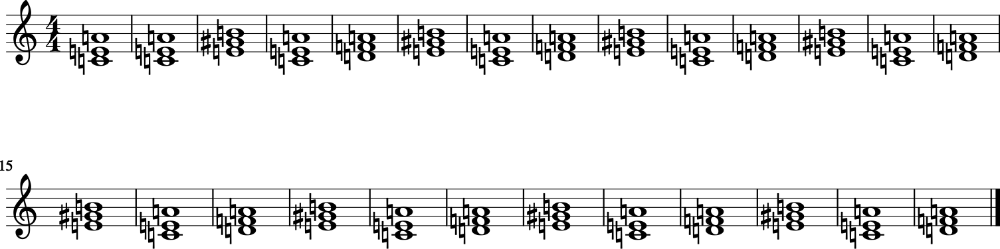

Epoch 47/50
1136924/1136924 [==============================] - 96s 84us/step - loss: 1.7701 - accuracy: 0.5231

Epoch 00047: loss improved from 1.77112 to 1.77012, saving model to word_pred_Model4_2.h5
Epoch: 47
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F']


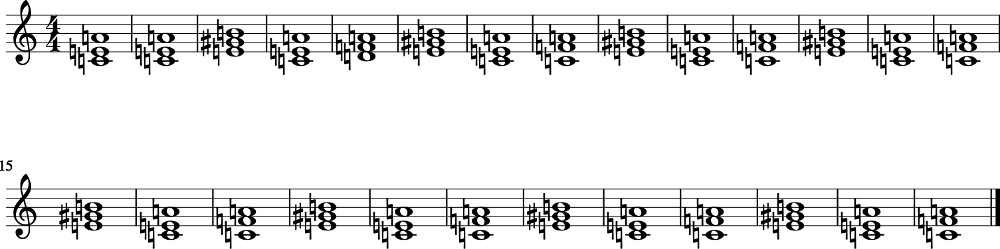

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'C', 'Em', 'C', 'Am', 'D7', 'E', 'D', 'A', 'Em', 'A7', 'D', 'Em', 'A7', 'A7', 'D', 'C', 'G']


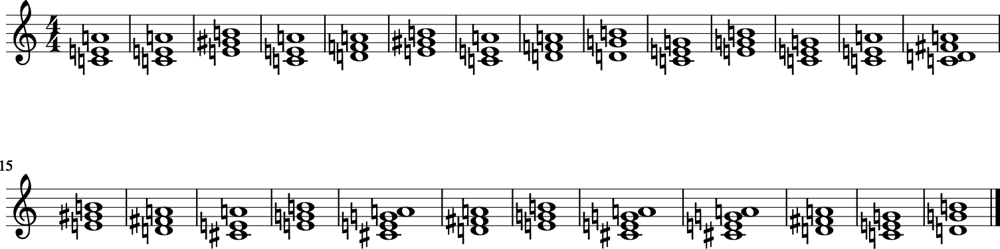

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm7', 'F', 'Fm7', 'Dm', 'A7', 'E', 'DAmMaj7', 'D7+9', 'Dm7', 'F', 'Ab6', 'C7', 'Dm', 'A7', 'Dm', 'G7', 'F', 'Gm']


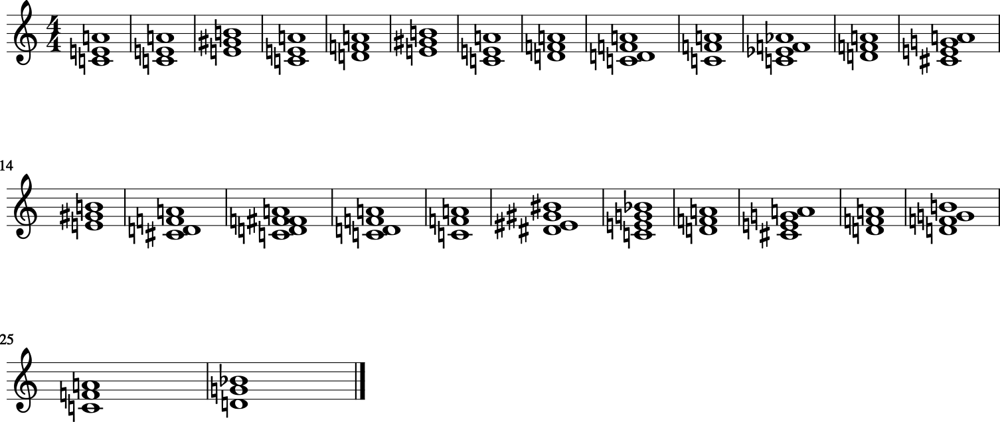

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


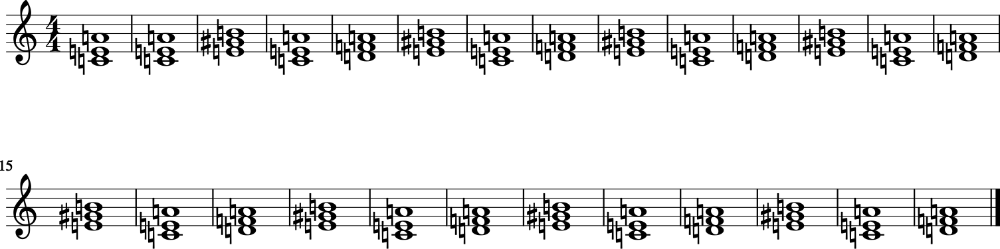

Epoch 48/50
1136924/1136924 [==============================] - 96s 84us/step - loss: 1.7693 - accuracy: 0.5231

Epoch 00048: loss improved from 1.77012 to 1.76933, saving model to word_pred_Model4_2.h5
Epoch: 48
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'E', 'Am', 'Dm', 'F', 'Am', 'F', 'Dm', 'A7', 'Dm', 'DAmMaj7', 'Dm', 'Dm', 'E', 'Am7', 'Am7', 'Dm7', 'C']


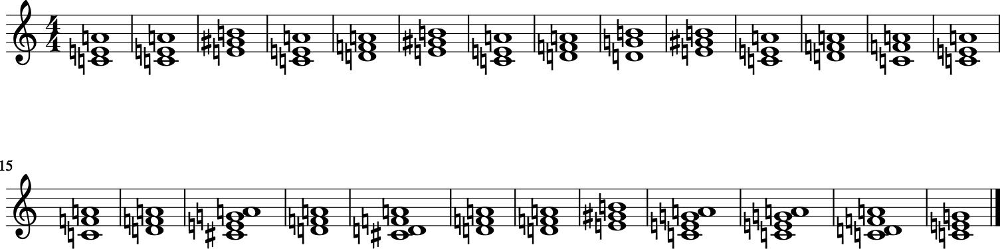

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'Dm', 'Dm7', 'C7', 'C', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm', 'Dm']


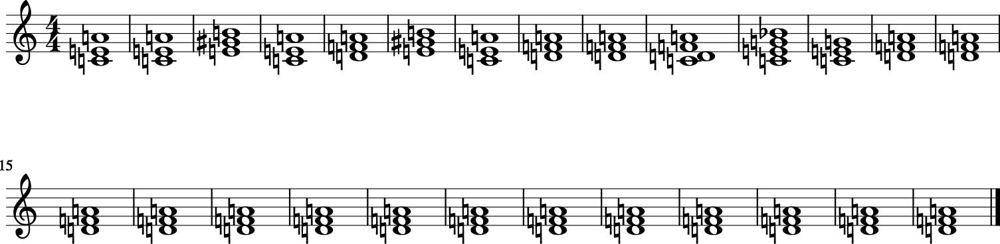

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'E', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E7', 'Am', 'Am', 'Dm', 'E7', 'Am', 'Dm', 'A', 'C', 'Dm', 'Em', 'F']


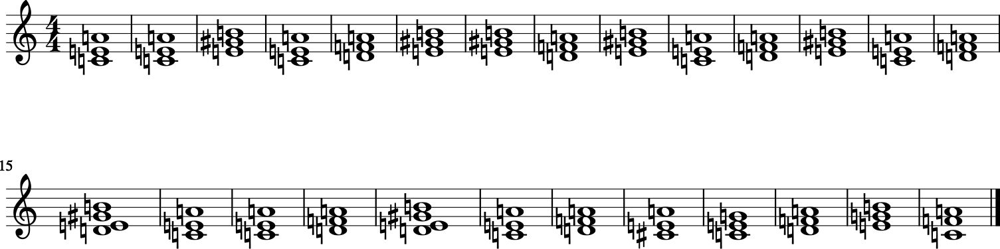

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


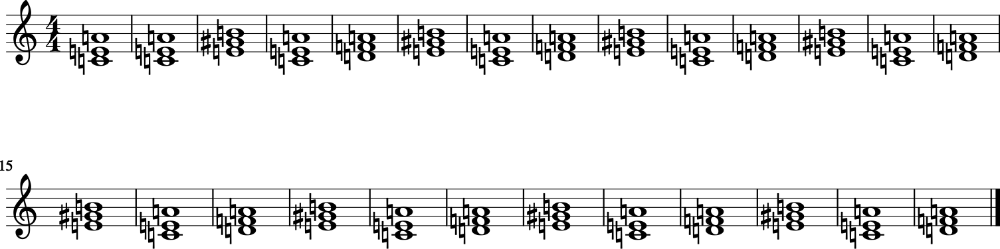

Epoch 49/50
1136924/1136924 [==============================] - 89s 78us/step - loss: 1.7693 - accuracy: 0.5235

Epoch 00049: loss did not improve from 1.76933
Epoch: 49
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'G', 'C', 'C', 'Dm', 'G', 'C', 'Dm', 'C', 'Dm', 'Am', 'Bb', 'F', 'Bb', 'Am', 'Am', 'Am', 'Dm', 'Am']


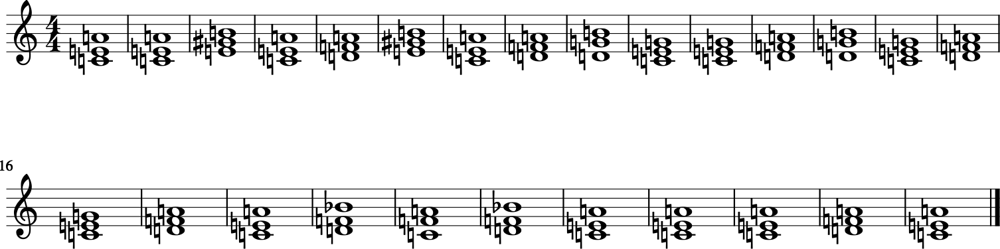

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'C', 'Dm', 'C', 'C', 'G', 'Am', 'Dm', 'Em', 'Am', 'Am', 'Em', 'Am', 'C', 'Em', 'Am', 'Am', 'C', 'Em']


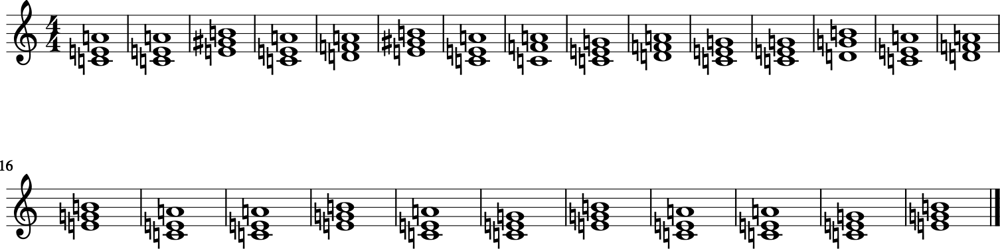

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'F', 'C', 'Dm7', 'Em', 'Am', 'G6', 'Am', 'FM7', 'Am', 'FM7', 'C', 'Am', 'C', 'Am', 'C', 'Am', 'C', 'Am', 'C', 'E']


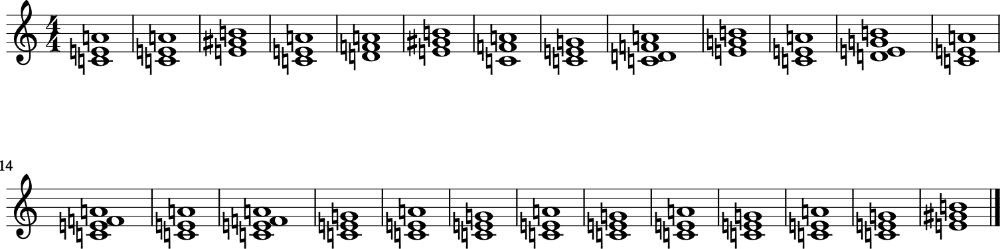

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


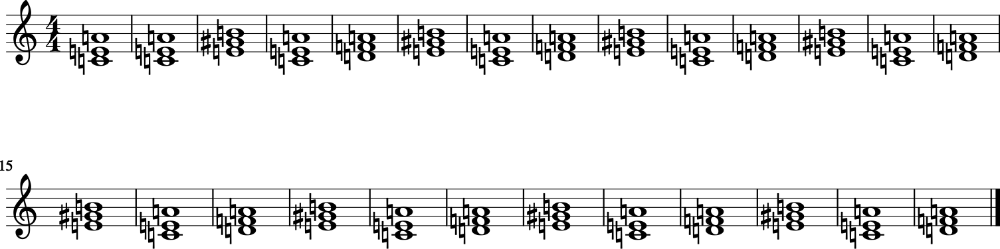

Epoch 50/50
1136924/1136924 [==============================] - 96s 85us/step - loss: 1.7683 - accuracy: 0.5236

Epoch 00050: loss improved from 1.76933 to 1.76827, saving model to word_pred_Model4_2.h5
Epoch: 50
Diversity: 0.8
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'G']


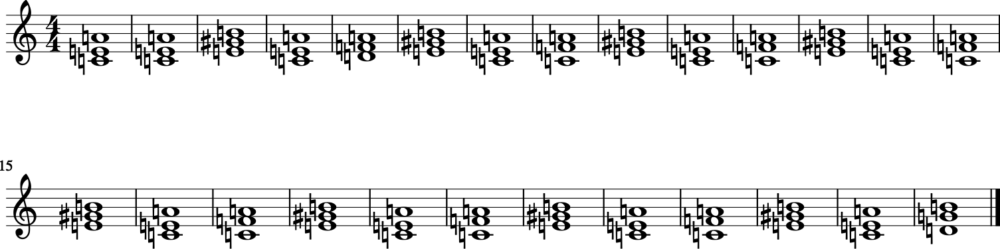

Diversity: 1.0
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'F', 'E', 'Am', 'F', 'E', 'Am', 'F', 'Dm', 'Am', 'E', 'F', 'Dm', 'Am', 'C', 'F', 'Dm', 'F', 'F', 'Dm']


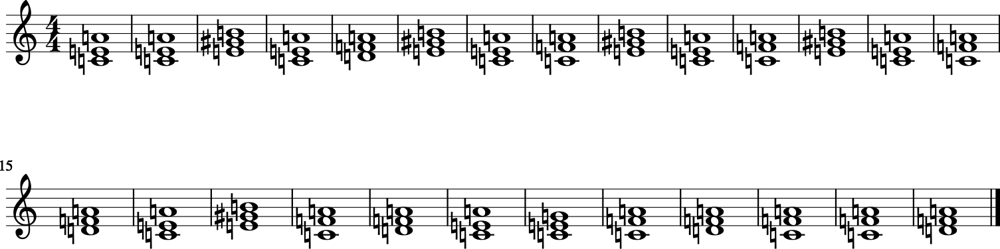

Diversity: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'G', 'Am', 'C', 'Am', 'Am', 'G', 'C', 'Am', 'G', 'C', 'Am', 'G', 'C', 'Am', 'G', 'C', 'Am']


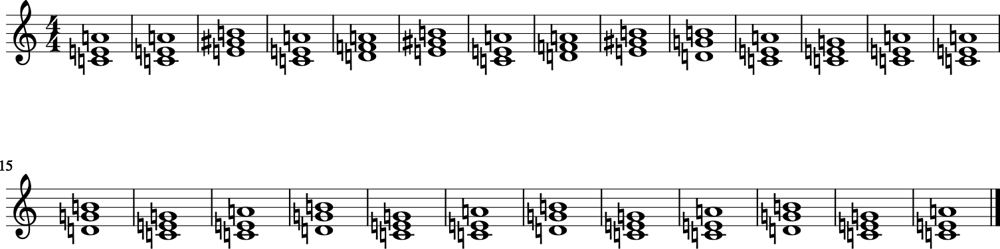

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


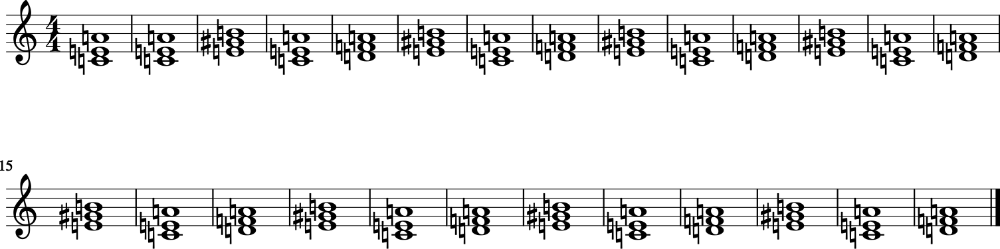

In [70]:
model = create_model()
path = 'word_pred_Model4_2.h5'
checkpoint = ModelCheckpoint(path, monitor='loss', verbose=1, save_best_only=True, mode='min')
model.fit(X,Y,epochs=50,batch_size=128,verbose=1,use_multiprocessing=True,callbacks=[checkpoint, PredictionCallback()])


Diversity: 0.8
['C', 'G', 'C', 'D', 'G', 'C', 'G', 'C', 'G', 'C', 'G', 'C', 'G', 'C', 'C', 'G', 'G', 'C', 'C', 'Em', 'D', 'G', 'C', 'Em', 'D']


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


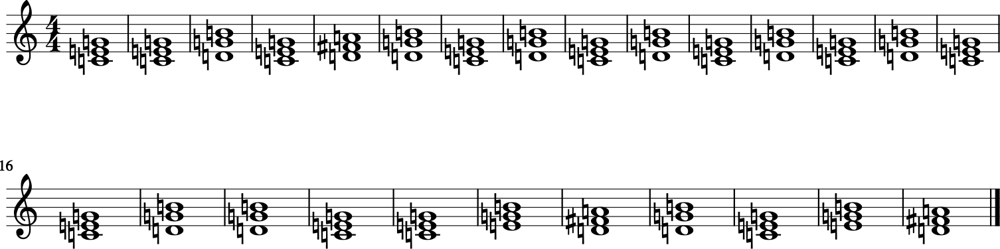

Diversity: 1.0
['C', 'G', 'C', 'D', 'G', 'G', 'G', 'G', 'G', 'C', 'C', 'D', 'G', 'C', 'G', 'D', 'Bm', 'G', 'D', 'Bm', 'G', 'D', 'Bm', 'Em', 'Bm']


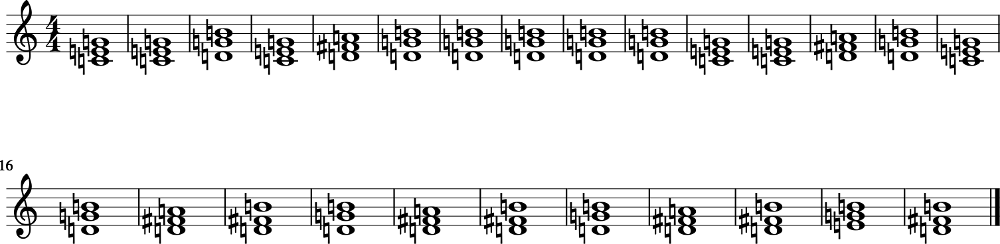

Diversity: 1.2
['C', 'G', 'C', 'D', 'G', 'C', 'Am', 'C', 'Em', 'Am', 'C', 'Am', 'C', 'Am', 'C', 'Am', 'F', 'E7', 'E', 'E7', 'E7', 'E7+9', 'A7', 'Dm', 'E7']


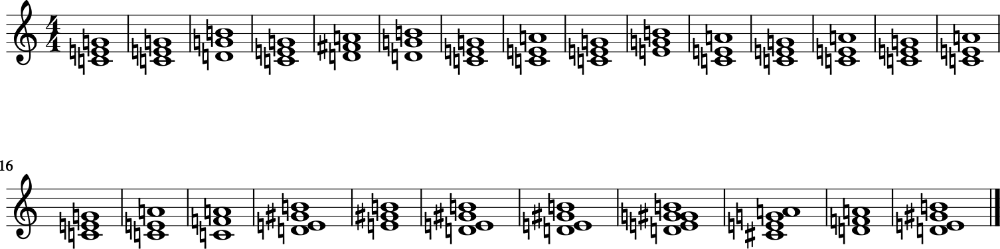

Direct prediction: 1.2
['Am', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm', 'E', 'Am', 'Dm']


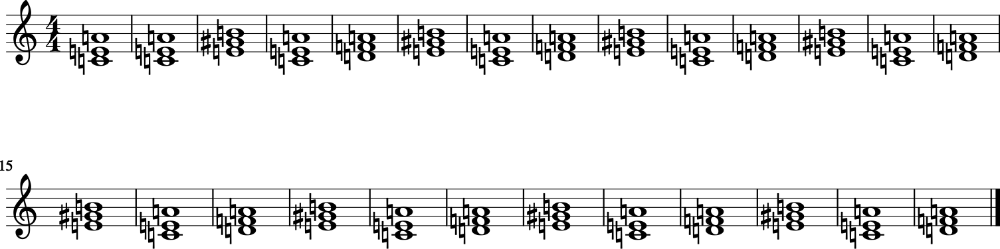

In [75]:
for diversity in [0.8, 1.0, 1.2]:
    print(f'Diversity: {diversity}')
    chord_str = ['C', 'G', 'C', 'D', 'G']

    for i in range(0,20):
        last_five = chord_str[-5:]
        last_five_encoded = [encoder.get_number_from_chord(chord) for chord in last_five]
        prediction = model.predict(np.array(np.array([last_five_encoded])))[0]
        chord_index = sample(prediction, diversity)
        chord_str.append(encoder.get_chord_from_number(chord_index))

    show_sequence(chord_str)
            
print(f'Direct prediction: {diversity}')
chord_str = ['Am', 'E', 'Am', 'Dm', 'E']

for i in range(0,20):
    last_five = chord_str[-5:]
    last_five_encoded = [encoder.get_number_from_chord(chord) for chord in last_five]
    chord_index = model.predict_classes(np.array(np.array([last_five_encoded])))[0]
    chord_str.append(encoder.get_chord_from_number(chord_index))

show_sequence(chord_str)

In [88]:
def show_song_sequence(song_name):
    show_sequence(df[df['name'] == song_name]['chords'].iloc[1])

['C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'Am', 'C/G', 'F', 'C', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'Am', 'C/G', 'F', 'C', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'Am', 'C/G', 'F', 'C', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'F', 'C/E', 'Dm', 'C', 'Bb', 'F/A', 'G', 'F', 'C', 'C', 'G', 'Am', 'F', 'C', 'G', 'F', 'C', 'Am', 'C/G', 'F', 'C', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'C', 'G', 'Am', 'Fmaj7', 'F6', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'Am', 'C/G', 'F', 'C', 'C', 'G', 'F', 'C/E', 'Dm', 'C', 'F', 'C/E', 'Dm', 'C', 'Bb', 'F/A', 'G', 'F', 'C']


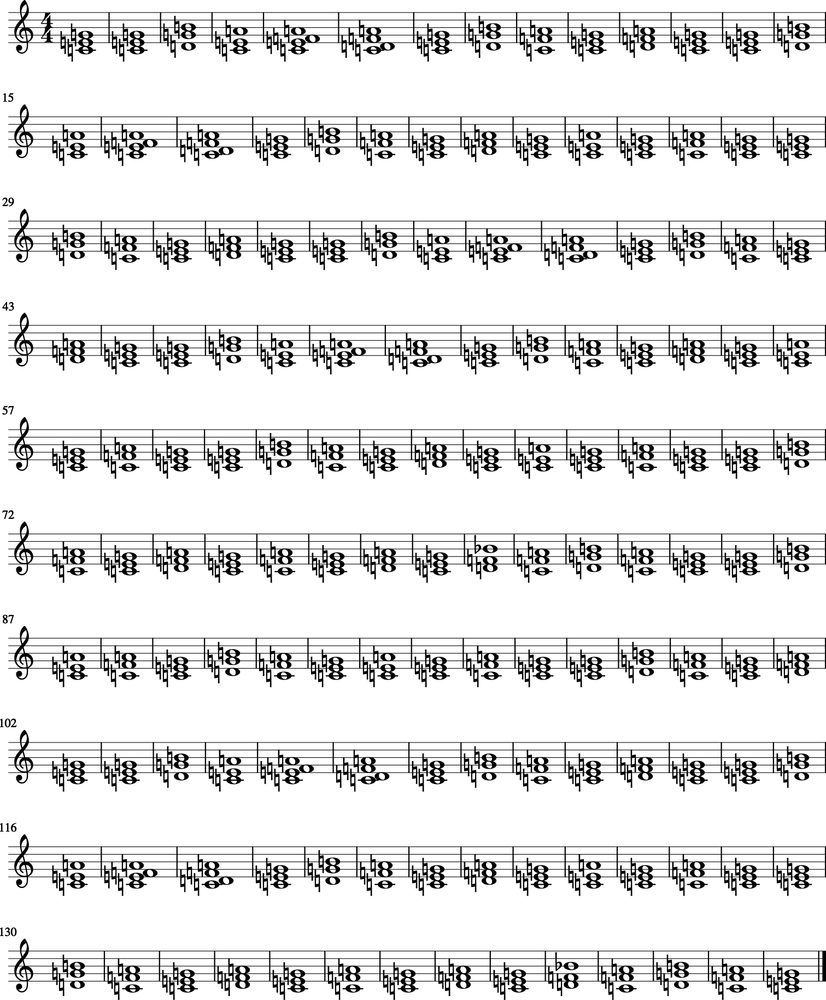

In [89]:
show_song_sequence('Let It Be')